#  <span style='color:DarkBlue'>P7 - Implémentez un modèle de scoring</span>

<div style="text-align:center">
    <img src="images/logo_proj7_credit.png" width="50%">
</div>

Ce notebook traite de la modélisation

En particulier :

- **choix algorithme** : utilisation de Pycaret pour lancer les différents modèles de classification installés dans nos environnements pour classer les modèles qui semblent être les plus performants pour notre jeu de données et en prenant en compte les différents scores, sélectionner le modèle le plus prometteur.
- **choix du jeu de données** : Entraînement des modèles de classification sur nos différents jeux de données issus du feature engineering et du feature selection (imputation avec la médiane/mode  ; imputation avec les constantes 0/XNA ou imputation avec NanImputer/ constante XNA) pour sélectionner le jeu de données à utiliser.
- **choix des métriques** : adaptées aux contraintes métiers de notre problématique.
- **optimisation modèle** : en traitant le déséquilibrage des classes, en sélectionnant les meilleurs hyperparamètres de notre modèle pour défavoriser le nombre de faux négatifs (prêt accordé non remboursé donc énormer perte d'argent pour Home Crédit).

***
Sources
***
- [Métriques_classification_théorie](https://www.deepl.com/fr/translator#en/fr/10.%20F-score%0ASimply%20put%2C%20it%20combines%20precision%20and%20recall%20into%20one%20metric.%20The%20higher%20the%20score%20the%20better%20our%20model%20is.%20You%20can%20calculate%20it%20in%20the%20following%20way%3A%0A)
- [Métriques_sklearn](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics)
- [BayesianOptimisation](https://www.kaggle.com/code/willkoehrsen/automated-model-tuning)

## <span style='background: PowderBlue'>1. Introduction</span>

*****
**Mission**
*****
**Développer un modèle de scoring de la probabilité de défaut de paiement du client** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

*****
**Objectifs**
*****
- analyser le jeu de données,
- Construire **un modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **dashboard interactif** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

*****
**Sources**
*****
- [Jeu de données](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **Kernel Kaggle** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur toutes les fichiers csv mis à notre disposition a été livré par **Rishabh Rao** (Student at -Jaipur, Rajasthan, India).
- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :
[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

In [1]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
import numpy as np
import pandas as pd
import os
import fonctions_data
import pickle
from collections import Counter

# Visualisation
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Data pré-processing
import sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler, \
    PowerTransformer, RobustScaler
# Oversampling
#from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
# UnderSampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

# Modelisation
# Préparation
from sklearn.model_selection import train_test_split, StratifiedKFold


# Modèles
# import pycaret
# from pycaret.classification import *
import lightgbm as lgb
from lightgbm import LGBMClassifier
# Optimisation bayésienne
from bayes_opt import BayesianOptimization
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, VerboseCallback
from skopt.space import Real, Categorical, Integer

# Oversampling
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
# UnderSampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from optuna import Trial, visualization
import optuna

# Métriques
from sklearn.metrics import roc_auc_score, average_precision_score, \
    fbeta_score, make_scorer, confusion_matrix, recall_score, precision_score, log_loss


from sklearn.model_selection import cross_validate, RandomizedSearchCV, \
    GridSearchCV, learning_curve  # , cross_val_score

# Interprétation
import shap

# Warnings
import warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Scikit-learn          : ' + sklearn.__version__)
print('Matplotlib            : ' + matplotlib.__version__)
print('Seaborn               : ' + sns.__version__)
print('Shape                 : ' + shap.__version__)
print('Lightgbm              : ' + lgb.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Scikit-learn          : 1.2.2
Matplotlib            : 3.7.5
Seaborn               : 0.13.2
Shape                 : 0.42.1
Lightgbm              : 4.0.0
Lancé le           : 2024-05-26T00:35:49.463636


## <span style='background: PowderBlue'>2. Chargement des datasets nettoyés</span>

**Chargement des dataframes issus du pré-processing**

#### <span style='background:mistyrose'>Train_set/test_set</span>

- **train_set** : jeu de données étiquetté (variable cible = TARGET) du train set, issu de la phase de pré-processing (nettoyage, gestion des valeurs manquantes, gestion des valeurs aberrantes, encodage, merge de tous les fichiers, feature engineering et feature sélection).

In [2]:
fic_sav_train_set = \
    'pickle_files/train_set.pickle'
# Chargement de train_set
with open(fic_sav_train_set, 'rb') as df_appli_train_set:
    train_set = pickle.load(df_appli_train_set)
train_set.shape

(307507, 218)

- **test_set** : jeu de données non étiquetté (sans la variable cible TARGET) du test set, issu de la phase de pré-processing (nettoyage, gestion des valeurs manquantes, gestion des valeurs aberrantes, encodage, merge de tous les fichiers, feature engineering et feature sélection).

In [3]:
fic_sav_test_set = \
    'pickle_files/test_set.pickle'
# Chargement de test_set
with open(fic_sav_test_set, 'rb') as df_appli_test_set:
    test_set = pickle.load(df_appli_test_set)
test_set.shape

(48744, 217)

***Note*** :
***
- l'imputation est effectuée :
    - valeurs quantitatives : médiane,
    - valeurs qualitatives : mode.

## <span style='background: PowderBlue'>3. Préparation du dataset</span>

In [4]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21
print(f'Nombre aléatoire : {seed}')

Nombre aléatoire : 21


### <span style='background:orange'>3.1. Split du jeu d'entraînement en entraînement/validation</span>

**Vecteur y**

In [5]:
# Vecteur y cible
y = train_set['TARGET']
print(f'y : {y.shape}')

y : (307507,)


**Matrice X**

In [6]:
# Matrice X
# Copie du jeu de données
train_set = train_set.copy(deep=True)
# Passage de l'identifiant du client en index pour la modélisation
train_set.set_index('SK_ID_CURR', inplace=True)
# Suppression de la variable cible pour la modélisation
X = train_set.drop(['TARGET'], axis=1)
print(f'X : {X.shape}')

X : (307507, 216)


**Découpage du jeu d'entraînement**

In [7]:
# Découpage du jeu d'entraînement en :
# X_train : pour entraîner le modèle et trouver les meilleurs
#           hyperparamètres
# X_valid : pour évaluer les performances du modèle
X_train, X_valid, y_train, y_valid = train_test_split(X, y,
                                                      test_size=0.2,
                                                      shuffle=True,
                                                      stratify=y,
                                                      random_state=seed)
print(f'X_train : {X_train.shape} - y_train : {y_train.shape}')
print(f'X_valid : {X_valid.shape} - y_valid : {y_valid.shape}')

X_train : (246005, 216) - y_train : (246005,)
X_valid : (61502, 216) - y_valid : (61502,)


## <span style='background: PowderBlue'>4. Choix des métriques</span>

### <span style='background:orange'>4.1.  Métriques de classification à 2 modalités (binaires)</span>

**Problématique**
***
- Pour notre problématique :
    - Les **défaillants** forment la classe **positive**.
    - Les **non-défaillants** forment la classe **négative**.
- Pour minimiser les pertes d'argent, nous devons :
    - Nous efforcer de ne pas prédire un client non-défaillant s'il est défaillant ==> **minimiser le nombre de faux négatifs (erreur de type II)** (prédit non-défaillant mais client défaillant). Si un défaillant est prédit non-défaillant, le groupe Home Crédit aura perdu toute la somme prêtée à l'emprunteur. Cela constitue les plus grosses pertes pour l'entreprise.
    - Nous efforcer de ne pas prédire de défaillant si le client n'est pas défaillant donc **minimiser les faux positifs (erreur de type I)** (classe 1 défaillant alors que non-défaillant dans la réalité). Si un non-défaillant est prédit défaillant, le groupe Home Crédit aura perdu les intérêts de la somme prêtée à l'emprunteur.
    
**Métriques**
***
- **Recall** : la métrique pour déterminer le **taux de vrais positifs** est le Rappel (Sensibilité)/**Recall**. Elle mesure parmi toutes les observations positives combien ont été classées comme positives. Pour ne pas avoir de pertes, il faut détecter tous les défaillants (classe positive), donc **maximiser la métrique recall** : 
$$
\text {Recall}=\frac{\text {TP}}{\text {TP}+\text {FN}}
$$

- **Precision** : elle mesure le nombre d'observations prédites comme positives (client défaillant) qui le sont en réalité. Si le client est prédit défaillant alors qu'il ne le sera pas, le prêt ne sera pas accordé et les intérêts ne seront pas empochés. Il faut donc **maximiser la Precision** :
$$
\text {Précision}=\frac{\text {TP}}{\text {TP}+\text {FP}}
$$

- **F-mesure ou F1** : 

La mesure de la F1 Score est définie comme la moyenne harmonique de la précision (precision) et du rappel (recall). Elle est donnée par la formule suivante :

$$
F1 = 2 \cdot \frac{\text{precision} \cdot \text{recall}}{\text{precision} + \text{recall}}
$$

Ensemble, cela forme la mesure F1, qui combine à la fois la précision et le rappel en une seule métrique.

- Si on augmente le recall, la précision diminue. Il s'agit de faire un compromis entre ces deux métriques qui dépendent l'une de l'autre, en prenant en compte le métier/problème de l'entreprise et les coûts associés pour répondre à ces questions.
- Dans notre cas, il faut trouver le plus grand nombre d'observations réellement positives (client prédit défaillant et bien défaillant) et la perte est moins grande si on prédit un client défaillant mais qu'il ne l'est pas (faux positifs). Donc, **on donnera priorité à maximiser le recall au détriment de la précision** (on parle bien de précision, pas d'accuracy).
- Le réglage du paramètre beta pour le Fbeta score permet de donner plus de poids au recall ($\beta > 1$) qu'à la précision ($0 < \beta < 1$).

- **Autrement dit, nous nous intéressons à la F-mesure qui résumera la capacité d'un modèle à minimiser les erreurs de classification pour la classe positive tout en privilégiant les modèles qui minimisent les faux négatifs plutôt que les faux positifs.** 

Ceci peut être réalisé en utilisant une version de la F-mesure qui calcule une moyenne harmonique pondérée de précision et de rappel mais privilégie les scores de rappel supérieurs aux scores de précision. C'est ce qu'on appelle la **mesure Fbeta**, une généralisation de la F-mesure, où bêta est un paramètre qui définit la pondération des deux scores. 

La valeur de bêta dépend donc de manière indirecte de la fonction de perte que nous souhaitons appliquer sur chacun des deux cas erronés : les faux positifs et les faux négatifs.

Une valeur bêta de 2 accordera plus d'attention au rappel qu'à la précision et est appelée la mesure F2. 
$$
\text { F2-measure }=\frac{\left(1+\beta^2\right) \times \text { Precision } \times \text { Recall }}{\beta^2 \times \text { Precision }+\text { Recall }}
$$

Nous utiliserons donc cette mesure pour évaluer les modèles sur l'ensemble de nos données. Elle peut être obtenue à l'aide de la fonction `fbeta_score()` de scikit-learn.

- **Score ROC AUC** : Le score ROC AUC est équivalent au calcul de la corrélation de rang entre les prédictions et la cible. Du point de vue de l'interprétation, il est plus utile car il nous indique à quel point votre modèle est bon pour classer les prédictions. Il vous indique la probabilité qu'une instance positive choisie au hasard soit classée plus haut qu'une instance négative choisie au hasard.

- **Score PR AUC** : calcule de l'aire sous la courbe précision-rappel pour obtenir un nombre qui vous donne des informations sur la performance du modèle. À utiliser : 
    - lorsque vous voulez communiquer la décision de précision/rappel à d'autres parties prenantes et que vous voulez choisir le seuil qui correspond au problème de l'entreprise.
    - lorsque vos données sont fortement déséquilibrées. Puisque l'AUC de PR se concentre principalement sur la classe positive (PPV et TPR), elle se soucie moins de la classe négative fréquente.
    - quand vous vous souciez plus de la classe positive que de la classe négative. Si vous vous souciez davantage de la classe positive et donc du PPV et du TPR, vous devriez opter pour la courbe précision-rappel et la PR AUC (précision moyenne).


## <span style='background: PowderBlue'>5. Modélisation</span>

In [32]:
df_resultats = pd.DataFrame({})

In [33]:
df_taux = pd.DataFrame({})

In [35]:
# Métriques
roc_auc = make_scorer(roc_auc_score, greater_is_better=True,
                      needs_proba=True)
pr_auc = make_scorer(average_precision_score, greater_is_better=True,
                     needs_proba=True)
f1_score = make_scorer(fbeta_score, beta=1, greater_is_better=True)
f5_score = make_scorer(fbeta_score, beta=5, greater_is_better=True)
f10_score = make_scorer(fbeta_score, beta=10, greater_is_better=True)
custom_score = make_scorer(fonctions_data.custom_score,
                           greater_is_better=True)
custom_score_2 = make_scorer(fonctions_data.custom_score_2,
                           greater_is_better=True)
custom_score_3 = make_scorer(fonctions_data.custom_score_3,
                           greater_is_better=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

### <span style='background:orange'>5.1.  Modèle LGBM de base</span>

Les résultats de performance constitue la baseline pour comparer les modèles optimisés.

**Sans réajustement**

In [38]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base = LGBMClassifier(random_state=seed, verbose=0,
                           force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base,0.038268,0.552326,0.071577,0.039689,0.038624,0.777889,0.265661,0.780116,11.636295,11.934645,0.830767,0.000523,0.779387,0.003824,0.051281,0.001900,0.033837,0.004014,0.743325,0.007112,0.533626,0.036840


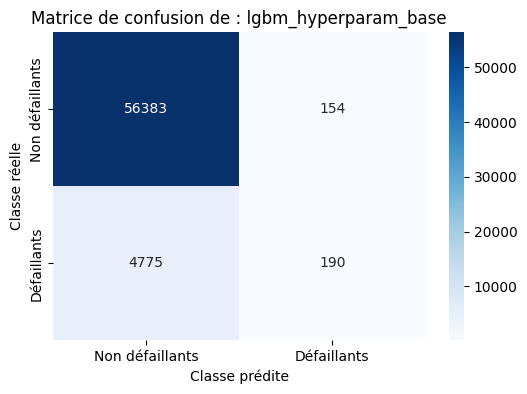

In [39]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base, X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_hyperparam_base')

In [41]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base',
                                        4775, 154, 190, 56383, df_taux)

**Avec réajustement**

In [42]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base_bal = LGBMClassifier(random_state=seed, verbose=0,
                               force_col_wise=True,
                               class_weight='balanced')

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base_bal,0.683585,0.182748,0.288397,0.618401,0.665526,0.778772,0.267466,0.720680,11.742327,12.196174,0.828682,0.000487,0.780507,0.004490,0.760731,0.001381,0.689023,0.007811,0.201630,0.000542,0.182999,0.001905


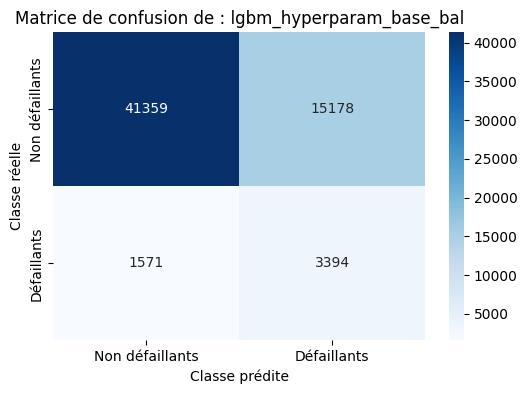

In [43]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base_bal, X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_hyperparam_base_bal')

In [45]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base_bal',
                                        1571, 15178, 3394, 41359, df_taux)

### <span style='background:orange'>5.1. Optimisation LGBM - Standardisation</span>

Normalement les modèles à base d'arbres décisionnels n'utilisant pas les distances ne nécessitent pas de données standardisées. La plupart des notebooks Kaggle utilisant la modélisation LightGBM utilise les données standardisées sans l'expliquer. Est-ce que cela peut avoir un fort impact sur notre modèle? Nous observerons l'impact de la standardisation au  dataset.

#### <span style='background:Moccasin'>4.1.1. Standardisation - StandardScaler</span>

In [47]:
# StandardScaler
scaler_std = StandardScaler()

# Jeu d'entraînement du jeu d'entraînement
X_train_std = scaler_std.fit_transform(X_train.copy(deep=True))
# Jeu de validation du jeu d'entraînement
X_valid_std = scaler_std.transform(X_valid.copy(deep=True))

# Sauvegarde de la standardisation
with open('pickle_files/standardisation_std.pickle', 'wb') as f:
    pickle.dump(scaler_std, f, pickle.HIGHEST_PROTOCOL)

**Sans réajustement**

In [48]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base_std = LGBMClassifier(random_state=seed, verbose=0,
                               force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base_std,0.035247,0.541796,0.066188,0.036561,0.035576,0.777400,0.265931,0.779514,13.401907,13.668753,0.830862,0.000735,0.779404,0.003633,0.050850,0.001137,0.032477,0.003372,0.740068,0.011042,0.510854,0.029073


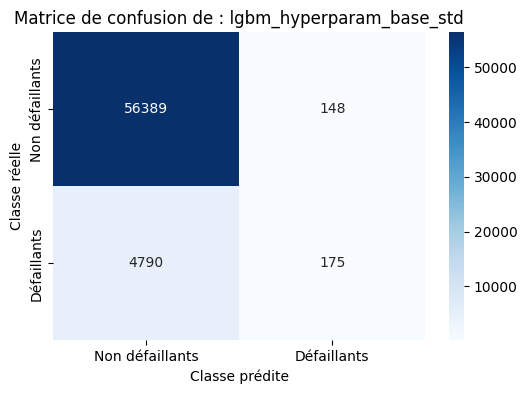

In [49]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base_std, X_train_std,
                                        X_valid_std, y_train, y_valid,
                                        df_resultats,
                                        'lgbm_hyperparam_base_std')

In [50]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base_std',
                                        4790, 148, 175, 56389, df_taux)

**Avec réajustement**

In [51]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base_std_bal = LGBMClassifier(random_state=seed, verbose=0,
                                   force_col_wise=True,
                                   class_weight='balanced')

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base_std_bal,0.687412,0.182954,0.288992,0.621502,0.669144,0.780085,0.269016,0.720671,13.528310,14.013359,0.828329,0.000416,0.780107,0.003918,0.760736,0.001454,0.690030,0.008182,0.201417,0.000472,0.182751,0.001798


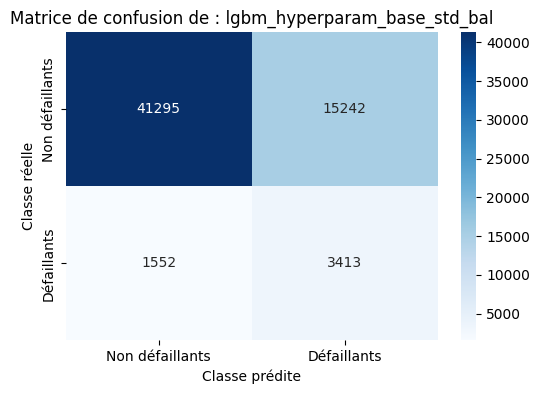

In [52]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base_std_bal, X_train_std,
                                        X_valid_std, y_train, y_valid,
                                        df_resultats,
                                        'lgbm_hyperparam_base_std_bal')

In [53]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base_std_bal',
                                        1552, 15242, 3413, 41295, df_taux)

#### <span style='background:Moccasin'>4.1.2. Standardisation - MinMaxScaler</span>

In [54]:
# MinMaxScaler
scaler_min = MinMaxScaler()

# Jeu de la target de consommation d'énergie non transformée en log10
X_train_min = scaler_min.fit_transform(X_train.copy(deep=True))
X_valid_min = scaler_min.transform(X_valid.copy(deep=True))

# Sauvegarde de la standardisation
with open('pickle_files/scaler_min.pickle', 'wb') as f:
    pickle.dump(scaler_min, f, pickle.HIGHEST_PROTOCOL)

In [55]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base_min = LGBMClassifier(random_state=seed, verbose=0,
                               force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base_minmax,0.038671,0.547009,0.072235,0.040104,0.039030,0.777225,0.266028,0.780139,11.526236,11.830937,0.830696,0.000578,0.779156,0.004157,0.051539,0.001555,0.034441,0.002628,0.747439,0.007462,0.541315,0.027462


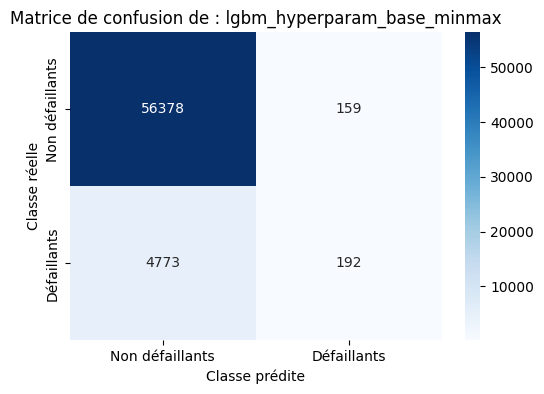

In [56]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base_min, X_train_min,
                                        X_valid_min, y_train, y_valid,
                                        df_resultats,
                                        'lgbm_hyperparam_base_minmax')

In [57]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base_minmax',
                                        4773, 159, 192, 56378, df_taux)

#### <span style='background:Moccasin'>4.1.3. Standardisation -  RobustScaler</span>

In [58]:
# RobustScaler
scaler_rob = RobustScaler()

X_train_rob = scaler_rob.fit_transform(X_train.copy(deep=True))
X_valid_rob = scaler_rob.transform(X_valid.copy(deep=True))

# Sauvegarde de la standardisation
with open('pickle_files/scaler_rob.pickle', 'wb') as f:
    pickle.dump(scaler_rob, f, pickle.HIGHEST_PROTOCOL)

In [59]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base_rob = LGBMClassifier(random_state=seed, verbose=0,
                               force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_hyperparam_base_robust,0.038469,0.577039,0.072130,0.039902,0.038828,0.779104,0.269684,0.780353,10.360339,10.642678,0.830931,0.000626,0.778880,0.004098,0.051578,0.001083,0.034189,0.004915,0.744436,0.006366,0.524629,0.049161


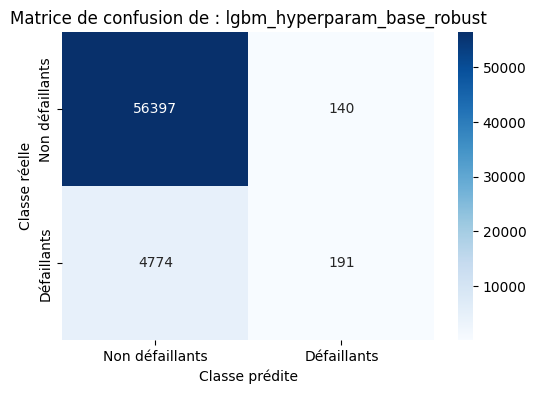

In [60]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_base_rob, X_train_rob,
                                        X_valid_rob, y_train, y_valid,
                                        df_resultats,
                                        'lgbm_hyperparam_base_robust')

In [61]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_hyperparam_base_robust',
                                        4774, 140, 191, 56397, df_taux)

**Bilan** :
Le nombre de faux négatifs est à peu près équivalent (4775 au lieu de 4790 et 4774) entre le jeux d'entraînement non standardisé et standardisée. Ce résultat nous conforte sur la connaissance théorique, à savoir que les algorithmes non basés sur des calculs de distances peuvent manipuler les données non standardisées.  

### <span style='background:orange'>5.2. Optimisation LGBM : meilleurs hyperparamètres BayesianOptimization</span>

Lors du projet 4, nous avons explorer l'optimisation en réglant les paramètres pas à pas, en utlisant RandomizedSearchCV, GridSearchCV et hyperopt. Nous allons découvrir l'optimisation Bayésienne en utilisant la librairie bayes_opt du MIT.

[Source](https://github.com/fmfn/BayesianOptimization)

#### <span style='background:Moccasin'>5.2.1. Optimisation LGBM : BayesianOptimization - Score ROC_AUC</span>

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_1**</span>
***
- sans forcer les paramètres :
    - learning_rate
    - n_estimators
    - class_weight

In [ ]:
# Définition de l'objective fonction
def lgbm_eval_1(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
#         'learning_rate' : 0.005,
#         'n_estimators' : 10000,
        'n_jobs' : -1,
#         'class_weight' : 'balanced', # Balanced        
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=3, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict_proba(x_cv,
                                   num_iteration=lgbm_clf.best_iteration_)[:,1]

    return roc_auc_score(y_train, cv_preds)

In [129]:
# Recherche des meilleurs paramètres 
lgbm_bayesian_opt_1 = \
    BayesianOptimization(lgbm_eval_1,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)})

bayesian_opt_1 = lgbm_bayesian_opt_1.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7772    | 0.5753    | 10.63     | 58.48     | 9.688     | 0.04448   | 28.83     | 0.2901    | 0.2063    | 0.5708    | 2.39      |
| 2         | 0.7777    | 0.815     | 9.597     | 74.82     | 37.99     | 0.09711   | 41.74     | 0.08341   | 0.1694    | 0.6632    | 3.964     |
| 3         | 0.7778    | 0.9808    | 10.06     | 42.98     | 20.08     | 0.03797   | 33.75     | 0.05156   | 0.01255   | 0.6919    | 6.526     |
| 4         | 0.7778    | 0.939     | 10.69     | 61.61     | 23.77     | 0.04477   | 32.82     | 0.1659    | 0.2082    | 0.6721    | 4.277     |
| 5         | 0.778     | 0.8098    | 8.953     | 44.95     | 73.18     | 0.01508   | 39.41     | 0.2021    | 0.2952    | 0.

In [130]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_1.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.6729234987448168, 'max_depth': 10.636388093387646, 'min_child_samples': 37.31507081447367, 'min_child_weight': 73.26412258532987, 'min_split_gain': 0.03852241141279626, 'num_leaves': 32.13239610597506, 'reg_alpha': 0.003953351836931666, 'reg_lambda': 0.001, 'subsample': 0.8181716095498573, 'subsample_freq': 6.62932035733105}


In [63]:
param_lgbm_bayesian_opt_1 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'colsample_bytree': 0.6729234987448168, 
                             'max_depth': 11, 
                             'min_child_samples': 37, 
                             'min_child_weight': 73.26412258532987, 
                             'min_split_gain': 0.03852241141279626, 
                             'num_leaves': 32, 
                             'reg_alpha': 0.003953351836931666, 
                             'reg_lambda': 0.001, 
                             'subsample': 0.8181716095498573, 
                             'subsample_freq': 7,
                             'verbosity' : -1,
                             'seed' : seed}

In [166]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_1 = pd.DataFrame.from_records(lgbm_bayesian_opt_1.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_1['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [148]:
# Espace de recherche des hyperparamètres

space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

Pour chaque paramètre, on peut obternir les valeurs essayées par la recherche aléatoire et l'optimisation bayésienne, ainsi que la distribution d'échantillonnage.

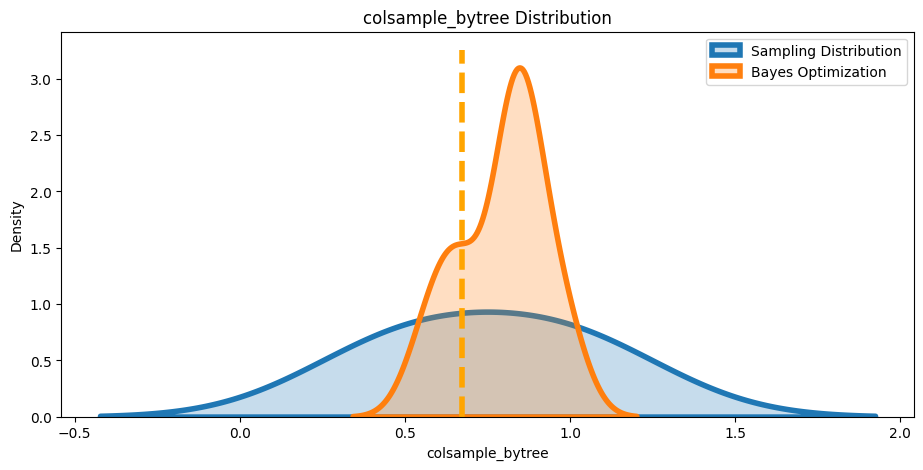

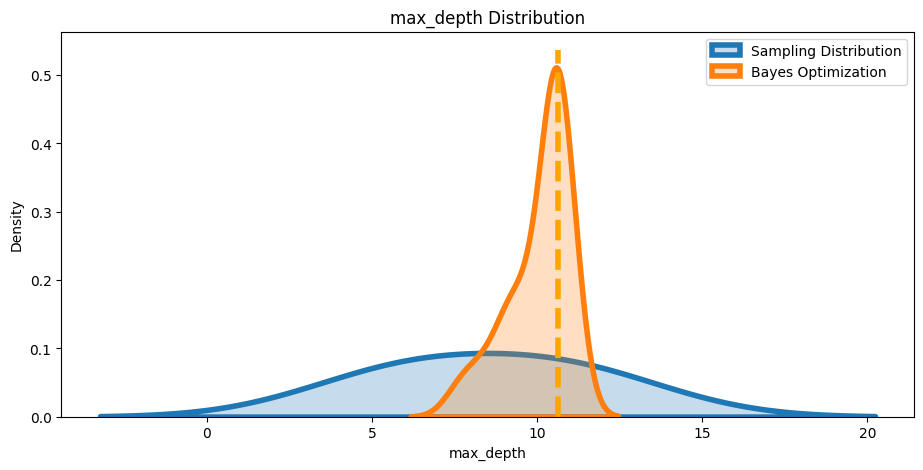

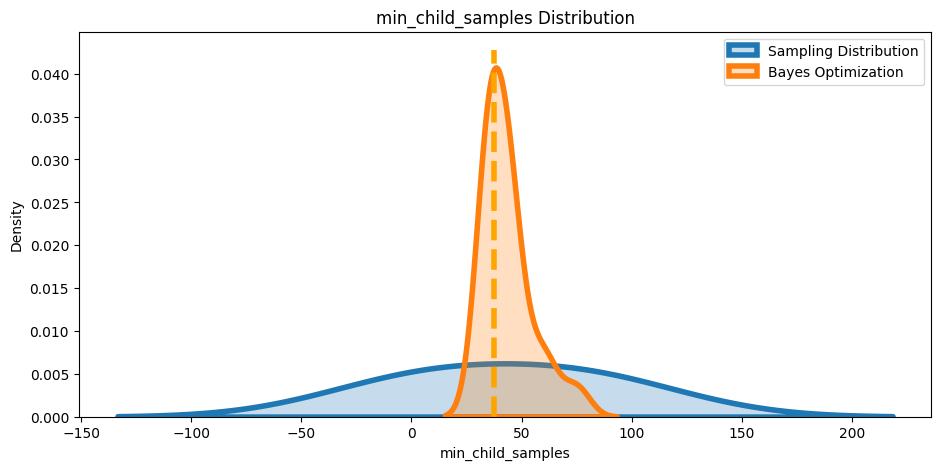

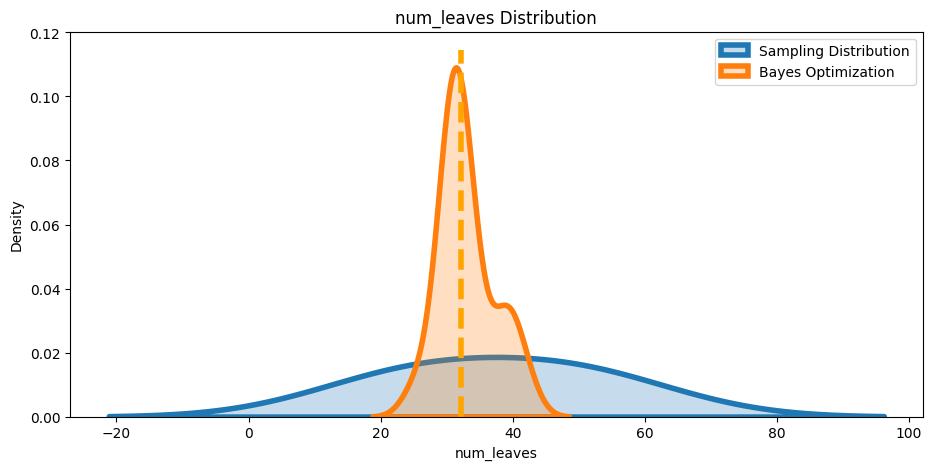

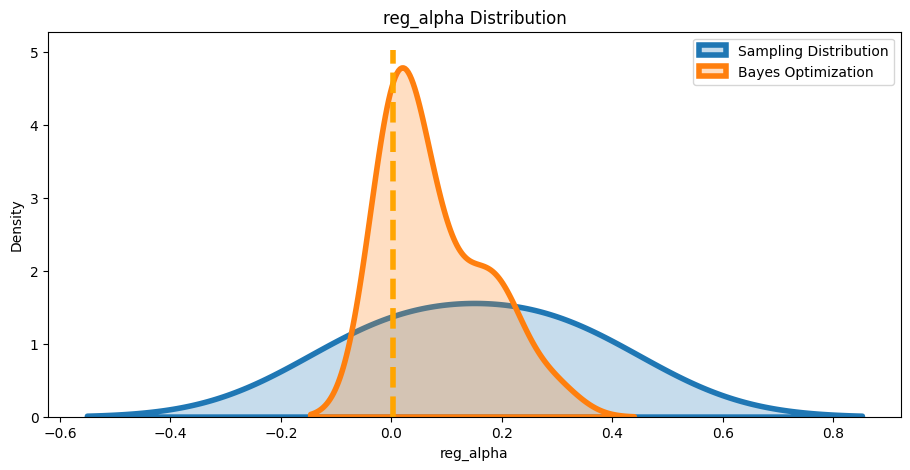

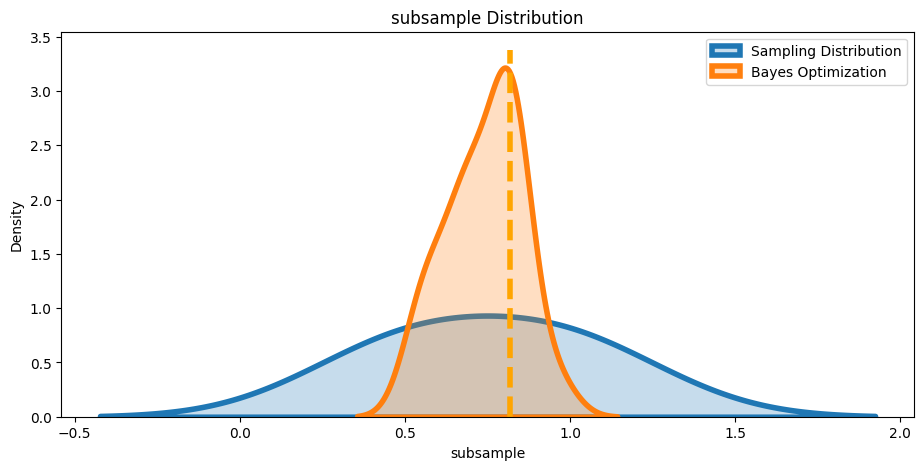

In [161]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

**Sans le paramètre class_weight='balanced'**

In [64]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_1 = LGBMClassifier(**param_lgbm_bayesian_opt_1,
                                     #class_weight='balanced',
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_1,0.046928,0.598972,0.087038,0.048653,0.047361,0.778726,0.272531,0.782050,9.738841,10.146774,0.818744,0.000352,0.781525,0.004337,0.052143,0.001198,0.037664,0.001727,0.679163,0.007612,0.533811,0.037987


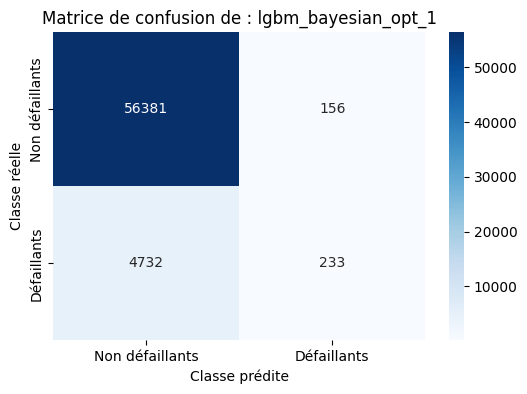

In [65]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_1,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_1')

In [66]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_1',
                                        4732, 156, 233, 56381, df_taux)

In [ ]:
from yellowbrick.classifier import ROCAUC

classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_1_fit = lgbm_bayesian_opt_1.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_1_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

**Avec le paramètre class_weight='balanced'**

In [67]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_1_bal = LGBMClassifier(**param_lgbm_bayesian_opt_1,
                                         class_weight='balanced',
                                         force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_1_bal,0.685398,0.183065,0.288953,0.619967,0.667269,0.779175,0.269307,0.720981,9.894611,10.309177,0.825058,0.000592,0.780164,0.003786,0.757228,0.001497,0.691440,0.013118,0.200636,0.000577,0.183154,0.003292


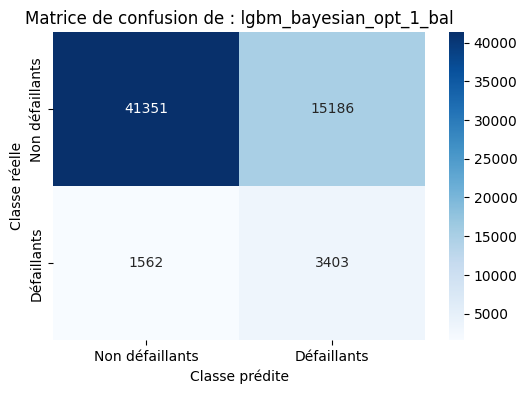

In [68]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_1_bal,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_1_bal')

In [69]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_1_bal',
                                        1562, 15186, 3403, 41351, df_taux)

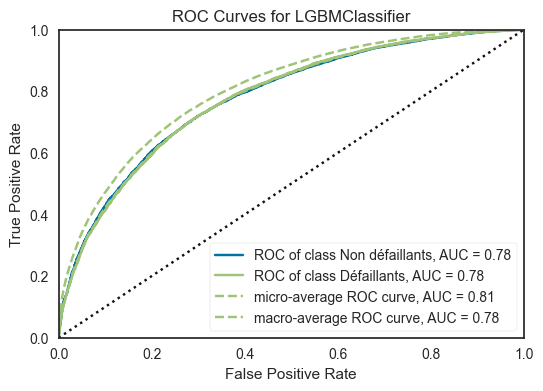

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [198]:
from yellowbrick.classifier import ROCAUC

classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_1_bal_fit = lgbm_bayesian_opt_1_bal.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_1_bal_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_2**</span>
***
- en initialisant les paramètres :
    - learning_rate,
    - n_estimators
- sans forcer le paramètre :    
    - class_weight.

In [178]:
# Définition de l'objective fonction
def lgbm_eval_2(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'learning_rate' : 0.005,
        'n_estimators' : 10000,
        'n_jobs' : -1,
#         'class_weight' : 'balanced', # Balanced
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=3, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict_proba(x_cv,
                                   num_iteration=lgbm_clf.best_iteration_)[:,1]

    return roc_auc_score(y_train, cv_preds)

In [187]:
# Objective fonction 
lgbm_bayesian_opt_2 = \
    BayesianOptimization(lgbm_eval_2,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                          random_state = 21)

bayesian_opt_2 = lgbm_bayesian_opt_2.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7846    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    | 4.502     |
| 2         | 0.7823    | 0.5348    | 10.34     | 14.99     | 18.36     | 0.04959   | 46.59     | 0.2279    | 0.2912    | 0.8797    | 3.306     |
| 3         | 0.7806    | 0.7044    | 9.567     | 25.3      | 69.06     | 0.09132   | 44.02     | 0.1555    | 0.05118   | 0.6493    | 2.704     |
| 4         | 0.7821    | 0.6636    | 8.301     | 45.83     | 21.31     | 0.07999   | 43.17     | 0.2549    | 0.08099   | 0.8074    | 4.917     |
| 5         | 0.7842    | 0.648     | 9.165     | 57.06     | 5.975     | 0.0146    | 25.77     | 0.1221    | 0.1662    | 0.

In [188]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_2.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.5, 'max_depth': 6.0, 'min_child_samples': 52.609429695676, 'min_child_weight': 7.450506332411459, 'min_split_gain': 0.0, 'num_leaves': 25.0, 'reg_alpha': 0.3, 'reg_lambda': 0.2548765098852773, 'subsample': 0.7055392026904478, 'subsample_freq': 7.0}


In [70]:
param_lgbm_bayesian_opt_2 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'learning_rate' : 0.005,
                             'n_estimators' : 10000,
                             'n_jobs' : -1,
                             'colsample_bytree': 0.5, 
                             'max_depth': 6, 
                             'min_child_samples': 53, 
                             'min_child_weight': 7.450506332411459, 
                             'min_split_gain': 0.0, 
                             'num_leaves': 25, 
                             'reg_alpha': 0.3, 
                             'reg_lambda': 0.2548765098852773, 
                             'subsample': 0.7055392026904478, 
                             'subsample_freq': 7,
                             'verbosity' : -1,
                             'seed' : seed}

In [190]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_2 = pd.DataFrame.from_records(lgbm_bayesian_opt_2.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_2['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [191]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

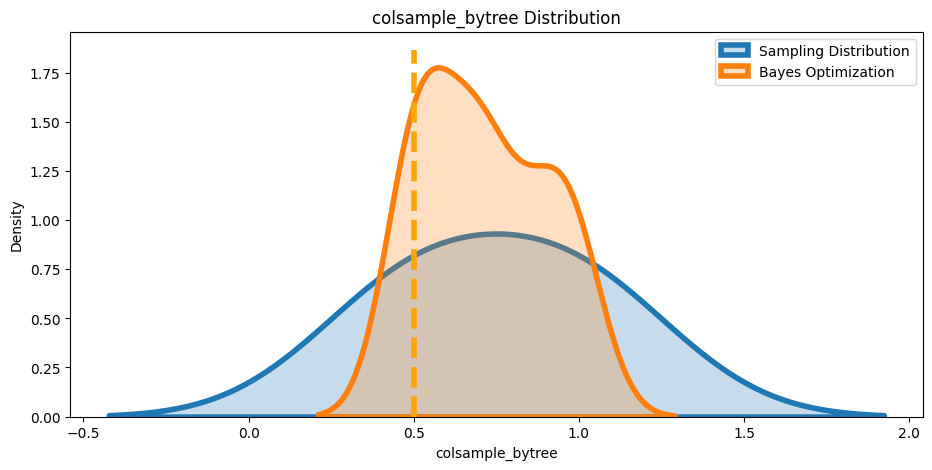

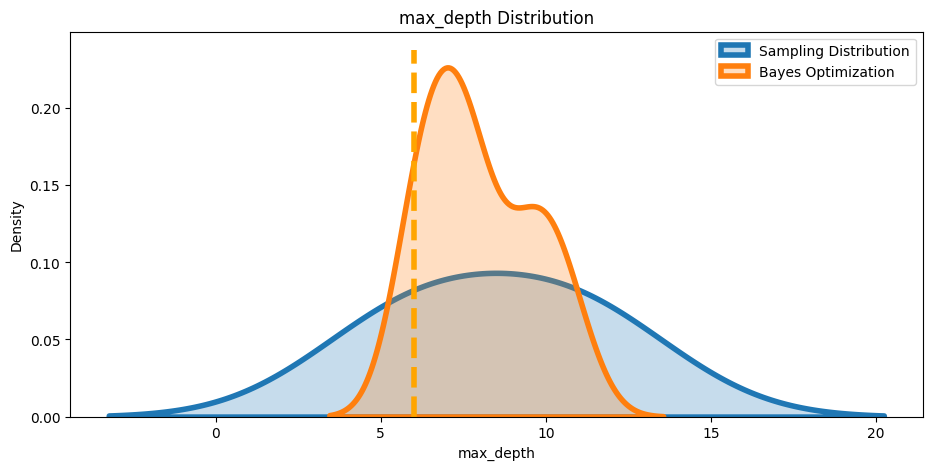

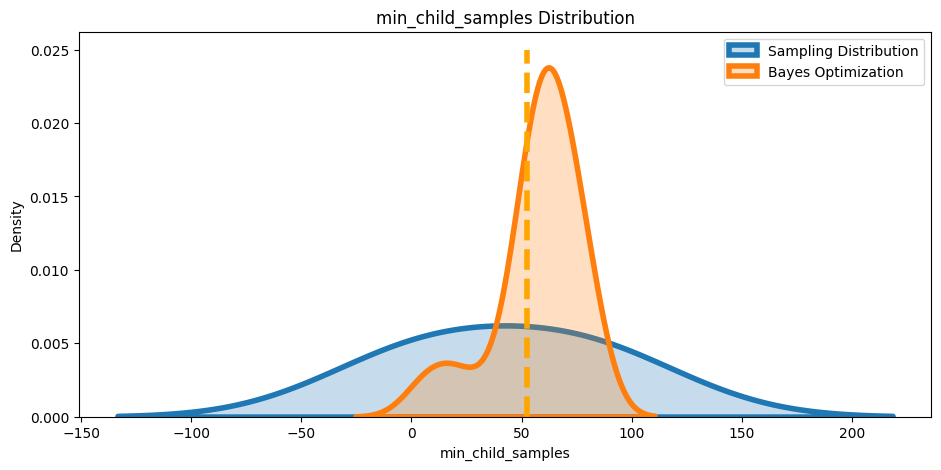

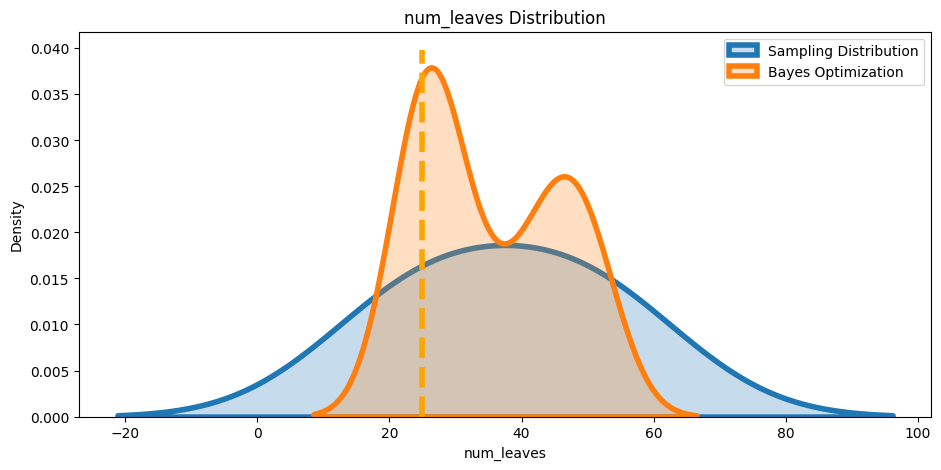

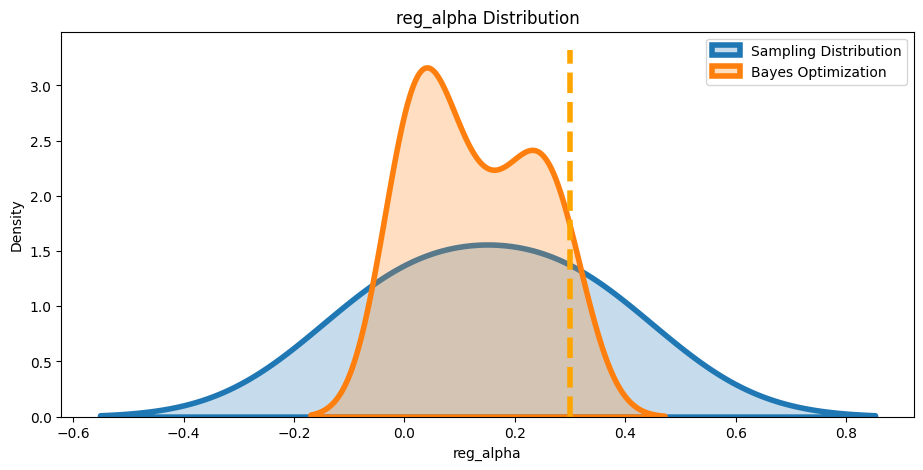

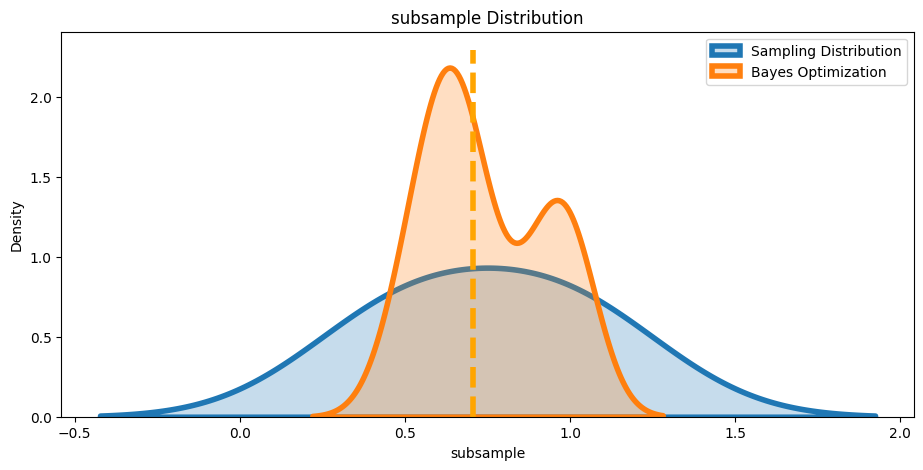

In [192]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [71]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_2 = LGBMClassifier(**param_lgbm_bayesian_opt_2,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_2,0.052165,0.570485,0.095590,0.054054,0.052639,0.785958,0.279519,0.782702,367.026009,390.305830,0.893792,0.000256,0.786925,0.004132,0.114876,0.001559,0.047533,0.003226,0.894570,0.002349,0.528716,0.039159


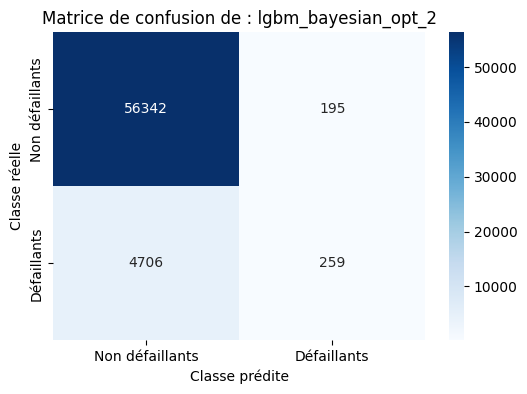

In [72]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_2,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_2')

In [73]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_2',
                                        4706, 195, 259, 56342, df_taux)

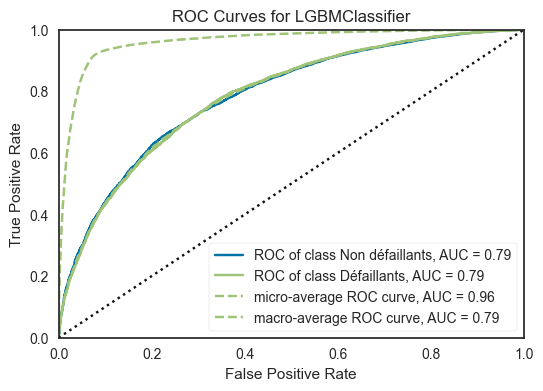

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [197]:
from yellowbrick.classifier import ROCAUC

classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_2_fit = lgbm_bayesian_opt_2.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_2_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_3**</span>
***
- en initialisant les paramètres :
    - learning_rate,
    - n_estimators,
    - class_weight.
- et en utilisant les hyperparamètres précedemment trouvés.

- Best hyperparameters: {'colsample_bytree': 0.5, 'max_depth': 6.0, 'min_child_samples': 52.609429695676, 'min_child_weight': 7.450506332411459, 'min_split_gain': 0.0, 'num_leaves': 25.0, 'reg_alpha': 0.3, 'reg_lambda': 0.2548765098852773, 'subsample': 0.7055392026904478, 'subsample_freq': 7.0} 

In [74]:
param_lgbm_bayesian_opt_3 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'learning_rate' : 0.005,
                             'n_estimators' : 10000,
                             'n_jobs' : -1,
                             'colsample_bytree': 0.5, 
                             'max_depth': 6, 
                             'min_child_samples': 53, 
                             'min_child_weight': 7.450506332411459, 
                             'min_split_gain': 0.0, 
                             'num_leaves': 25, 
                             'reg_alpha': 0.3, 
                             'reg_lambda': 0.2548765098852773, 
                             'subsample': 0.7055392026904478, 
                             'subsample_freq': 7,
                             'verbosity' : -1,
                             'seed' : seed}

In [75]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_3 = LGBMClassifier(**param_lgbm_bayesian_opt_3,
                                     force_col_wise=True,
                                     class_weight='balanced'
                                    )

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_3,0.629204,0.202620,0.306530,0.582071,0.616357,0.784506,0.276179,0.747826,525.562815,551.796172,0.904434,0.000251,0.784572,0.004417,0.850173,0.000987,0.633585,0.012315,0.273089,0.000632,0.205673,0.003489


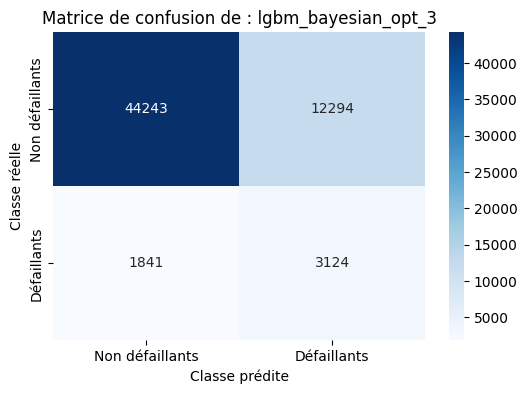

In [76]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_3,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_3')

In [77]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_3',
                                        1841, 12294, 3124, 44243, df_taux)

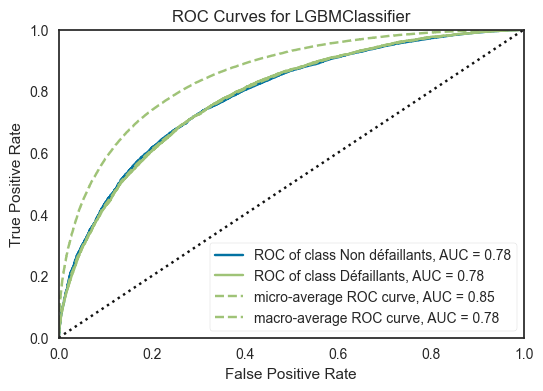

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [203]:
from yellowbrick.classifier import ROCAUC

classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_3_fit = lgbm_bayesian_opt_3.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_3_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_4**</span>
***
- sans initialiser les paramètres :
    - learning_rate,
    - n_estimators
- en forcant le paramètre suivant avant de lancer la recherche bayésienne :
    - class_weight='balanced'.

In [206]:
# Définition de l'objective fonction
def lgbm_eval_4(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
#         'learning_rate' : 0.005,
#         'n_estimators' : 10000,
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=3, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict_proba(x_cv,
                                   num_iteration=lgbm_clf.best_iteration_)[:,1]

    return roc_auc_score(y_train, cv_preds)

In [207]:
# Objective fonction 
lgbm_bayesian_opt_4 = \
    BayesianOptimization(lgbm_eval_4,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6,11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                          random_state = seed)

bayesian_opt_4 = lgbm_bayesian_opt_4.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7766    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    | 4.502     |
| 2         | 0.7792    | 0.5348    | 10.34     | 14.99     | 18.36     | 0.04959   | 46.59     | 0.2279    | 0.2912    | 0.8797    | 3.306     |
| 3         | 0.7776    | 0.7044    | 9.567     | 25.3      | 69.06     | 0.09132   | 44.02     | 0.1555    | 0.05118   | 0.6493    | 2.704     |
| 4         | 0.7769    | 0.6636    | 8.301     | 45.83     | 21.31     | 0.07999   | 43.17     | 0.2549    | 0.08099   | 0.8074    | 4.917     |
| 5         | 0.7769    | 0.7589    | 10.61     | 14.14     | 19.53     | 0.02771   | 46.51     | 0.22      | 0.1816    | 0.

In [208]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_4.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.5347854773063003, 'max_depth': 10.337022419965441, 'min_child_samples': 14.99303894388108, 'min_child_weight': 18.359349616962376, 'min_split_gain': 0.04959295498261558, 'num_leaves': 46.59249111395559, 'reg_alpha': 0.22792420681812217, 'reg_lambda': 0.2911750524793981, 'subsample': 0.8796512763927764, 'subsample_freq': 3.3055001925407765}


In [78]:
param_lgbm_bayesian_opt_4 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced
                             'colsample_bytree': 0.5347854773063003, 
                             'max_depth': 10, 
                             'min_child_samples': 15, 
                             'min_child_weight': 18.359349616962376, 
                             'min_split_gain': 0.04959295498261558, 
                             'num_leaves': 47, 
                             'reg_alpha': 0.22792420681812217, 
                             'reg_lambda': 0.2911750524793981, 
                             'subsample': 0.8796512763927764, 
                             'subsample_freq': 3,
                             'verbosity' : -1,
                             'seed' : seed}

In [211]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_4 = pd.DataFrame.from_records(lgbm_bayesian_opt_4.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_4['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [212]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6,11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

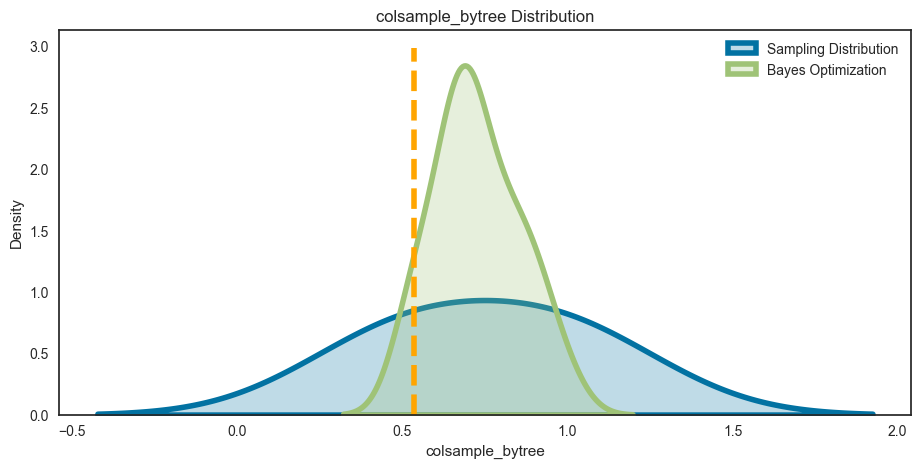

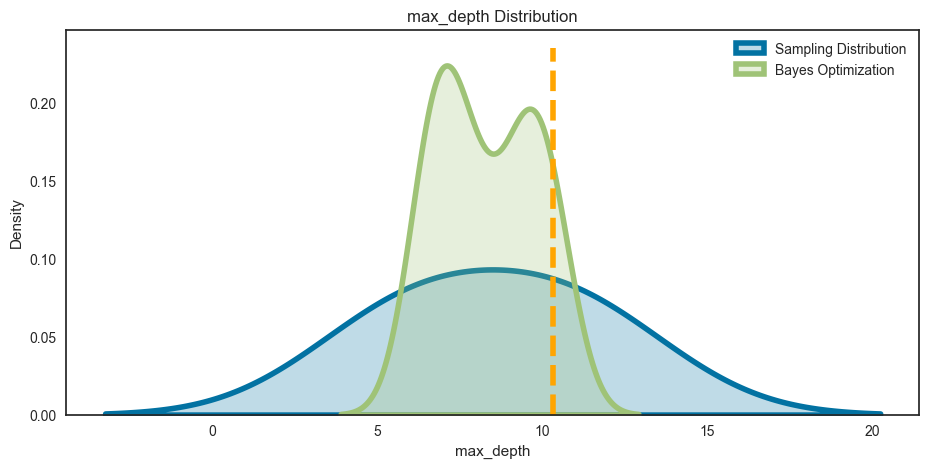

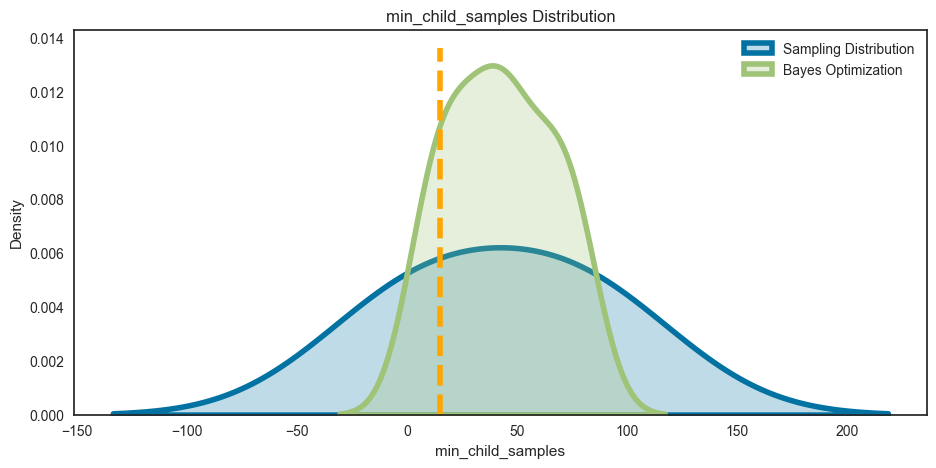

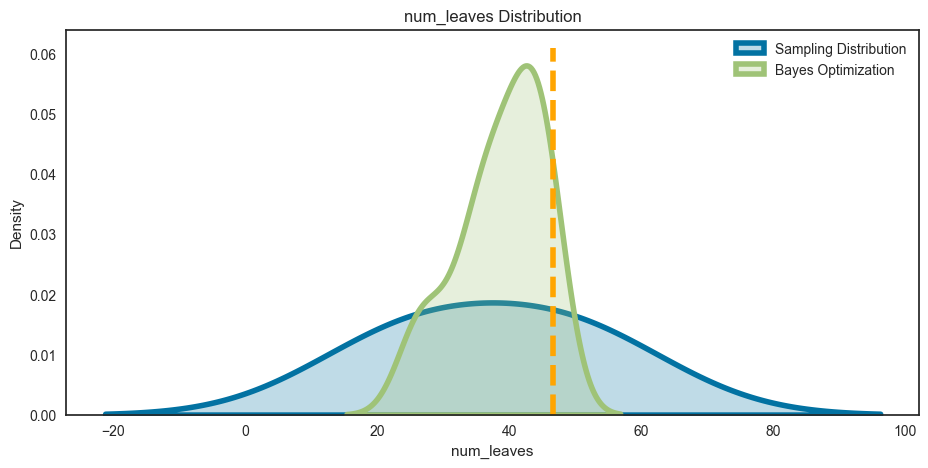

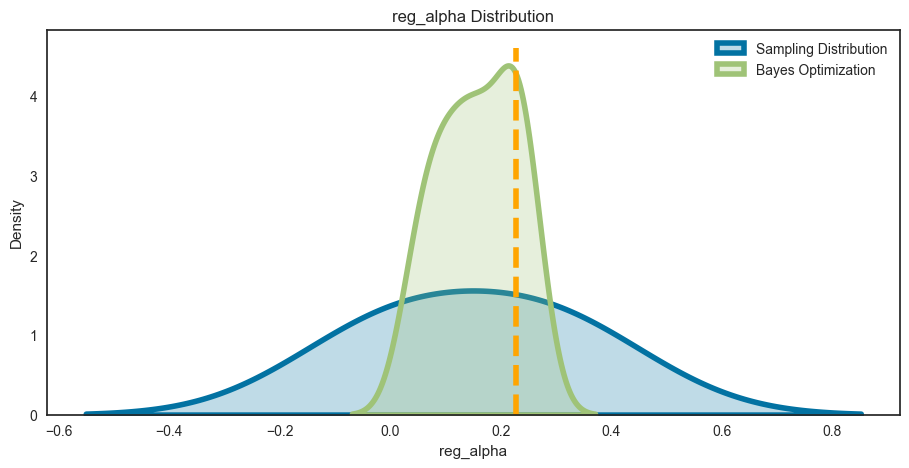

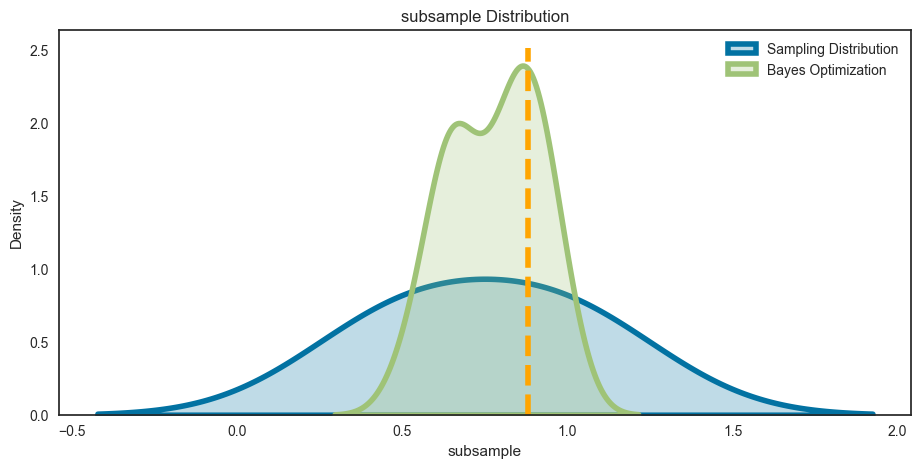

In [213]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [79]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_4 = LGBMClassifier(**param_lgbm_bayesian_opt_4,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_4,0.672105,0.185874,0.291212,0.610665,0.655137,0.778641,0.268063,0.725770,8.799778,9.274766,0.844918,0.000440,0.780837,0.003696,0.778958,0.001135,0.677593,0.009485,0.213579,0.000842,0.186523,0.002135


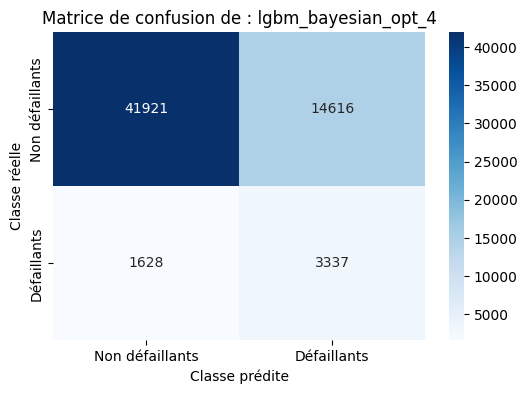

In [80]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_4,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_4')

In [81]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_4',
                                        1628, 14616, 3337, 41921, df_taux)

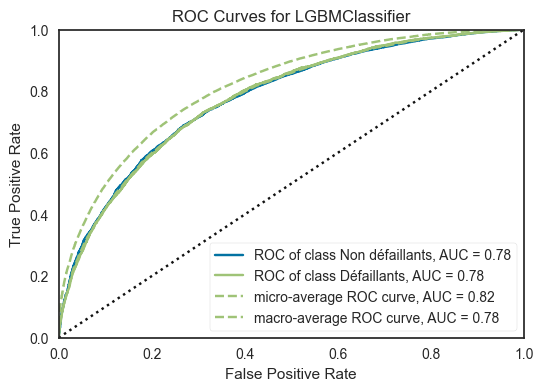

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [217]:
from yellowbrick.classifier import ROCAUC

lgbm_bayesian_opt_4_fit = lgbm_bayesian_opt_4.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_4_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_9**</span>
***
- sans initialiser les paramètres :
    - learning_rate,
    - n_estimators
    - subsample_freq
- en forcant le paramètre suivant avant de lancer la recherche bayésienne :
    - class_weight='balanced'.
- en augmentant le nombre d'itérations de 20 à 100.    

In [218]:
# Définition de l'objective fonction
def lgbm_eval_9(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1
    }
    
    stratified_cv = StratifiedKFold(n_splits=5, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict_proba(x_cv,
                                   num_iteration=lgbm_clf.best_iteration_)[:,1]

    return roc_auc_score(y_train, cv_preds)

In [219]:
# Objective fonction 
lgbm_bayesian_opt_9 = \
    BayesianOptimization(lgbm_eval_9,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                          random_state = 42)

bayesian_opt_9 = lgbm_bayesian_opt_9.maximize(n_iter=100,
                                              init_points=5)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7796    | 0.6873    | 10.75     | 59.9      | 49.9      | 0.0156    | 28.9      | 0.01837   | 0.26      | 0.8006    | 5.248     |
| 2         | 0.7791    | 0.5103    | 10.85     | 67.43     | 20.93     | 0.01818   | 29.59     | 0.09197   | 0.1579    | 0.716     | 2.747     |
| 3         | 0.7785    | 0.8059    | 6.697     | 26.91     | 32.48     | 0.04561   | 44.63     | 0.0607    | 0.1548    | 0.7962    | 1.279     |
| 4         | 0.7792    | 0.8038    | 6.853     | 9.879     | 76.17     | 0.09656   | 45.21     | 0.09208   | 0.0302    | 0.8421    | 3.641     |
| 5         | 0.7796    | 0.561     | 8.476     | 7.579     | 73.2      | 0.02588   | 41.56     | 0.0942    | 0.1565    | 0.

In [220]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_9 = pd.DataFrame.from_records(lgbm_bayesian_opt_9.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_9['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [221]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6,11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

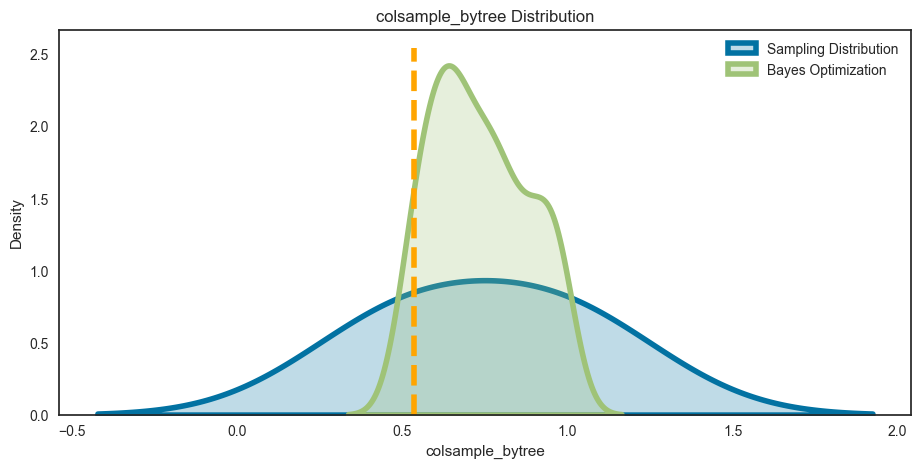

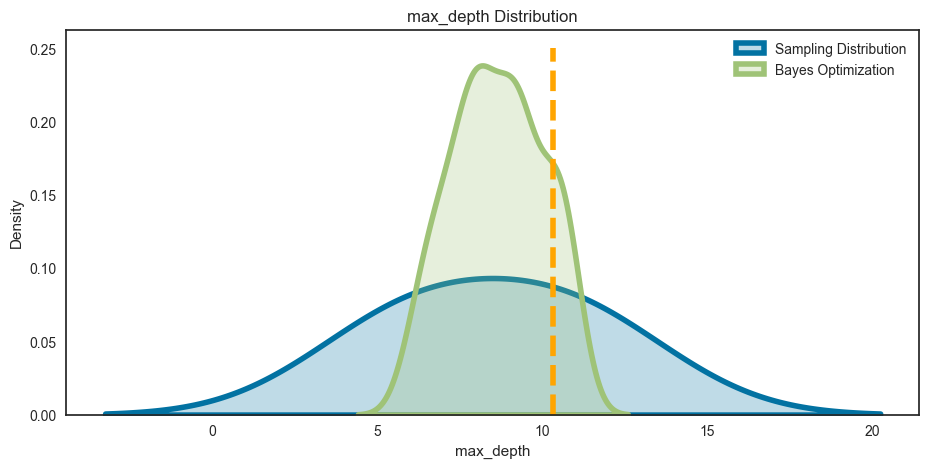

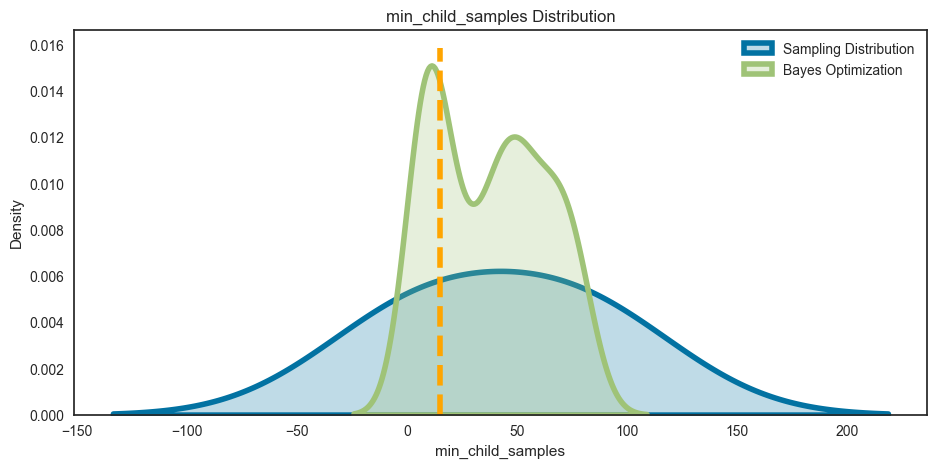

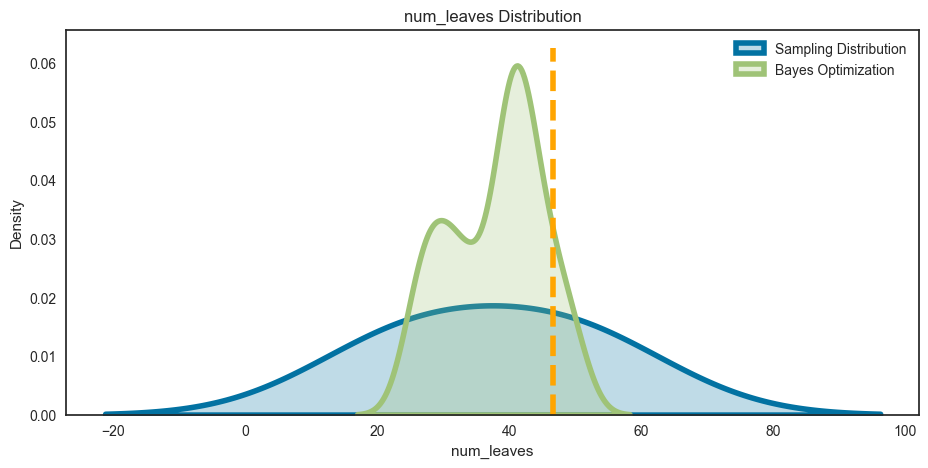

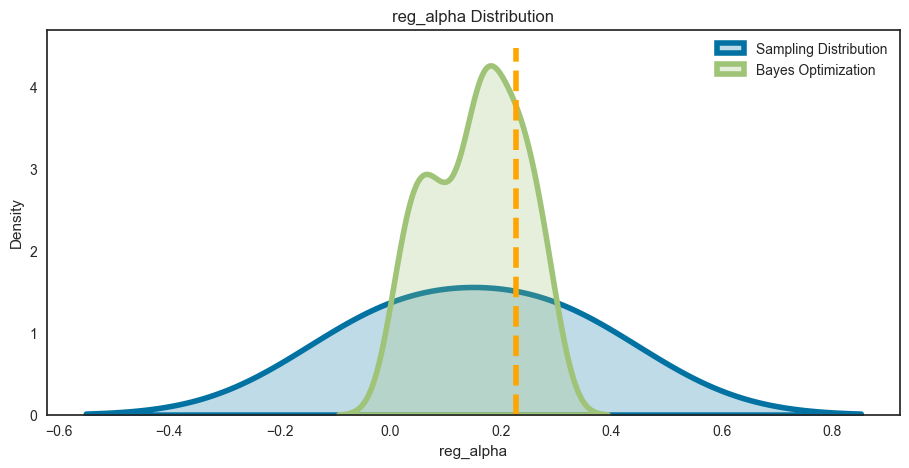

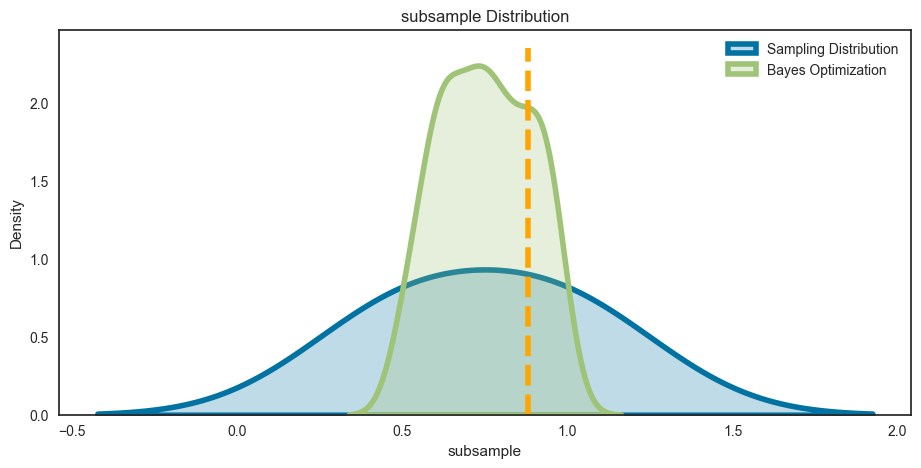

In [222]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [223]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_9.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.6513782874405647, 'max_depth': 9.141372693184541, 'min_child_samples': 5.103862209885605, 'min_child_weight': 65.2689904940595, 'min_split_gain': 0.03691257636230453, 'num_leaves': 41.30571291384036, 'reg_alpha': 0.07310234973002908, 'reg_lambda': 0.2204756058561966, 'subsample': 0.9466689968536812, 'subsample_freq': 3.8880127413442347}


In [86]:
param_lgbm_bayesian_opt_9 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced
                             'colsample_bytree': 0.6513782874405647, 
                             'max_depth': 9, 
                             'min_child_samples': 5, 
                             'min_child_weight': 65.2689904940595, 
                             'min_split_gain': 0.03691257636230453, 
                             'num_leaves': 41, 
                             'reg_alpha': 0.07310234973002908, 
                             'reg_lambda': 0.2204756058561966, 
                             'subsample': 0.9466689968536812, 
                             'subsample_freq': 4,
                             'verbosity' : -1}

In [87]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_9 = LGBMClassifier(**param_lgbm_bayesian_opt_9,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_9,0.679557,0.185487,0.291427,0.616407,0.662096,0.778997,0.270765,0.724721,8.896860,9.183721,0.836726,0.000426,0.780550,0.003803,0.770521,0.001444,0.683132,0.009355,0.208380,0.000549,0.184857,0.002514
lgbm_bayesian_opt_9,0.679557,0.185487,0.291427,0.616407,0.662096,0.778997,0.270765,0.724721,8.638694,8.874303,0.836726,0.000426,0.780550,0.003803,0.770521,0.001444,0.683132,0.009355,0.208380,0.000549,0.184857,0.002514


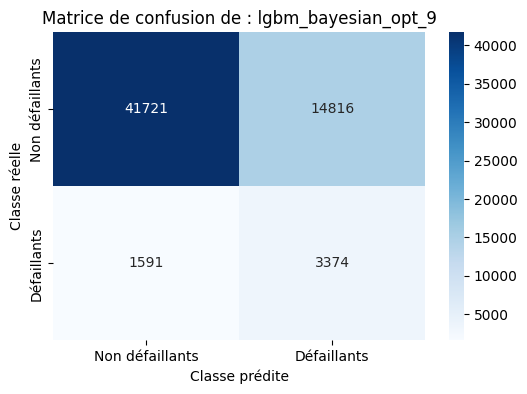

In [88]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_9,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_9')

In [89]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_9',
                                        1591, 14816, 3374, 41721, df_taux)

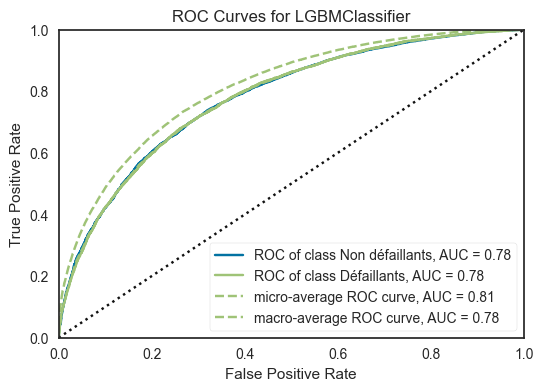

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [228]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_9_fit = lgbm_bayesian_opt_9.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_9_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.2.2. Optimisation LGBM : BayesianOptimization - Score la métrique métier</span>

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_5**</span>
***
- sans forcer les paramètres :
    - learning_rate
    - n_estimators
- en utilisant : class_weight='balanced' pour le déséquilibrage des classes
- en utilisant la métrique métier pour récupérer les meilleurs paramètres lors de la recherche bayésienne.
- avec les poids de pénalisation : taux_tn=1, taux_fp=0, taux_fn=-10, taux_tp=0

[Source](https://medium.com/analytics-vidhya/hyperparameters-optimization-for-lightgbm-catboost-and-xgboost-regressors-using-bayesian-6e7c495947a9)

In [231]:
# Définition de l'objective fonction
def lgbm_eval_5(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced        
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=3, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='custom_score')

        cv_preds[cv_indices] = \
            lgbm_clf.predict(x_cv,
                             num_iteration=lgbm_clf.best_iteration_)
#         display(cv_preds)
    return custom_score(y_train, np.rint(cv_preds))

In [232]:
# Recherche des meilleurs paramètres 
lgbm_bayesian_opt_5 = \
    BayesianOptimization(lgbm_eval_5,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                         random_state=seed)

bayesian_opt_5 = lgbm_bayesian_opt_5.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7191    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    | 4.502     |
| 2         | 0.7302    | 0.5348    | 10.34     | 14.99     | 18.36     | 0.04959   | 46.59     | 0.2279    | 0.2912    | 0.8797    | 3.306     |
| 3         | 0.7282    | 0.7044    | 9.567     | 25.3      | 69.06     | 0.09132   | 44.02     | 0.1555    | 0.05118   | 0.6493    | 2.704     |
| 4         | 0.7273    | 0.6636    | 8.301     | 45.83     | 21.31     | 0.07999   | 43.17     | 0.2549    | 0.08099   | 0.8074    | 4.917     |
| 5         | 0.7292    | 0.7589    | 10.61     | 14.14     | 19.53     | 0.02771   | 46.51     | 0.22      | 0.1816    | 0.

In [233]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_5.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.5, 'max_depth': 11.0, 'min_child_samples': 5.0, 'min_child_weight': 8.628591871069709, 'min_split_gain': 0.1, 'num_leaves': 50.0, 'reg_alpha': 0.001, 'reg_lambda': 0.3, 'subsample': 1.0, 'subsample_freq': 1.0}


In [234]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_5 = pd.DataFrame.from_records(lgbm_bayesian_opt_5.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_5['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [235]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

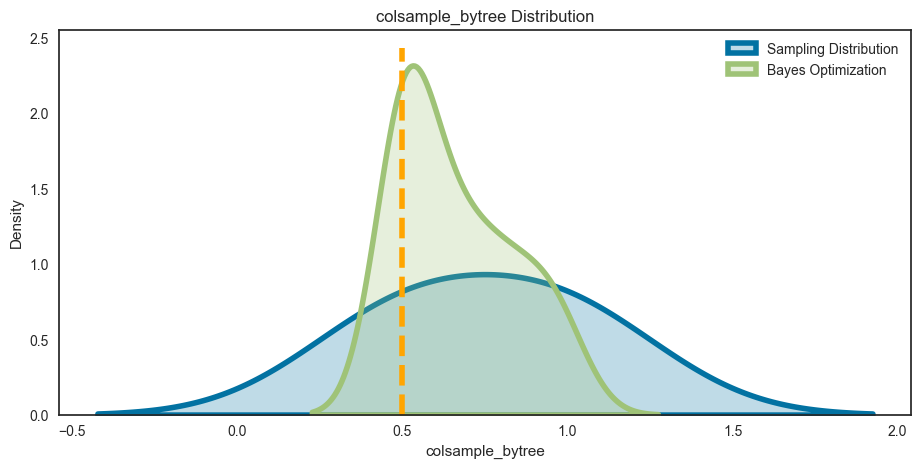

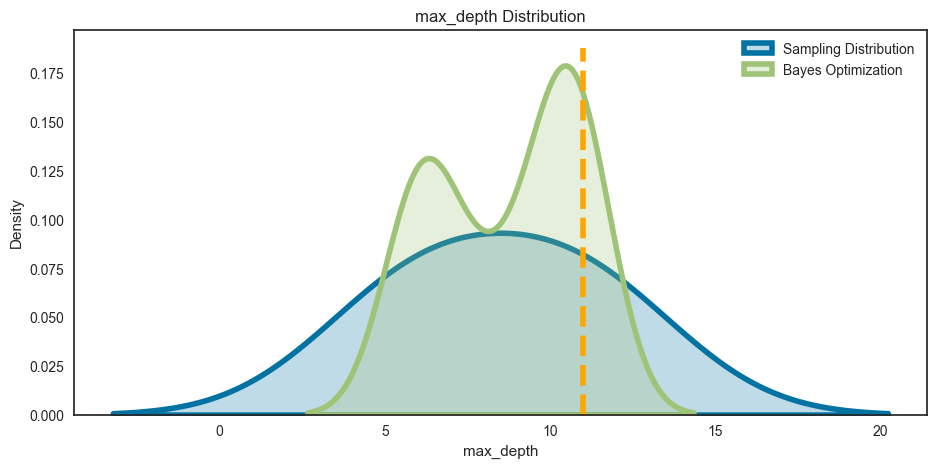

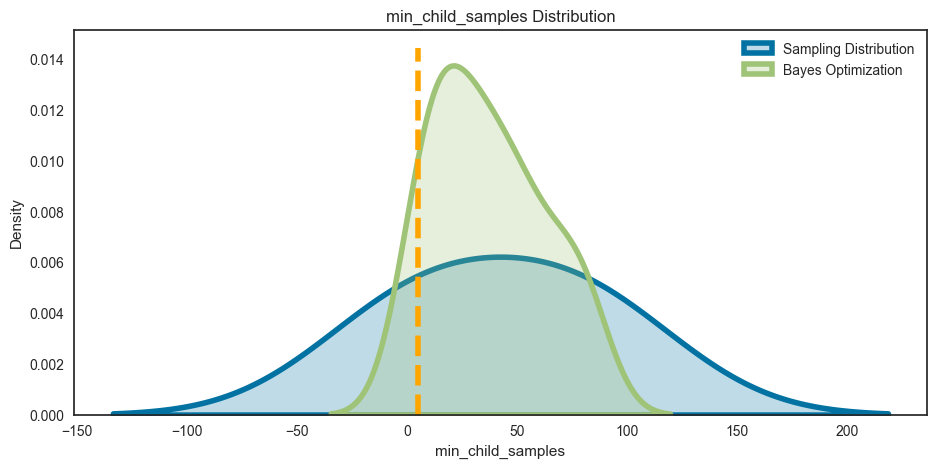

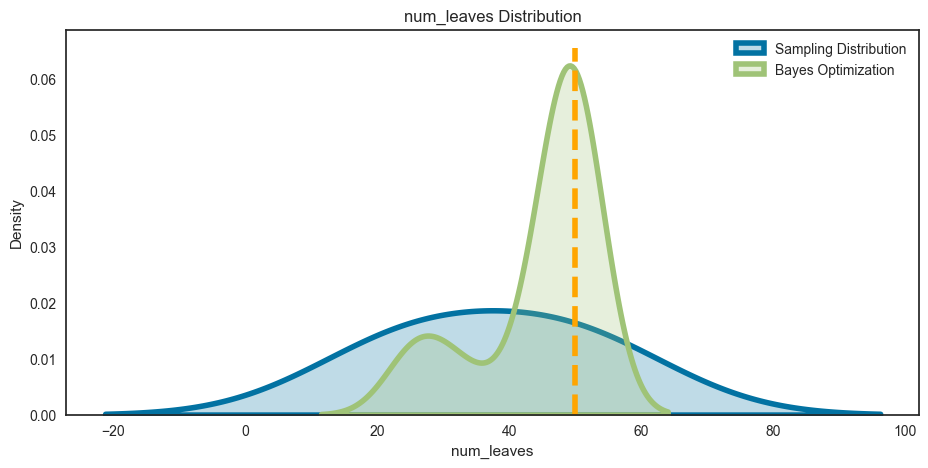

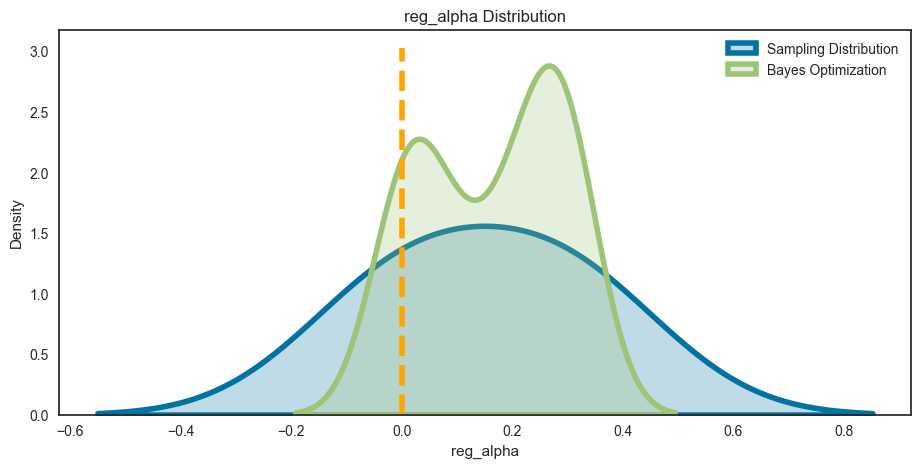

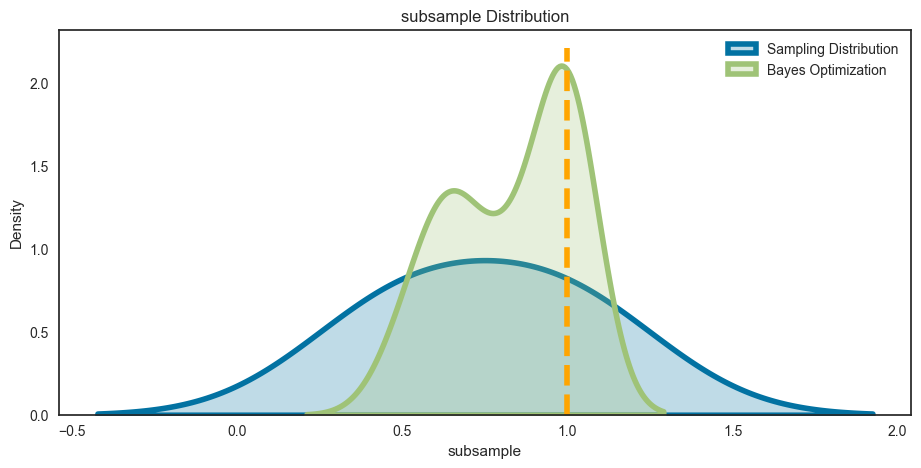

In [236]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [91]:
param_lgbm_bayesian_opt_5 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced
                             'colsample_bytree': 0.5, 
                             'max_depth': 11, 
                             'min_child_samples': 5, 
                             'min_child_weight': 8.628591871069709, 
                             'min_split_gain': 0.1, 
                             'num_leaves': 50, 
                             'reg_alpha': 0.001, 
                             'reg_lambda': 0.3, 
                             'subsample': 1.0, 
                             'subsample_freq': 1,
                             'verbosity' : -1,
                             'seed' : seed}

In [92]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_5 = LGBMClassifier(**param_lgbm_bayesian_opt_5,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_5,0.671098,0.187086,0.292602,0.610364,0.654337,0.780425,0.268906,0.727430,8.793074,9.188432,0.849975,0.000335,0.780710,0.003799,0.784435,0.001718,0.677190,0.008749,0.216752,0.000656,0.188070,0.002811


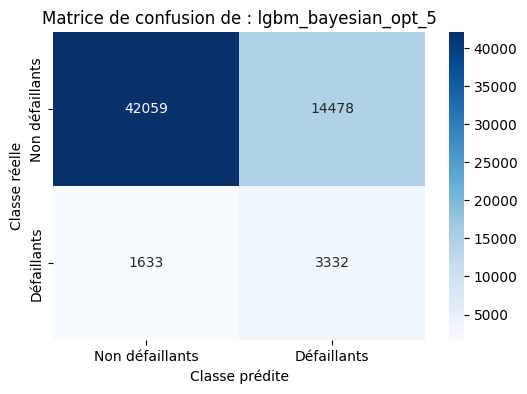

In [93]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_5,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_5')

In [94]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_5',
                                        1633, 14478, 3332, 42059, df_taux)

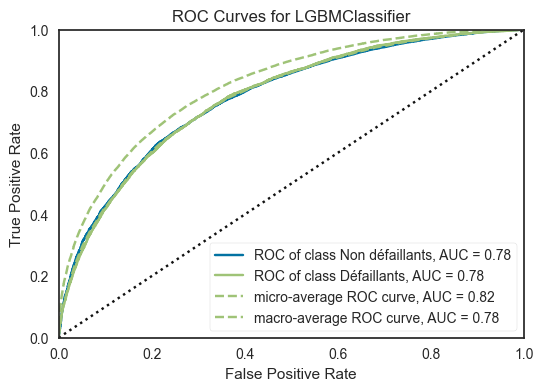

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [245]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_5_fit = lgbm_bayesian_opt_5.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_5_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
<span style='background:mistyrose'>**Modèle lgbm_bayesian_opt_6**</span>
***
- sans forcer les paramètres :
    - learning_rate
    - n_estimators
- en utilisant : class_weight='balanced' pour le déséquilibrage des classes
- en utilisant la métrique métier pour récupérer les meilleurs paramètres lors de la recherche bayésienne.
- avec les poids de pénalisation : taux_tn=1, taux_fp=-1, taux_fn=-10, taux_tp=0

[Source](https://medium.com/analytics-vidhya/hyperparameters-optimization-for-lightgbm-catboost-and-xgboost-regressors-using-bayesian-6e7c495947a9)

In [249]:
# Définition de l'objective fonction
def lgbm_eval_6(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                subsample_freq, colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced        
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : int(round(subsample_freq)),
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=3, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='custom_score_2')

        cv_preds[cv_indices] = \
            lgbm_clf.predict(x_cv,
                             num_iteration=lgbm_clf.best_iteration_)
        
    return custom_score_2(y_train, np.rint(cv_preds))

In [258]:
# Recherche des meilleurs paramètres 
lgbm_bayesian_opt_6 = \
    BayesianOptimization(lgbm_eval_6,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                         random_state=seed)

bayesian_opt_6 = lgbm_bayesian_opt_6.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.7154    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    | 4.502     |
| 2         | 0.7235    | 0.5348    | 10.34     | 14.99     | 18.36     | 0.04959   | 46.59     | 0.2279    | 0.2912    | 0.8797    | 3.306     |
| 3         | 0.7221    | 0.7044    | 9.567     | 25.3      | 69.06     | 0.09132   | 44.02     | 0.1555    | 0.05118   | 0.6493    | 2.704     |
| 4         | 0.7209    | 0.6636    | 8.301     | 45.83     | 21.31     | 0.07999   | 43.17     | 0.2549    | 0.08099   | 0.8074    | 4.917     |
| 5         | 0.7227    | 0.7589    | 10.61     | 14.14     | 19.53     | 0.02771   | 46.51     | 0.22      | 0.1816    | 0.

In [259]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_6.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.6658409552449911, 'max_depth': 10.899240368475681, 'min_child_samples': 42.038216788232084, 'min_child_weight': 76.29412899757872, 'min_split_gain': 0.08815623158959054, 'num_leaves': 49.61530716913669, 'reg_alpha': 0.14240485642928744, 'reg_lambda': 0.16617052091458756, 'subsample': 0.9931702751951674, 'subsample_freq': 6.9527715481290535}


In [260]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_6 = pd.DataFrame.from_records(lgbm_bayesian_opt_6.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_6['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [261]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'subsample_freq' : (1, 7),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

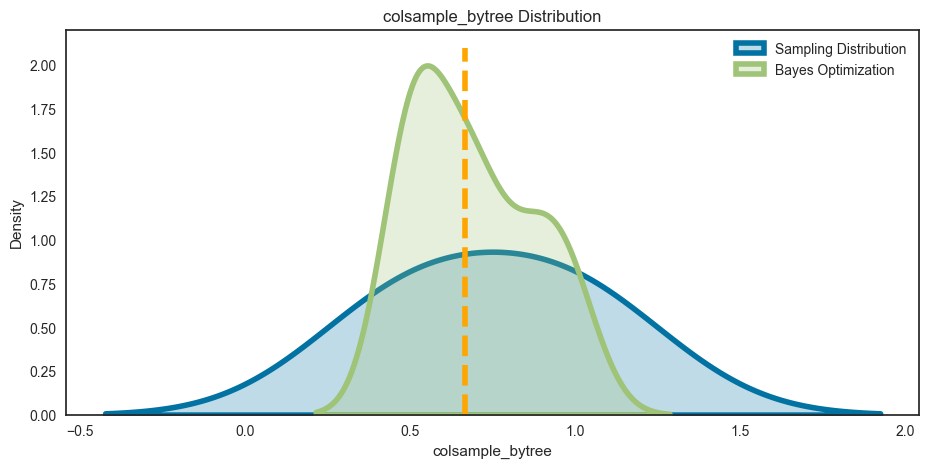

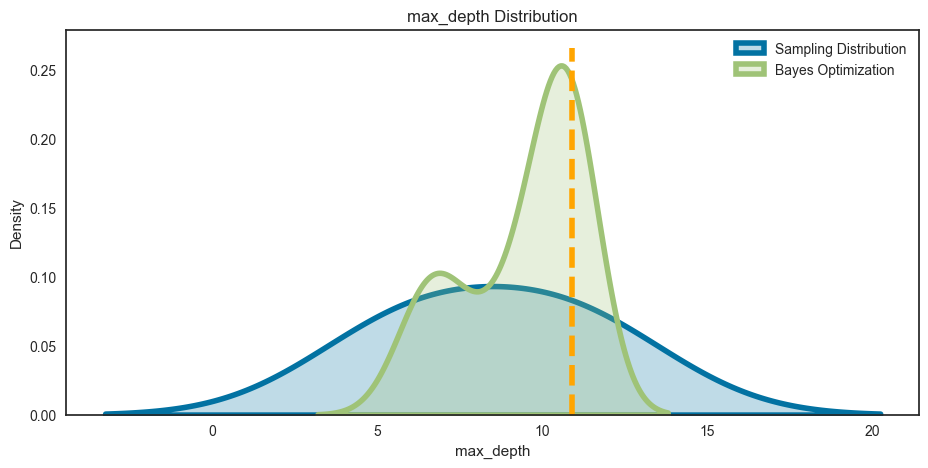

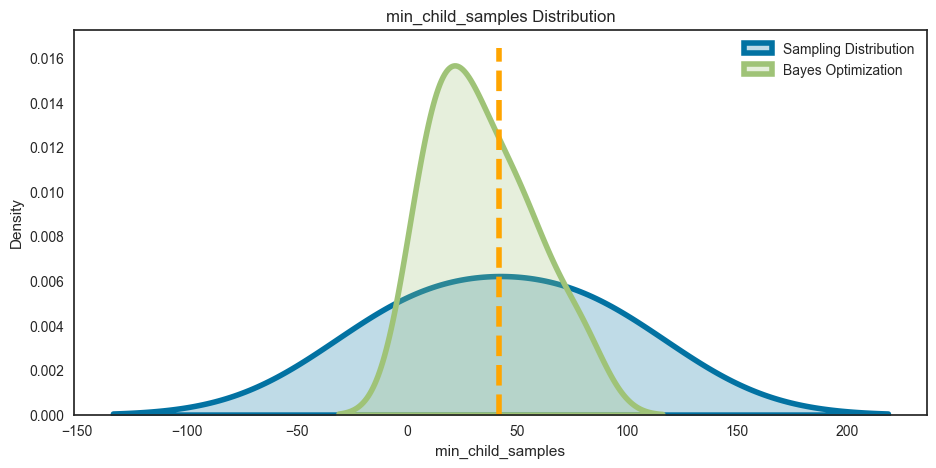

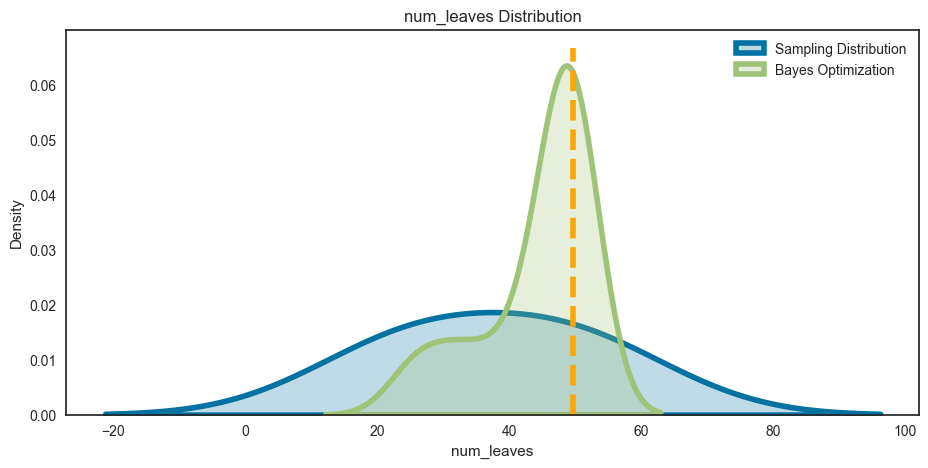

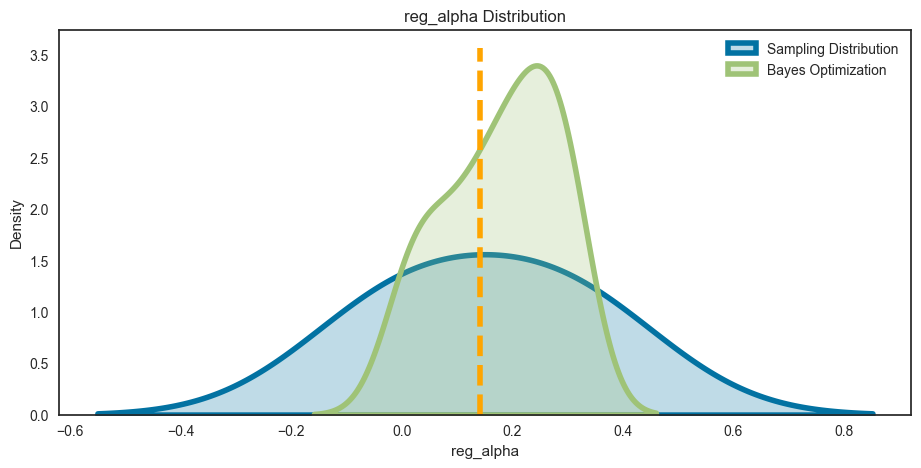

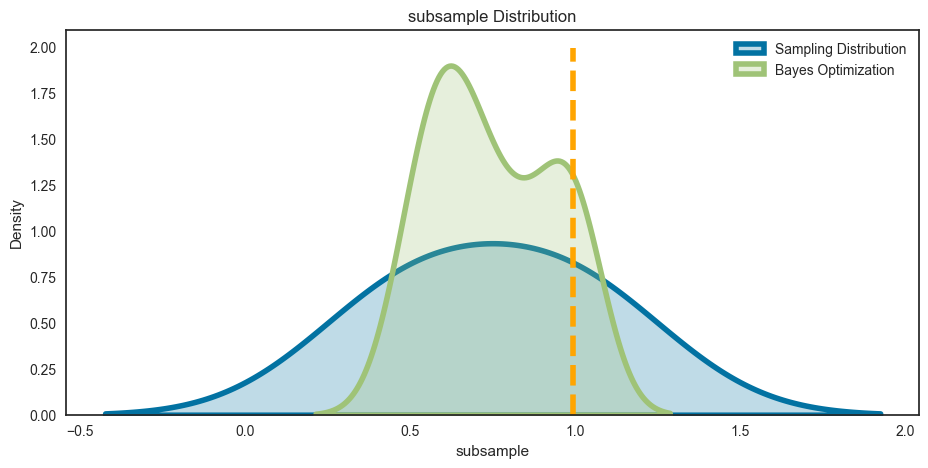

In [262]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [96]:
param_lgbm_bayesian_opt_6 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced  
                             'colsample_bytree': 0.6658409552449911, 
                             'max_depth': 11, 
                             'min_child_samples': 42, 
                             'min_child_weight': 76.29412899757872, 
                             'min_split_gain': 0.08815623158959054, 
                             'num_leaves': 50, 
                             'reg_alpha': 0.14240485642928744, 
                             'reg_lambda': 0.16617052091458756, 
                             'subsample': 0.9931702751951674, 
                             'subsample_freq': 7,                        
                             'verbosity' : -1,
                             'seed' : seed}

In [97]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_6 = LGBMClassifier(**param_lgbm_bayesian_opt_6,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_6,0.672306,0.186397,0.291873,0.611041,0.655390,0.780314,0.269074,0.726445,9.482352,9.747627,0.847846,0.000181,0.781113,0.004062,0.782220,0.001481,0.675176,0.009991,0.215910,0.000546,0.186600,0.002361


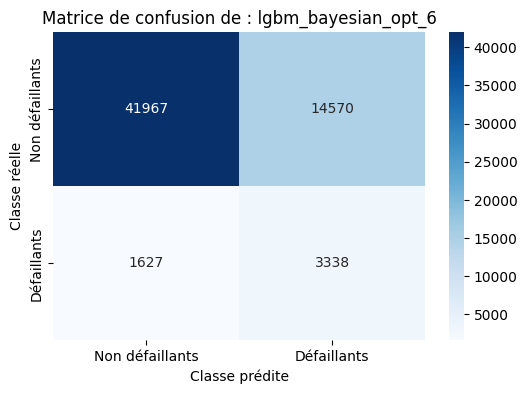

In [98]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_6,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_6')

In [99]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_6',
                                        1627, 14570, 3338, 41967, df_taux)

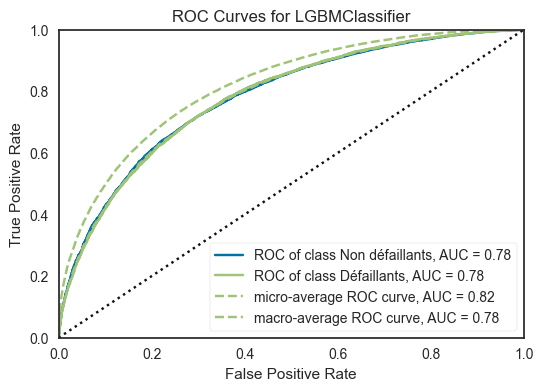

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [256]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_6_fit = lgbm_bayesian_opt_6.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_6_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.2.2. Optimisation LGBM : BayesianOptimization - Score PR_AUC</span>

***
<span style='background:mistyrose'>**Modèle 7lgbm_bayesian_opt_7**</span>
***
- sans forcer les paramètres :
    - learning_rate
    - n_estimators
- en utilisant : class_weight='balanced' pour le déséquilibrage des classes
- avec la métrique PR_AUC comme métrique d'évaluation lors de la recherche bayésienne.

In [263]:
# Définition de l'objective fonction
def lgbm_eval_7(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced        
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : 1,
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=5, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='pr_auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict_proba(x_cv,
                                   num_iteration=lgbm_clf.best_iteration_)[:,1]

    return average_precision_score(y_train, cv_preds)

In [264]:
# Recherche des meilleurs paramètres 
lgbm_bayesian_opt_7 = \
    BayesianOptimization(lgbm_eval_7,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                         random_state=seed)

bayesian_opt_7 = lgbm_bayesian_opt_7.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.2632    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    |
| 2         | 0.2642    | 0.7918    | 6.348     | 70.06     | 14.99     | 0.01781   | 37.4      | 0.2592    | 0.2279    | 0.9852    |
| 3         | 0.2647    | 0.8797    | 7.921     | 35.65     | 58.5      | 0.02707   | 46.35     | 0.274     | 0.2285    | 0.7583    |
| 4         | 0.2643    | 0.5839    | 7.493     | 26.3      | 29.54     | 0.04601   | 38.61     | 0.066     | 0.2402    | 0.8633    |
| 5         | 0.2651    | 0.6062    | 7.244     | 31.84     | 38.34     | 0.08193   | 35.66     | 0.09261   | 0.1534    | 0.8499    |
| 6         | 0.2647    | 0.6227    | 8.424     | 19.81     | 

In [265]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_7.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.5758803179549261, 'max_depth': 9.312608872642194, 'min_child_samples': 47.64556389081002, 'min_child_weight': 16.41659788012688, 'min_split_gain': 0.07210580045795105, 'num_leaves': 49.40433266864818, 'reg_alpha': 0.22654087809017773, 'reg_lambda': 0.2356252144823949, 'subsample': 0.965619834468096}


In [266]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_7 = pd.DataFrame.from_records(lgbm_bayesian_opt_7.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_7['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [267]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

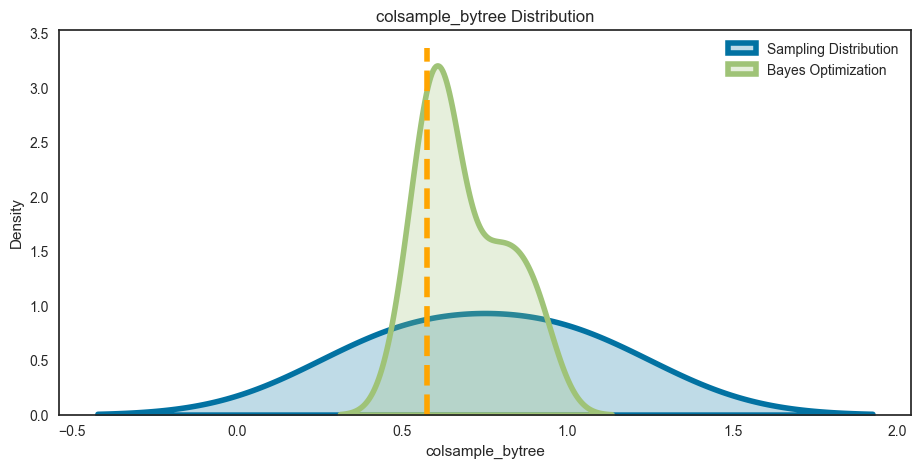

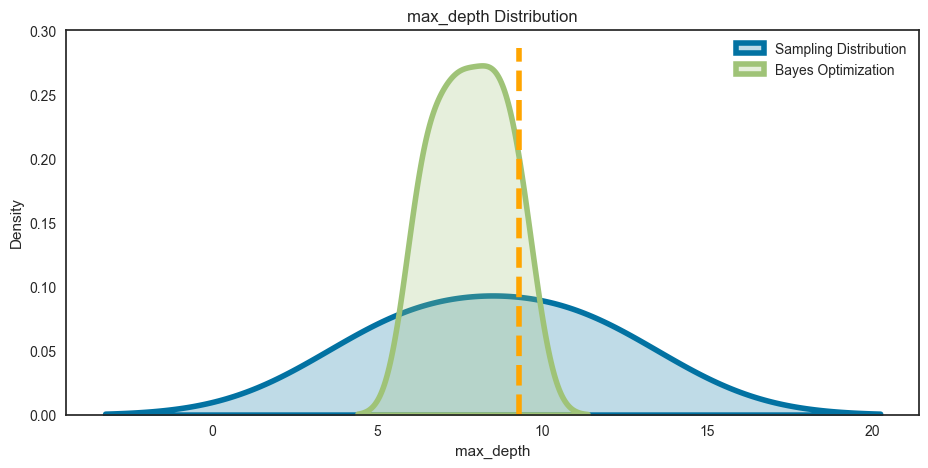

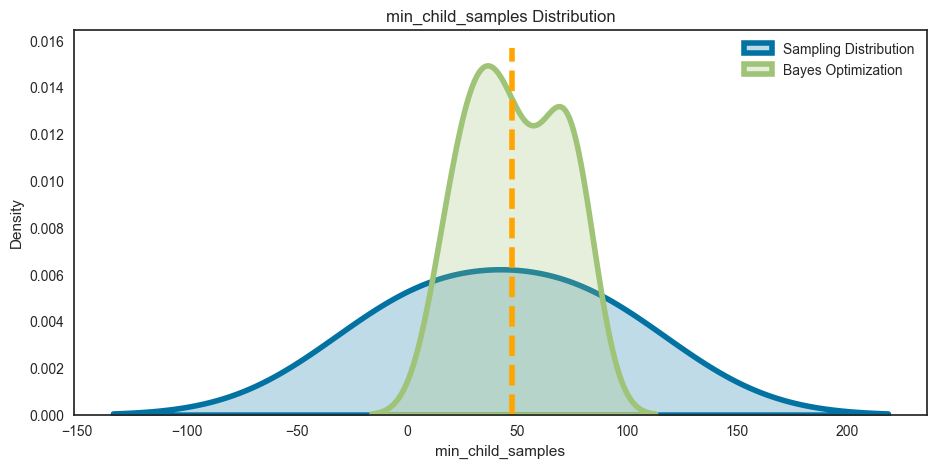

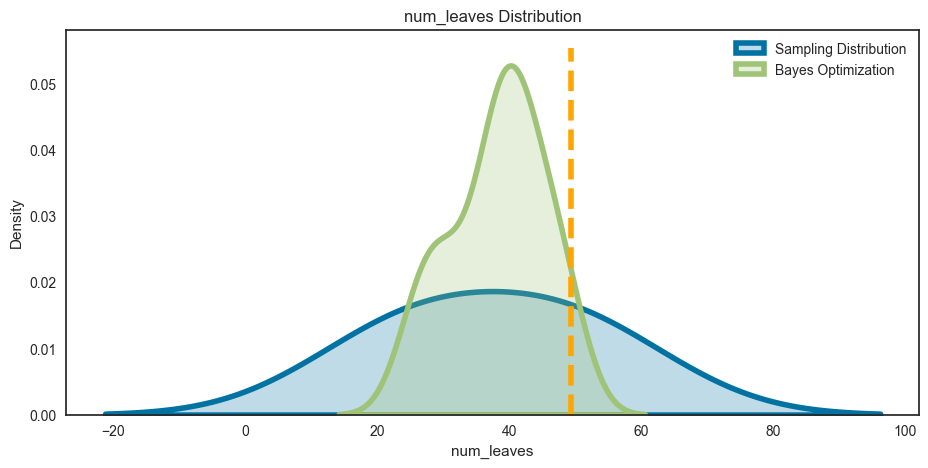

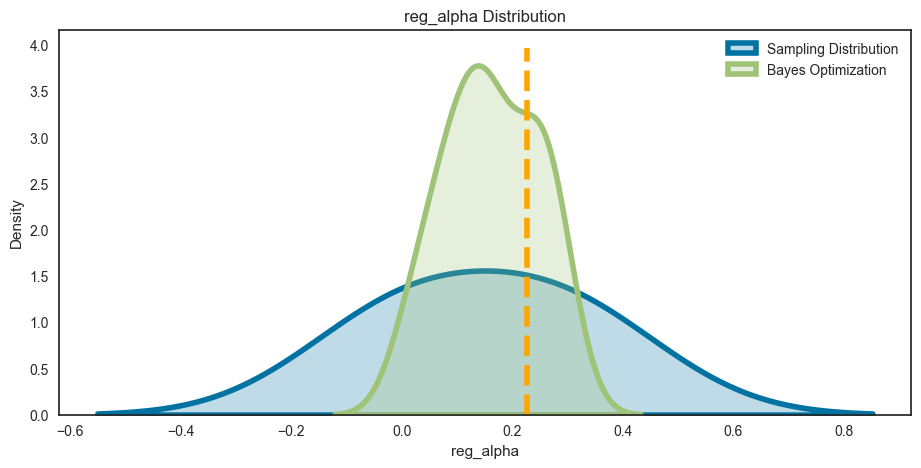

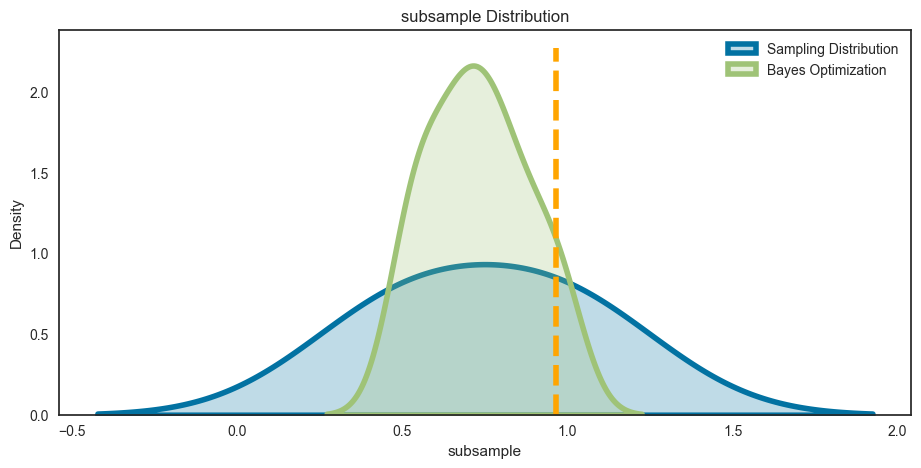

In [268]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [101]:
param_lgbm_bayesian_opt_7 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced 
                             'colsample_bytree': 0.5758803179549261, 
                             'max_depth': 9, 
                             'min_child_samples': 48, 
                             'min_child_weight': 16.41659788012688, 
                             'min_split_gain': 0.07210580045795105, 
                             'num_leaves': 49, 
                             'reg_alpha': 0.22654087809017773, 
                             'reg_lambda': 0.2356252144823949, 
                             'subsample': 0.965619834468096,
                             'subsample_freq' : 1,
                             'verbosity' : -1,
                             'seed' : seed}

In [102]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_7 = LGBMClassifier(**param_lgbm_bayesian_opt_7,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_7,0.669889,0.187254,0.292692,0.609471,0.653220,0.779249,0.268658,0.727731,8.854919,9.117905,0.847818,0.000281,0.780846,0.003764,0.780637,0.001517,0.675730,0.009538,0.215999,0.000327,0.187686,0.002513


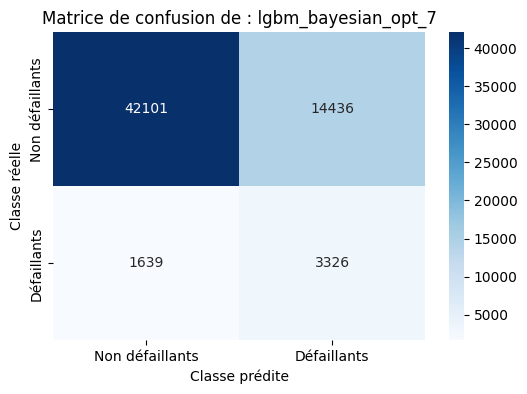

In [103]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_7,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_7')

In [104]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_7',
                                        1639, 14436, 3326, 42101, df_taux)

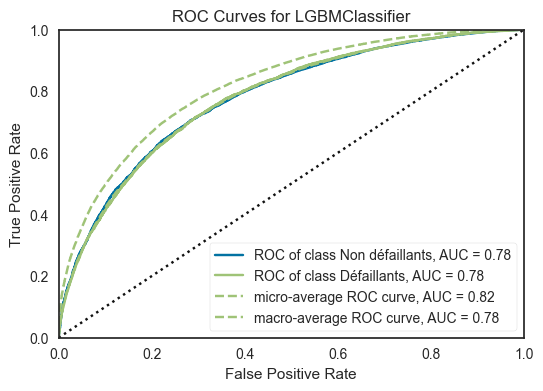

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [273]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_7_fit = lgbm_bayesian_opt_7.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_7_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.2.3. Optimisation LGBM : BayesianOptimization - Score F10</span>

***
<span style='background:mistyrose'>**Modèle 7 lgbm_bayesian_opt_8**</span>
***
- sans forcer les paramètres :
    - learning_rate
    - n_estimators
- en utilisant : class_weight='balanced' pour le déséquilibrage des classes
- avec la métrique F-mesure beta = 10 qui pénalise plus les faux négaifs que les faux positifs comme métrique d'évaluation lors de la recherche bayésienne.

In [290]:
# Définition de l'objective fonction
def lgbm_eval_8(num_leaves, max_depth, min_split_gain,
                min_child_weight, min_child_samples, subsample,
                colsample_bytree, reg_alpha, reg_lambda):
    '''
    Objective function for Bayesian Optimization of LightGBM's
    Hyperparamters. Takes the hyperparameters as input, and
    returns the Cross-Validation AUC as output.

    Inputs: Hyperparamters to be tuned.
        boost, num_leaves, max_depth, min_split_gain, min_child_weight,
        min_child_samples, subsample, colsample_bytree, reg_alpha,
        reg_lambda

    Returns:
        CV ROC-AUC Score
    '''

    params = {
        'objective' : 'binary',
        'boosting_type' : 'gbdt',
        'n_jobs' : -1,
        'class_weight' : 'balanced', # Balanced        
        'num_leaves' : int(round(num_leaves)),
        'max_depth' : int(round(max_depth)),
        'min_split_gain' : min_split_gain,
        'min_child_weight' : min_child_weight,
        'min_child_samples' : int(round(min_child_samples)),
        'subsample': subsample,
        'subsample_freq' : 1,
        'colsample_bytree' : colsample_bytree,
        'reg_alpha' : reg_alpha,
        'reg_lambda' : reg_lambda,
        'verbosity' : -1,
        'seed' : seed
    }
    
    stratified_cv = StratifiedKFold(n_splits=5, shuffle=True,
                                    random_state=seed)
    
    cv_preds = np.zeros(X_train.shape[0])
    for train_indices, cv_indices in stratified_cv.split(X_train,
                                                         y_train):

        x_tr = X_train.iloc[train_indices]
        y_tr = y_train.iloc[train_indices]
        x_cv = X_train.iloc[cv_indices]
        y_cv = y_train.iloc[cv_indices]

        lgbm_clf = lgb.LGBMClassifier(**params)
        lgbm_clf.fit(x_tr, y_tr, eval_set= [(x_cv, y_cv)],
                     eval_metric='pr_auc')

        cv_preds[cv_indices] = \
            lgbm_clf.predict(x_cv, num_iteration=lgbm_clf.best_iteration_)

    return fbeta_score(y_train, cv_preds, beta = 10)# Définition de l'objective fonction

In [291]:
# Recherche des meilleurs paramètres 
lgbm_bayesian_opt_8 = \
    BayesianOptimization(lgbm_eval_8,
                         {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)},
                         random_state=seed)

bayesian_opt_8 = lgbm_bayesian_opt_8.maximize(n_iter=20,
                                              init_points=4)

|   iter    |  target   | colsam... | max_depth | min_ch... | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.6711    | 0.5244    | 7.446     | 59.07     | 6.621     | 0.02059   | 26.27     | 0.09138   | 0.1995    | 0.6541    |
| 2         | 0.6586    | 0.7918    | 6.348     | 70.06     | 14.99     | 0.01781   | 37.4      | 0.2592    | 0.2279    | 0.9852    |
| 3         | 0.6583    | 0.8797    | 7.921     | 35.65     | 58.5      | 0.02707   | 46.35     | 0.274     | 0.2285    | 0.7583    |
| 4         | 0.6616    | 0.5839    | 7.493     | 26.3      | 29.54     | 0.04601   | 38.61     | 0.066     | 0.2402    | 0.8633    |
| 5         | 0.662     | 0.6062    | 7.244     | 31.84     | 38.34     | 0.08193   | 35.66     | 0.09261   | 0.1534    | 0.8499    |
| 6         | 0.67      | 0.5562    | 7.441     | 58.1      | 

In [292]:
# Liste des résultats de l'optimisation: convertir la liste de dictionnaires en DataFrame
df_lgbm_bayesian_opt_8 = pd.DataFrame.from_records(lgbm_bayesian_opt_8.res)

# Séparer les hyperparamètres dans des colonnes distinctes
bayes_params = pd.json_normalize(df_lgbm_bayesian_opt_8['params'])

# Ajouter la colonne 'target' au DataFrame des paramètres
bayes_params['target'] = df['target']

# Liste de dictionnaires (meilleurs hyperparamètres)
results = [best_params]

# Convertir la liste de dictionnaires en DataFrame
best_bayes_params = pd.DataFrame(results)

In [293]:
space = {'num_leaves' : (25, 50),
                          'max_depth' : (6, 11),
                          'min_split_gain' : (0, 0.1),
                          'min_child_weight' : (5, 80),
                          'min_child_samples' : (5, 80),
                          'subsample' : (0.5, 1),
                          'colsample_bytree' : (0.5, 1),
                          'reg_alpha' : (0.001, 0.3),
                          'reg_lambda' : (0.001, 0.3)}

**Distibution des hyperparamètres numériques**

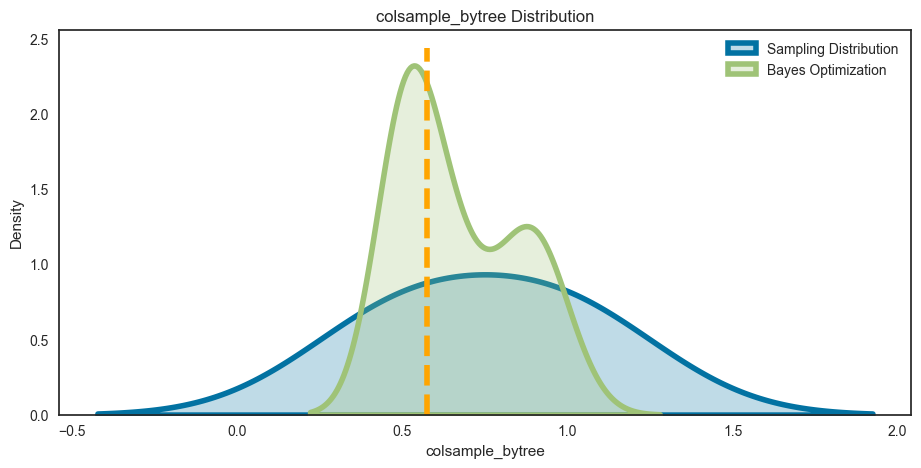

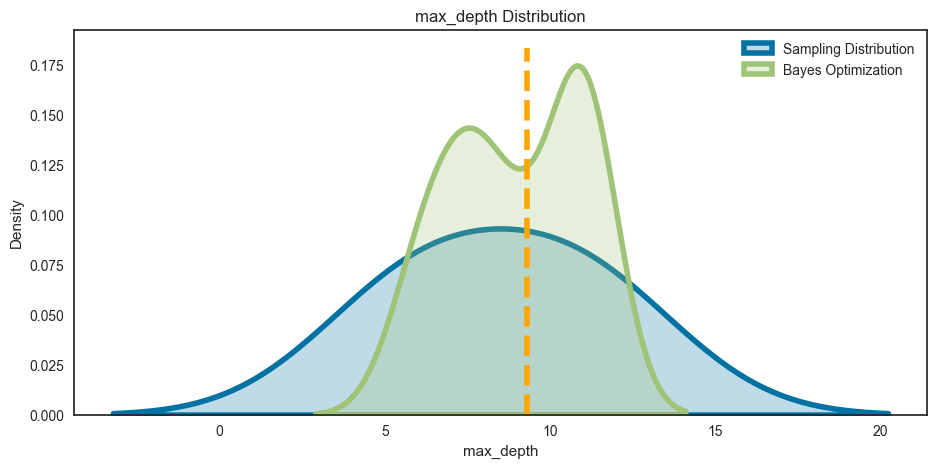

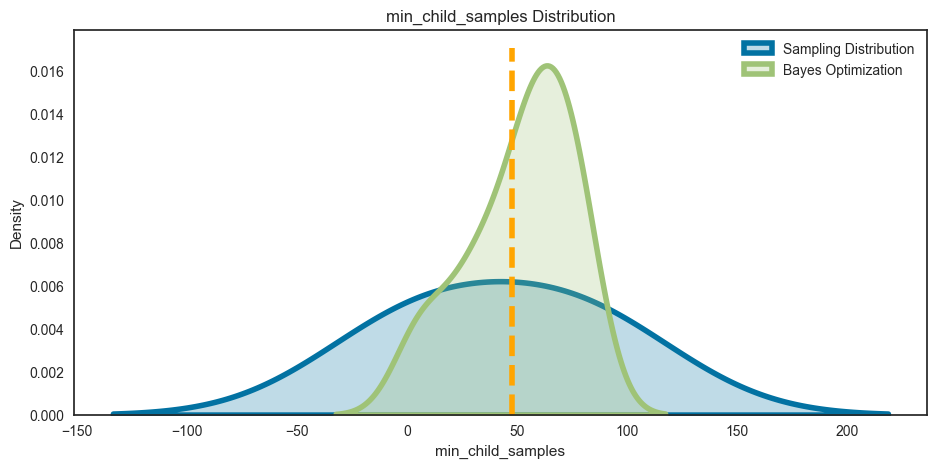

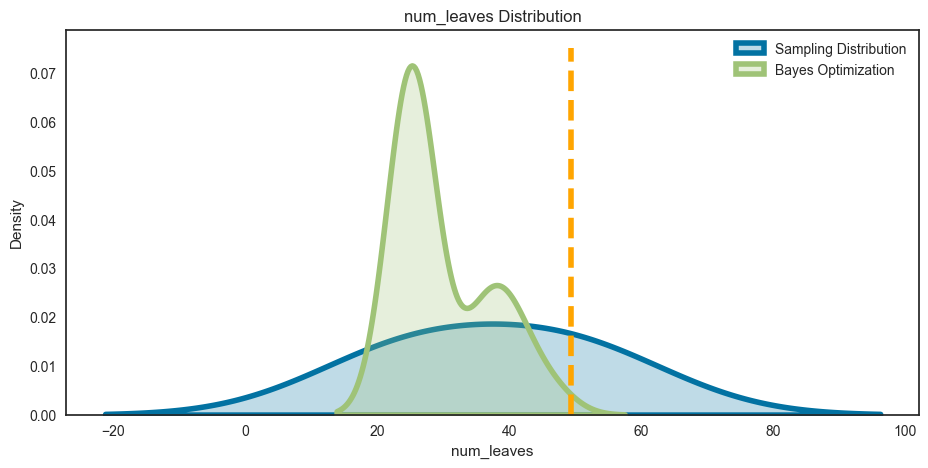

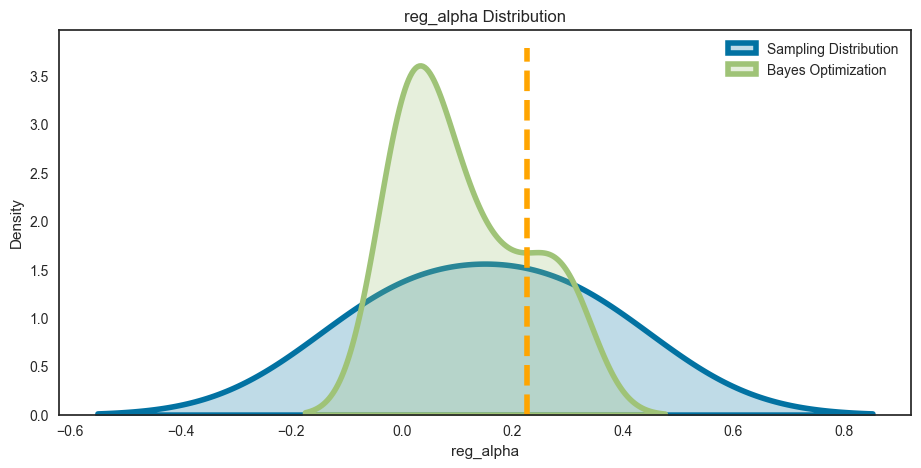

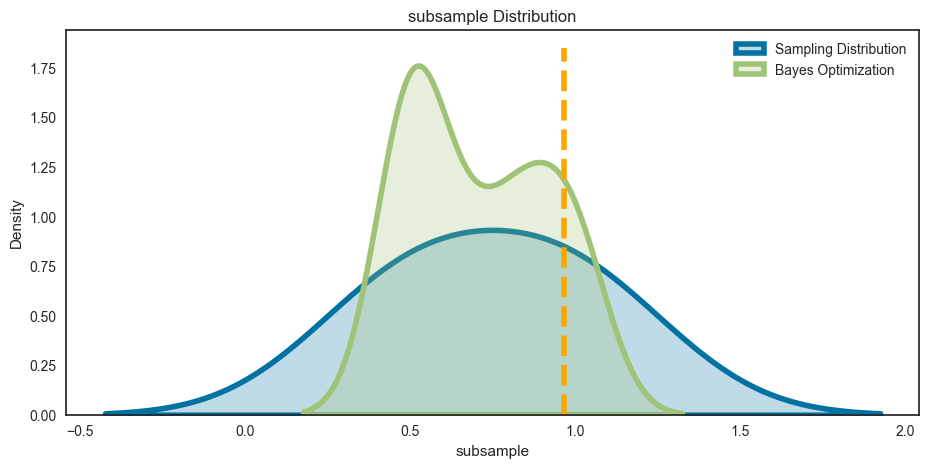

In [294]:
# Itérations pour chaque hyperparamètre
for i, hyper in enumerate(bayes_params.columns):
    if hyper in ['num_leaves', 'max_depth', 
          'min_child_samples', 'subsample', 
          'colsample_bytree', 'reg_alpha']:
        
        plt.figure(figsize = (11, 5))
        
        # Dsitribution aléatoire and distribution de la recherche bayesienne
        sns.kdeplot([sample(space[hyper])], label = 'Sampling Distribution', linewidth = 4, shade = True)
        sns.kdeplot(bayes_params[hyper], label = 'Bayes Optimization', linewidth = 4, shade = True)

        # Obtenir la hauteur courante d'axe y-axis 
        ymin, ymax = plt.ylim()
        plt.vlines([best_bayes_params[hyper]],
                     ymin = ymin, ymax = ymax, linestyles = '--', linewidth = 4, colors = ['orange'])
        plt.legend(loc = 1)
        plt.title('{} Distribution'.format(hyper))
        plt.xlabel('{}'.format(hyper)); plt.ylabel('Density');
        plt.show(); 

In [295]:
#extracting the best parameters
target_values = []
for result in lgbm_bayesian_opt_8.res:
    target_values.append(result['target'])
    if result['target'] == max(target_values):
        best_params = result['params']

print('Best Hyperparamètres :\n')
print(best_params)

Best Hyperparamètres :

{'colsample_bytree': 0.5, 'max_depth': 11.0, 'min_child_samples': 47.32547515947003, 'min_child_weight': 68.06253662510842, 'min_split_gain': 0.1, 'num_leaves': 25.0, 'reg_alpha': 0.01780789915683942, 'reg_lambda': 0.001, 'subsample': 0.5}


In [105]:
param_lgbm_bayesian_opt_8 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced
                             'colsample_bytree': 0.5, 
                             'max_depth': 11, 
                             'min_child_samples': 47, 
                             'min_child_weight': 68.06253662510842, 
                             'min_split_gain': 0.1, 
                             'num_leaves': 25, 
                             'reg_alpha': 0.01780789915683942, 
                             'reg_lambda': 0.001, 
                             'subsample': 0.5,
                             'verbosity' : -1}

In [106]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_bayesian_opt_8 = LGBMClassifier(**param_lgbm_bayesian_opt_8,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_bayesian_opt_8,0.684391,0.180581,0.285762,0.618069,0.665994,0.777609,0.268485,0.717565,7.419198,7.670209,0.815593,0.000431,0.780535,0.004578,0.748087,0.001577,0.695619,0.008737,0.194944,0.000575,0.181594,0.002162


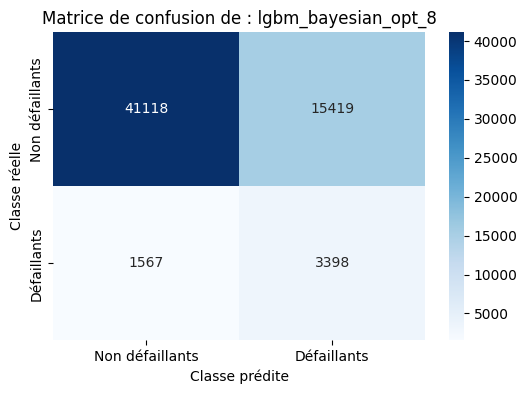

In [107]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_bayesian_opt_8,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_bayesian_opt_8')

In [108]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_bayesian_opt_8',
                                        1567, 15419, 3398, 41118, df_taux)

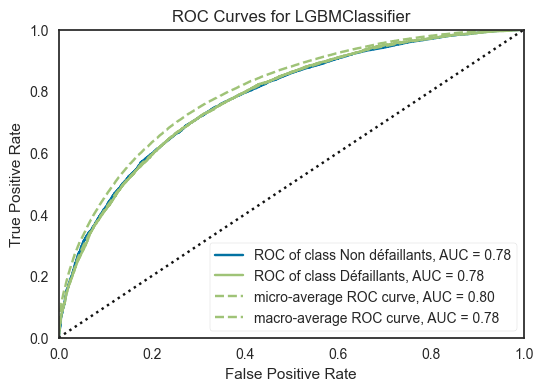

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [305]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_bayesian_opt_8_fit = lgbm_bayesian_opt_8.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_bayesian_opt_8_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

***
**Bilan** :
- L'optimisation avec la librairie bayes_opt égale celui du modèle LightGBM avec ces hyperparamètres de base avec le paramètre class_weight='balanced'.
- Soit la librairie n'est pas performante ou mal réglée par nos soins, soit les hyperparamètres de base sont très bien réglés.
- Nous tenterons d'utiliser la librairie d'optimisation bayésienne de scikit-learn : BayesSearchCV.

In [109]:
df_taux.sort_values(by='FN')

,Modèle,FN,FP,TP,TN
3,lgbm_hyperparam_base_std_bal,1552,15242,3413,41295
7,lgbm_bayesian_opt_1_bal,1562,15186,3403,41351
15,lgbm_bayesian_opt_8,1567,15419,3398,41118
1,lgbm_hyperparam_base_bal,1571,15178,3394,41359
11,lgbm_bayesian_opt_9,1591,14816,3374,41721
13,lgbm_bayesian_opt_6,1627,14570,3338,41967
10,lgbm_bayesian_opt_4,1628,14616,3337,41921
12,lgbm_bayesian_opt_5,1633,14478,3332,42059
14,lgbm_bayesian_opt_7,1639,14436,3326,42101
9,lgbm_bayesian_opt_3,1841,12294,3124,44243


### <span style='background:orange'>5.3. Optimisation LGBM : meilleurs hyperparamètres BayesianOptimization</span>

#### <span style='background:Moccasin'>4.3.1. Optimisation LGBM : BayesSearchCV - ROC_AUC</span>

In [111]:
# Modèle lgbm
lgbm_baysearch_opt_1 = LGBMClassifier(objective='binary', force_col_wise = 'true')

In [309]:
# Hyperparamètres à optimiser
params_search_spaces = {'num_leaves': Integer(25, 50),
                        'max_depth': Integer(6, 11),
                        'min_split_gain' : Real(0, 0.1),
                        'min_child_weight' : Integer(5,80),
                        'min_child_samples' : Integer(5,80),
                        'colsample_bytree' : Real(0.5,1),
                        'reg_alpha' : Real(0.001, 0.3),
                        'reg_lambda' : Real(0.001, 0.3),
                        'subsample': Real(0.5, 1.0)}

In [310]:
# Initialisation de BayesSearchCV
baysearch_opt_1 = BayesSearchCV(lgbm_baysearch_opt_1,
                                params_search_spaces,
                                scoring=roc_auc,
                                cv=skf,
                                n_iter=100,
                                n_jobs=-1,  
                                return_train_score=False,
                                refit=True,
                                optimizer_kwargs={'base_estimator': 'GP'},
                                random_state=seed)

In [311]:
df_lgbm_baysearch_opt_1 = fonctions_data.lancer_optimise_baysearch(baysearch_opt_1, X_train, y_train)

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.570161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35997
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 216
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best CV score : 0.7815286300573091 +/- 0.00176426155106933
Best Hyperparamètres :

OrderedDict([('colsample_bytree', 0.86672

In [112]:
param_lgbm_baysearch_opt_1 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced        
                             'colsample_bytree': 0.8667297639332102,
                             'max_depth': 11,
                             'min_child_samples': 63,
                             'min_child_weight': 64,
                             'min_split_gain': 0.1,
                             'num_leaves': 50,
                             'reg_alpha': 0.04331378216805114,
                             'reg_lambda':  0.2888352360259593,
                             'subsample': 0.8461290442947608,
                             'verbosity' : -1}

In [113]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_baysearch_opt_1 = LGBMClassifier(**param_lgbm_baysearch_opt_1,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_baysearch_opt_1,0.672306,0.186626,0.292154,0.611136,0.655418,0.779825,0.267636,0.726746,10.175538,10.427257,0.850171,0.000378,0.781192,0.004565,0.785129,0.001329,0.677946,0.010701,0.217092,0.000605,0.187738,0.002432


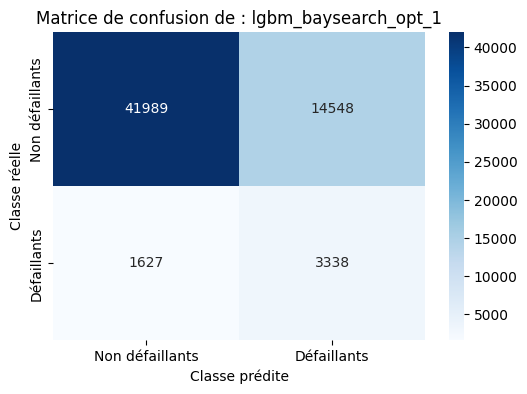

In [114]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_baysearch_opt_1,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_baysearch_opt_1')

In [115]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_baysearch_opt_1',
                                        1627, 14548, 3338, 41989, df_taux)

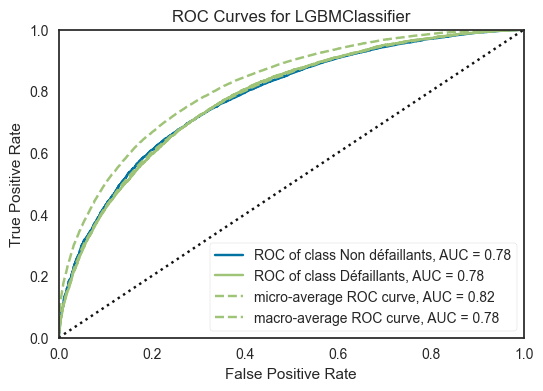

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [320]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_baysearch_opt_1_fit = lgbm_baysearch_opt_1.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_baysearch_opt_1_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>4.3.2. Optimisation LGBM : BayesSearchCV - Métrique métier</span>

In [30]:
# Modèle lgbm
lgbm_baysearch_opt_2 = LGBMClassifier(objective='binary')

In [31]:
# Hyperparamètres à optimiser
params_search_spaces_2 = {'num_leaves': Integer(25, 50),
                          'max_depth': Integer(6, 11),
                          'min_split_gain' : Real(0, 0.1),
                          'min_child_weight' : Integer(5,80),
                          'min_child_samples' : Integer(5,80),
                          'colsample_bytree' : Real(0.5,1),
                          'reg_alpha' : Real(0.001, 0.3),
                          'reg_lambda' : Real(0.001, 0.3),
                          'subsample': Real(0.5, 1.0)}

In [32]:
# Initialisation de BayesSearchCV
baysearch_opt_2 = BayesSearchCV(lgbm_baysearch_opt_2,
                                params_search_spaces_2,
                                scoring=custom_score,
                                cv=skf,
                                n_iter=100,
                                n_jobs=-1,  
                                return_train_score=False,
                                refit=True,
                                optimizer_kwargs={'base_estimator': 'GP'},
                                random_state=seed)

In [33]:
df_lgbm_baysearch_opt_2 = fonctions_data.lancer_optimise_baysearch(baysearch_opt_2, X_train, y_train)

[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35997
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 216
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best CV score : 0.7806472945777535 +/- 0.0006016676841077476
Best Hyperparamètres :

OrderedDict([('colsample_bytree', 0.5614383987873294), ('max_depth', 10), ('min_child_samples', 73), ('min_child_weight', 39), ('min_split_gain', 0.1), ('num_leaves', 50), ('reg_alpha', 0.001), ('reg_

**Distibution des hyperparamètres numériques**

In [116]:
param_lgbm_baysearch_opt_2 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced        
                             'colsample_bytree': 0.5614383987873294,
                             'max_depth': 10,
                             'min_child_samples': 73,
                             'min_child_weight': 39,
                             'min_split_gain': 0.1,
                             'num_leaves': 50,
                             'reg_alpha': 0.001,
                             'reg_lambda':  0.026812287432950017,
                             'subsample': 0.5,
                             'verbosity' : -1}

In [117]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_baysearch_opt_2 = LGBMClassifier(**param_lgbm_baysearch_opt_2,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_baysearch_opt_2,0.667069,0.185879,0.290743,0.606666,0.650399,0.779740,0.267424,0.726135,8.865469,9.207318,0.848344,0.000355,0.781043,0.003635,0.783003,0.001735,0.677241,0.010193,0.216406,0.000556,0.187381,0.002818


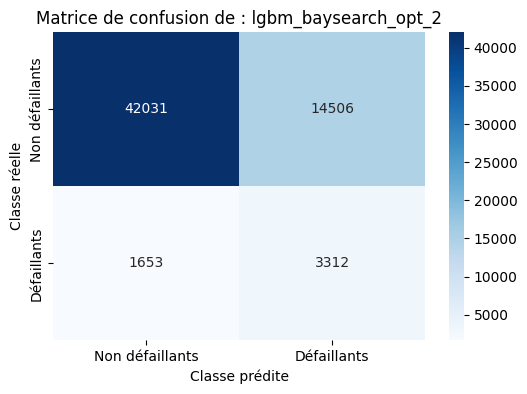

In [118]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_baysearch_opt_2,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_baysearch_opt_2')

In [119]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_baysearch_opt_2',
                                        1653, 14506, 3312, 42031, df_taux)

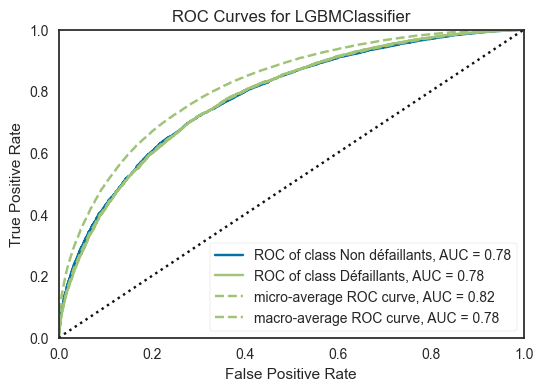

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [49]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_baysearch_opt_2_fit = lgbm_baysearch_opt_2.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_baysearch_opt_2_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>4.3.3. Optimisation LGBM : BayesSearchCV - Score PR_AUC</span>

In [50]:
# Modèle lgbm
lgbm_baysearch_opt_3 = LGBMClassifier(objective='binary')

In [51]:
# Hyperparamètres à optimiser
params_search_spaces_3 = {'num_leaves': Integer(25, 50),
                          'max_depth': Integer(6, 11),
                          'min_split_gain' : Real(0, 0.1),
                          'min_child_weight' : Integer(5,80),
                          'min_child_samples' : Integer(5,80),
                          'colsample_bytree' : Real(0.5,1),
                          'reg_alpha' : Real(0.001, 0.3),
                          'reg_lambda' : Real(0.001, 0.3),
                          'subsample': Real(0.5, 1.0)}

In [52]:
# Initialisation de BayesSearchCV
baysearch_opt_3 = BayesSearchCV(lgbm_baysearch_opt_3,
                                params_search_spaces_3,
                                scoring=pr_auc,
                                cv=skf,
                                n_iter=100,
                                n_jobs=-1,  
                                return_train_score=False,
                                refit=True,
                                optimizer_kwargs={'base_estimator': 'GP'},
                                random_state=seed)

In [55]:
df_lgbm_baysearch_opt_3 = fonctions_data.lancer_optimise_baysearch(baysearch_opt_3, X_train, y_train)

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35997
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 216
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [120]:
param_lgbm_baysearch_opt_3 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced        
                             'colsample_bytree': 0.5,
                             'max_depth': 7,
                             'min_child_samples': 5,
                             'min_child_weight': 80,
                             'min_split_gain': 0.1,
                             'num_leaves': 49,
                             'reg_alpha': 0.2462044816930584,
                             'reg_lambda': 0.03339657352794735,
                             'subsample': 0.5920380183565702,
                             'verbosity' : -1}

In [121]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_baysearch_opt_3 = LGBMClassifier(**param_lgbm_baysearch_opt_3,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_baysearch_opt_3,0.674924,0.185774,0.291353,0.612860,0.657776,0.778380,0.269243,0.725437,9.971132,10.439656,0.838503,0.000282,0.780536,0.004126,0.769117,0.001281,0.677241,0.009535,0.211392,0.000452,0.186396,0.002381


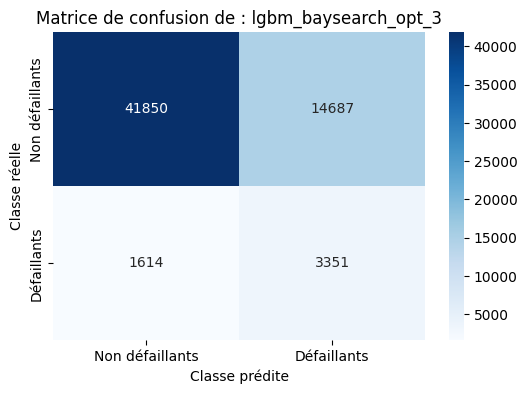

In [122]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = process_classification(lgbm_baysearch_opt_3,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_baysearch_opt_3')

In [123]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_baysearch_opt_3',
                                        1614, 14687, 3351, 41850, df_taux)

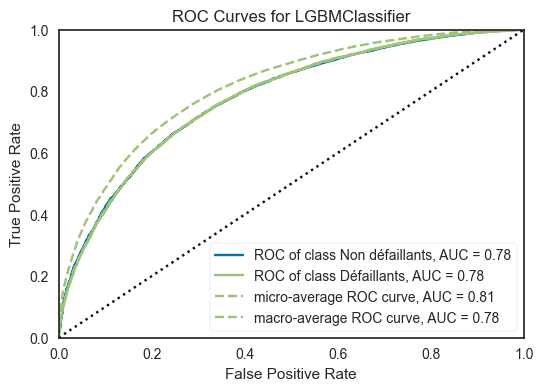

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [60]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_baysearch_opt_3_fit = lgbm_baysearch_opt_3.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_baysearch_opt_3_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>4.3.4. Optimisation LGBM : BayesSearchCV - Score F10</span>

In [61]:
# Modèle lgbm
lgbm_baysearch_opt_4 = LGBMClassifier(objective='binary')

In [62]:
# Hyperparamètres à optimiser
params_search_spaces_4 = {'num_leaves': Integer(25, 50),
                          'max_depth': Integer(6, 11),
                          'min_split_gain' : Real(0, 0.1),
                          'min_child_weight' : Integer(5,80),
                          'min_child_samples' : Integer(5,80),
                          'colsample_bytree' : Real(0.5,1),
                          'reg_alpha' : Real(0.001, 0.3),
                          'reg_lambda' : Real(0.001, 0.3),
                          'subsample': Real(0.5, 1.0)}

In [63]:
# Initialisation de BayesSearchCV
baysearch_opt_4 = BayesSearchCV(lgbm_baysearch_opt_4,
                                params_search_spaces_4,
                                scoring=f10_score,
                                cv=skf,
                                n_iter=100,
                                n_jobs=-1,  
                                return_train_score=False,
                                refit=True,
                                optimizer_kwargs={'base_estimator': 'GP'},
                                random_state=seed)

In [64]:
df_lgbm_baysearch_opt_4 = fonctions_data.lancer_optimise_baysearch(baysearch_opt_4, X_train, y_train)

[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.374570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35997
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 216
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best CV score : 0.0424817307926355 +/- 0.0026904988688841486
Best Hyperparamètres :

OrderedDict([('colsample_bytree', 0.9959757710776138), ('max_depth', 11), ('min_child_samples', 41), ('min_child_w

In [124]:
param_lgbm_baysearch_opt_4 = {'objective' : 'binary',
                             'boosting_type' : 'gbdt',
                             'n_jobs' : -1,
                             'class_weight' : 'balanced', # Balanced        
                             'colsample_bytree': 0.9959757710776138,
                             'max_depth': 11,
                             'min_child_samples': 41,
                             'min_child_weight': 74,
                             'min_split_gain': 0.09726782493602015,
                             'num_leaves': 50,
                             'reg_alpha': 0.07680759456109718,
                             'reg_lambda':  0.15074146979004044,
                             'subsample': 0.6521742352347463,
                             'verbosity' : -1}

In [125]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_baysearch_opt_4 = LGBMClassifier(**param_lgbm_baysearch_opt_4,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_baysearch_opt_4,0.671903,0.186369,0.291800,0.610709,0.655008,0.780456,0.270011,0.726436,11.476125,12.154943,0.850379,0.000426,0.780739,0.004188,0.786444,0.001605,0.677090,0.011914,0.217453,0.000941,0.187571,0.002584


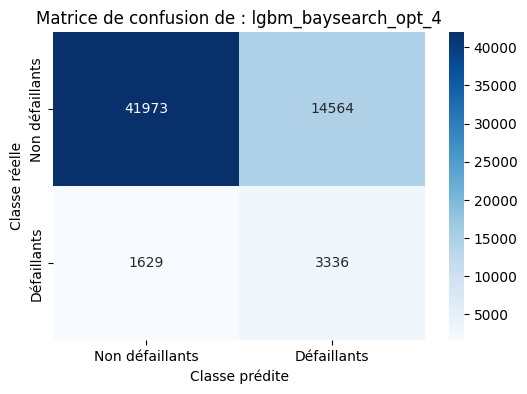

In [126]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_baysearch_opt_4,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_baysearch_opt_4')

In [127]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_baysearch_opt_4',
                                        1629, 14564, 3336, 41973, df_taux)

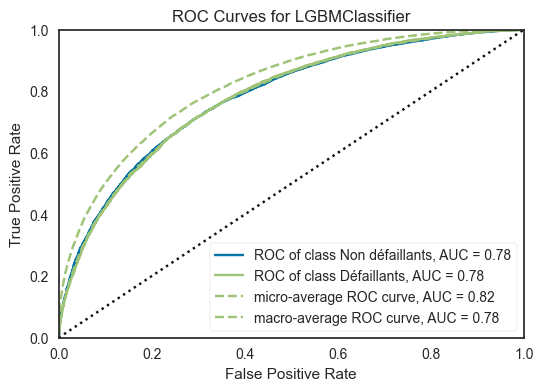

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [69]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_baysearch_opt_4_fit = lgbm_baysearch_opt_4.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_baysearch_opt_4_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

In [128]:
mask = df_taux['FN']< 2000
df_taux[mask].sort_values(by='FN')

,Modèle,FN,FP,TP,TN
3,lgbm_hyperparam_base_std_bal,1552,15242,3413,41295
7,lgbm_bayesian_opt_1_bal,1562,15186,3403,41351
15,lgbm_bayesian_opt_8,1567,15419,3398,41118
1,lgbm_hyperparam_base_bal,1571,15178,3394,41359
11,lgbm_bayesian_opt_9,1591,14816,3374,41721
18,lgbm_baysearch_opt_3,1614,14687,3351,41850
13,lgbm_bayesian_opt_6,1627,14570,3338,41967
16,lgbm_baysearch_opt_1,1627,14548,3338,41989
10,lgbm_bayesian_opt_4,1628,14616,3337,41921
19,lgbm_baysearch_opt_4,1629,14564,3336,41973


### <span style='background:orange'>5.4. Optimisation: OPTUNA intégré à LGBM</span>

## Création de la grille de recherche dans Optuna


Optuna est un framework de réglage automatique d'hyperparamètres de nouvelle génération entièrement écrit en Python.

Ses caractéristiques les plus marquantes sont :

- la possibilité de définir des espaces de recherche Pythonic à l'aide de boucles et de conditions.
- API indépendante de la plate-forme - vous pouvez régler les estimateurs de presque tous les packages/frameworks ML, DL, y compris Sklearn, PyTorch, TensorFlow, Keras, XGBoost, LightGBM, CatBoost, etc.
- une large suite d'algorithmes d'optimisation avec des fonctionnalités d'arrêt et d'élagage précoces intégrées.
- Parallélisation facile avec peu ou pas de modifications du code.
- Prise en charge intégrée pour l'exploration visuelle des résultats de recherche.

Le processus d'optimisation dans Optuna nécessite une fonction appelée objectif qui :

- inclut la grille de paramètres pour effectuer une recherche sous forme de dictionnaire
- crée un modèle pour essayer des ensembles de combinaisons d'hyperparamètres
- adapte le modèle aux données avec un seul ensemble de candidats
- génère des prédictions à l'aide de ce modèle
- note les prédictions en fonction de métriques définies par l'utilisateur et les renvoie


Avec Optima, Nous pouvons reprendre l'optimisation même après qu'elle soit terminée si nous ne sommes pas satisfaits des résultats !
C'est un net avantage par rapport à d'autres outils similaires car une fois la recherche effectuée, ils oublient complètement l'historique des essais précédents. Optuna ne le fait pas !
Pour continuer la recherche, appelez optimize à nouveau avec les paramètres souhaités.

Dans Optuna, l'ensemble du processus d'optimisation s'appelle une étude : study = `optuna.create_study()`
Une étude a besoin d'une fonction qu'elle peut optimiser. Typiquement, cette fonction est définie par l'utilisateur et doit être nommée `objective`.
Elle doit accepter un `optuna.Trial` objet en tant que paramètre et renvoyer la métrique que nous voulons optimiser.

Si la métrique que nous voulons optimiser est un score de performance en points comme le ROC AUC ou la précision, nous définissons la direction sur `maximize`. Sinon, nous minimisons une fonction de perte telle que RMSE, RMSLE, perte de journal, etc. en définissant la direction sur `minimize`.

#### <span style='background:Moccasin'>5.4.1. Optimisation: OPTUNA intégré à LGBM - Score ROC_AUC</span>

**Sans les hyperparamètres n_estimators et learning_rate**

In [105]:
# Modèle et hyperparamètres à étudier
def create_model(trial):
#     n_estimators = trial.suggest_int('n_estimators', 50, 10000)
    max_depth = trial.suggest_int('max_depth', 3, 11)
#     learning_rate = trial.suggest_uniform('learning_rate', 0.0001, 0.99)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    lambda_l1 = trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
    lambda_l2 = trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    feature_fraction = trial.suggest_uniform('feature_fraction', 0.4, 1.0),
    bagging_fraction = trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
    bagging_freq = trial.suggest_int('bagging_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'auc',
        class_weight='balanced',
#         n_estimators=n_estimators, 
        max_depth=max_depth, 
#         learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        lambda_l1=lambda_l1,
        lambda_l2=lambda_l2,
        num_leaves=num_leaves,
        feature_fraction=feature_fraction,
        bagging_fraction=bagging_fraction,
        bagging_freq=bagging_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [107]:
# Objective fonction
def objective(trial):
    model = create_model(trial)
    model.fit(X_train, y_train)
    y_proba = model.predict_proba(X_valid)[:,1]
    score = roc_auc_score(y_valid, y_proba)
    return score

In [103]:
from optuna.integration import LightGBMPruningCallback

def objective(trial, X, y):
    
    param_grid = {
        "objective": "binary",
        "class_weight": "balanced",
        "verbose": -1,
        "boosting_type": "gbdt",
        "max_depth": trial.suggest_int("max_depth", 3, 11),
        "subsample" : trial.suggest_uniform('subsample', 0.1, 1.0),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "lambda_l1": trial.suggest_loguniform("lambda_l1", 1e-8, 10.0),
        "lambda_l2": trial.suggest_loguniform("lambda_l2", 1e-8, 10.0),
        "feature_fraction": trial.suggest_uniform("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),
    }



 
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)

    cv_scores = np.empty(5)
    
    for idx, (train_index, test_index) in enumerate(cv.split(X, y)):
               
        X_train, X_test = X.take(list(train_index),axis=0), X.take(list(test_index),axis=0)
        y_train, y_test = y.take(list(train_index),axis=0), y.take(list(test_index),axis=0)
    
        model = LGBMClassifier(**param_grid, n_jobs=-2, random_state=101)
        
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            callbacks=[LightGBMPruningCallback(trial, "binary_logloss")])  # Add a pruning callback
        
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)
                
    return np.mean(cv_scores)
    

In [109]:
# Recherche des p
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2024-05-24 17:14:34,315] A new study created in memory with name: no-name-9d79caef-bb05-4605-921f-3a688db1651e
[I 2024-05-24 17:14:45,976] Trial 0 finished with value: 0.7702236899252014 and parameters: {'max_depth': 3, 'subsample': 0.8445440508870183, 'colsample_bytree': 0.1881819232218927, 'lambda_l1': 2.1535454695431166e-06, 'lambda_l2': 5.790954449749646e-06, 'num_leaves': 229, 'feature_fraction': 0.7869408300135335, 'bagging_fraction': 0.961217494546844, 'bagging_freq': 4, 'min_child_samples': 47}. Best is trial 0 with value: 0.7702236899252014.
[I 2024-05-24 17:14:59,785] Trial 1 finished with value: 0.7774729454234901 and parameters: {'max_depth': 11, 'subsample': 0.2400839377647657, 'colsample_bytree': 0.41164752955412776, 'lambda_l1': 0.16741577418930573, 'lambda_l2': 1.431815746781715e-07, 'num_leaves': 58, 'feature_fraction': 0.8505733328419484, 'bagging_fraction': 0.7058874701560405, 'bagging_freq': 5, 'min_child_samples': 23}. Best is trial 1 with value: 0.7774729454234

In [117]:
print(f"\tBest value : {study.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study.trials)}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.78063
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 11
		subsample: 0.5097768139865435
		colsample_bytree: 0.5539707025613337
		lambda_l1: 0.01600498545250482
		lambda_l2: 1.4905131542094282e-08
		num_leaves: 57
		feature_fraction: 0.8854125221753086
		bagging_fraction: 0.9989906391214178
		bagging_freq: 6
		min_child_samples: 59


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


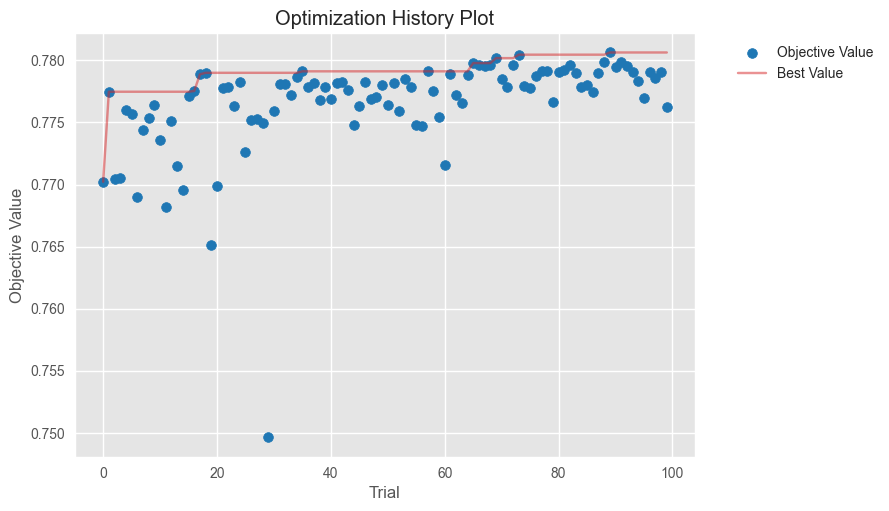

In [111]:
from optuna.visualization.matplotlib import plot_optimization_history

plot_optimization_history(study);

In [112]:
study.best_params

{'max_depth': 11,
 'subsample': 0.5097768139865435,
 'colsample_bytree': 0.5539707025613337,
 'lambda_l1': 0.01600498545250482,
 'lambda_l2': 1.4905131542094282e-08,
 'num_leaves': 57,
 'feature_fraction': 0.8854125221753086,
 'bagging_fraction': 0.9989906391214178,
 'bagging_freq': 6,
 'min_child_samples': 59}

In [129]:
param_lgbm_optuna_opt_1 = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced                                 
                           'max_depth': 11,
                           'subsample': 0.5097768139865435,               
                           'colsample_bytree': 0.5539707025613337,                          
                           'reg_alpha': 0.01600498545250482,
                           'reg_lambda': 1.4905131542094282e-08,
                           'num_leaves': 57,
                           'min_child_weight': 0.8854125221753086,
                           'subsample': 0.9989906391214178,
                           'subsample_freq':6,
                           'min_child_samples': 59,
                           'verbosity' : -1}

In [130]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_1 = LGBMClassifier(**param_lgbm_optuna_opt_1,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_1,0.665861,0.188709,0.294076,0.606845,0.649599,0.780484,0.267830,0.729870,9.601974,10.082712,0.858644,0.000480,0.779958,0.004127,0.795205,0.000943,0.668580,0.009146,0.223467,0.000660,0.188736,0.002916


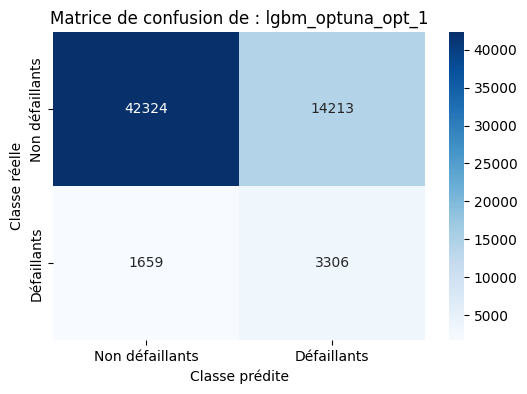

In [131]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_1,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_1')

In [132]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_1',
                                        1659, 14213, 3306, 42324, df_taux)

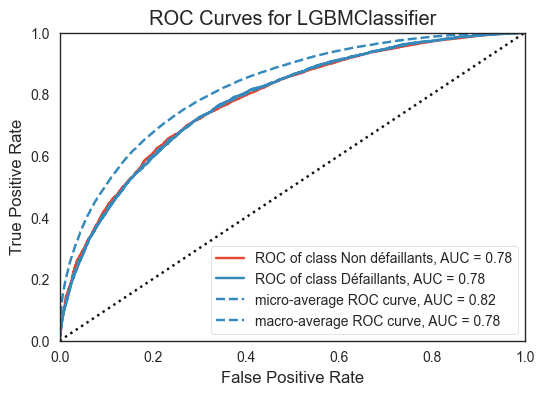

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [122]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_1_fit = lgbm_optuna_opt_1.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_1_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

In [133]:
param_lgbm_optuna_opt_1_bis = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced                                 
                           'max_depth': 11,
                           'subsample': 0.5097768139865435,               
                           'colsample_bytree': 0.5539707025613337,                          
                           'reg_alpha': 0.01600498545250482,
                           'reg_lambda': 1.4905131542094282e-08,
                           'num_leaves': 57,
                           'min_child_weight': 0.8854125221753086,
                           # 'subsample': 0.9989906391214178,
                           # 'subsample_freq':6,
                           'min_child_samples': 59,
                           'verbosity' : -1}

In [134]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_1_bis = LGBMClassifier(**param_lgbm_optuna_opt_1_bis,
                                       force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_1_bis,0.664451,0.188020,0.293101,0.605445,0.648189,0.779983,0.268193,0.729085,9.153636,9.387771,0.858626,0.000355,0.780555,0.004637,0.794702,0.001752,0.670091,0.010446,0.223319,0.000567,0.188992,0.003145


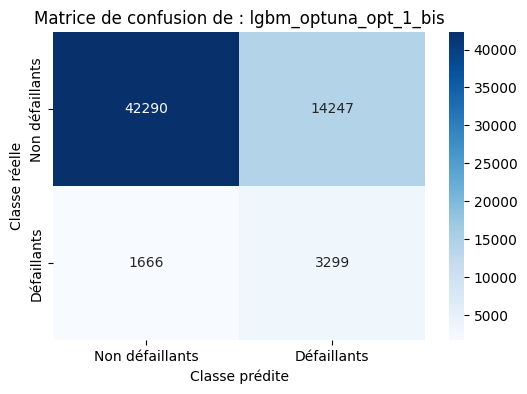

In [135]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_1_bis,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_1_bis')

In [136]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_1_bis',
                                        1666, 14247, 3299, 42290, df_taux)

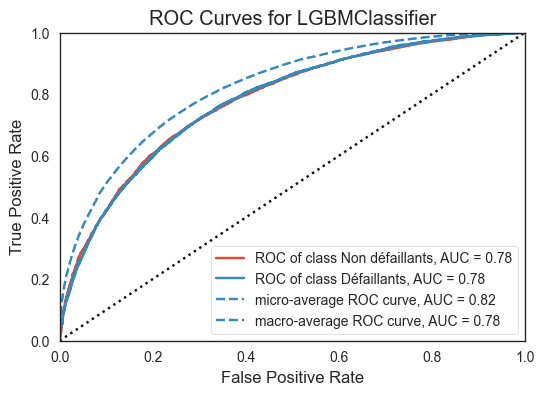

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [128]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_1_bis_fit = lgbm_optuna_opt_1_bis.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_1_bis_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

**Avec les hyperparamètres n_estimators et learning_rate**

In [129]:
# Modèle et hyperparamètres à étudier
def create_model_2(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 11)
    learning_rate = trial.suggest_uniform('learning_rate', 0.0001, 0.99)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'auc',
        class_weight='balanced',
        n_estimators=n_estimators, 
        max_depth=max_depth, 
        learning_rate=learning_rate,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [130]:
# Objective fonction
def objective_2(trial):
    model = create_model_2(trial)
    model.fit(X_train, y_train)
    y_proba = model.predict_proba(X_valid)[:,1]
    score = roc_auc_score(y_valid, y_proba)
    return score

In [131]:
# Recherche des p
study_2 = optuna.create_study(direction='maximize')
study_2.optimize(objective_2, n_trials=100)

[I 2024-05-24 18:07:43,022] A new study created in memory with name: no-name-da7e27e2-6dbc-421e-b83a-8160bd64d01c
[I 2024-05-24 18:07:51,488] Trial 0 finished with value: 0.7045000661812943 and parameters: {'n_estimators': 91, 'max_depth': 8, 'learning_rate': 0.6593910326331728, 'subsample': 0.2721973835252691, 'colsample_bytree': 0.51147563732217, 'reg_alpha': 1.2664658996402691, 'reg_lambda': 1.1667910458053847, 'num_leaves': 25, 'min_child_weight': 0.9169333106252141, 'subsample_freq': 6, 'min_child_samples': 91}. Best is trial 0 with value: 0.7045000661812943.
[I 2024-05-24 18:08:16,642] Trial 1 finished with value: 0.7389871093159484 and parameters: {'n_estimators': 238, 'max_depth': 7, 'learning_rate': 0.4494306201119951, 'subsample': 0.7815960803058095, 'colsample_bytree': 0.4714592213911072, 'reg_alpha': 4.740785945262676, 'reg_lambda': 1.1915610421764354e-05, 'num_leaves': 48, 'min_child_weight': 0.9094433290538564, 'subsample_freq': 5, 'min_child_samples': 5}. Best is trial 1

In [132]:
print(f"\tBest value : {study_2.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_2.trials)}")
print(f"\tBest params:")

for key, value in study_2.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.78401
	Nombre d'essai terminés : 100
	Best params:
		n_estimators: 802
		max_depth: 4
		learning_rate: 0.0615958589466801
		subsample: 0.993016294352226
		colsample_bytree: 0.7127621272722958
		reg_alpha: 3.408534692977383e-08
		reg_lambda: 9.959589298180774
		num_leaves: 226
		min_child_weight: 0.8645674793732693
		subsample_freq: 1
		min_child_samples: 31


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


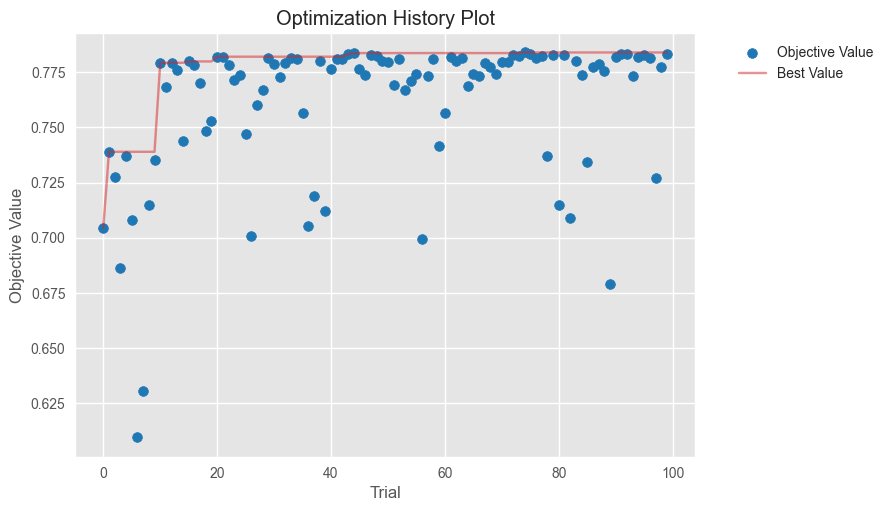

In [133]:
from optuna.visualization.matplotlib import plot_optimization_history

plot_optimization_history(study_2);

In [134]:
study_2.best_params

{'n_estimators': 802,
 'max_depth': 4,
 'learning_rate': 0.0615958589466801,
 'subsample': 0.993016294352226,
 'colsample_bytree': 0.7127621272722958,
 'reg_alpha': 3.408534692977383e-08,
 'reg_lambda': 9.959589298180774,
 'num_leaves': 226,
 'min_child_weight': 0.8645674793732693,
 'subsample_freq': 1,
 'min_child_samples': 31}

In [137]:
param_lgbm_optuna_opt_2 = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced        
                           'colsample_bytree':  0.712762127272295,
                           'max_depth': 4,
                           'min_child_weight':  0.8645674793732693,
                           'num_leaves': 226,
                           'reg_alpha': 3.408534692977383e-08,
                           'reg_lambda': 9.959589298180774,
                           'subsample': 0.993016294352226,
                           'subsample_freq': 1,
                           'min_child_samples': 31,
                           'n_estimators': 802,
                           'learning_rate': 0.0615958589466801,
                           'verbosity' : -1}

In [138]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_2 = LGBMClassifier(**param_lgbm_optuna_opt_2,
                                       force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_2,0.661833,0.190250,0.295543,0.604228,0.645979,0.782917,0.274424,0.732064,25.654629,26.623399,0.851442,0.000451,0.783570,0.004180,0.780044,0.001011,0.670443,0.008771,0.222313,0.000543,0.191565,0.002319


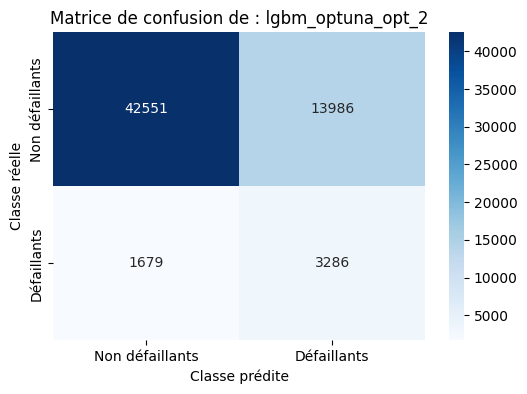

In [139]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_2,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_2')

In [140]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_2',
                                        1679, 13986, 3286, 42551, df_taux)

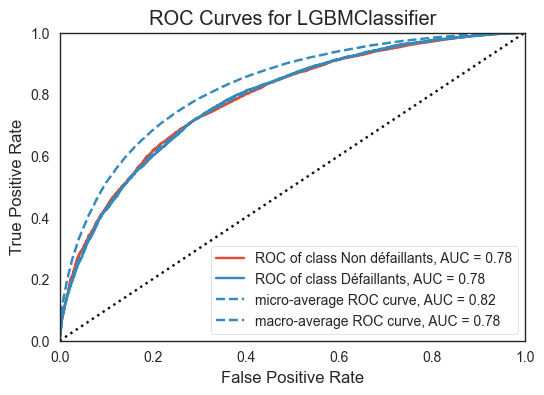

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [153]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_2_fit = lgbm_optuna_opt_2.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_2_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.4.2. Optimisation LGBM : Optuna intégrée à LightGBM - Score Métrique métier</span>

**Sans les hyperparamètres n_estimators et learning_rate**

In [154]:
# Modèle et hyperparamètres à étudier
def create_model_3(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'custom_score',
        class_weight='balanced',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [157]:
# Objective fonction
def objective_3(trial):
    model = create_model_3(trial)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)
    score = custom_score(y_valid, y_pred)
    return score

In [158]:
# Recherche des paramètres
study_3 = optuna.create_study(direction='maximize')
study_3.optimize(objective_3, n_trials=100)

[I 2024-05-24 22:58:17,749] A new study created in memory with name: no-name-5c602b38-fa12-4a40-a173-0908258277f2
[I 2024-05-24 22:58:39,147] Trial 0 finished with value: 0.7313338897478348 and parameters: {'max_depth': 7, 'subsample': 0.47097088777367946, 'colsample_bytree': 0.3607755986397343, 'reg_alpha': 0.713734484140167, 'reg_lambda': 1.2566887201892947, 'num_leaves': 173, 'min_child_weight': 0.4854216757146251, 'subsample_freq': 4, 'min_child_samples': 51}. Best is trial 0 with value: 0.7313338897478348.
[I 2024-05-24 22:59:03,381] Trial 1 finished with value: 0.7482452419718965 and parameters: {'max_depth': 10, 'subsample': 0.37368608033753326, 'colsample_bytree': 0.3604913648287029, 'reg_alpha': 2.5721789174642784e-08, 'reg_lambda': 2.3776959250867768e-08, 'num_leaves': 220, 'min_child_weight': 0.5675198890003701, 'subsample_freq': 6, 'min_child_samples': 81}. Best is trial 1 with value: 0.7482452419718965.
[I 2024-05-24 22:59:14,138] Trial 2 finished with value: 0.71060972995

In [159]:
print(f"\tBest value : {study_3.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_3.trials)}")
print(f"\tBest params:")

for key, value in study_3.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.76509
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 11
		subsample: 0.8649806480343231
		colsample_bytree: 0.9749667655821896
		reg_alpha: 0.003752828745540576
		reg_lambda: 6.076452609169149e-08
		num_leaves: 248
		min_child_weight: 0.5081158712056583
		subsample_freq: 6
		min_child_samples: 20


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


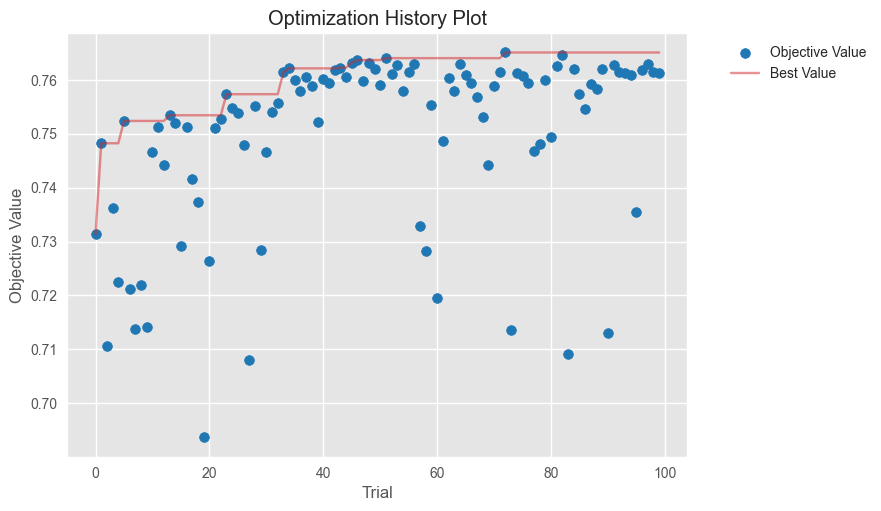

In [160]:
from optuna.visualization.matplotlib import plot_optimization_history

plot_optimization_history(study_3);

In [161]:
study_3.best_params

{'max_depth': 11,
 'subsample': 0.8649806480343231,
 'colsample_bytree': 0.9749667655821896,
 'reg_alpha': 0.003752828745540576,
 'reg_lambda': 6.076452609169149e-08,
 'num_leaves': 248,
 'min_child_weight': 0.5081158712056583,
 'subsample_freq': 6,
 'min_child_samples': 20}

In [141]:
param_lgbm_optuna_opt_3 = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced        
                           'colsample_bytree':  0.9749667655821896,
                           'max_depth': 11,
                           'min_child_weight': 0.5081158712056583,
                           'num_leaves': 248,
                           'reg_alpha': 0.003752828745540576,
                           'reg_lambda': 6.076452609169149e-08,
                           'subsample': 0.8649806480343231,
                           'subsample_freq': 6,
                           'min_child_samples': 20,
                           'verbosity' : -1}

In [142]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_3 = LGBMClassifier(**param_lgbm_optuna_opt_3,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_3,0.532931,0.220005,0.311441,0.505288,0.525530,0.767761,0.256680,0.765882,21.741343,22.318084,0.965040,0.000753,0.764801,0.002968,0.935829,0.001309,0.515206,0.004891,0.388605,0.003400,0.219262,0.002603


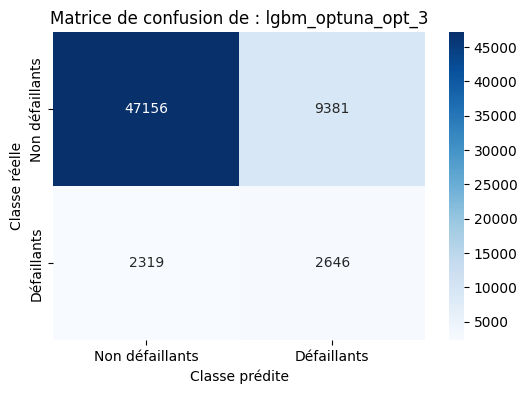

In [143]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_3,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_3')

In [144]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_3',
                                        2319, 9381, 2646, 47156, df_taux)

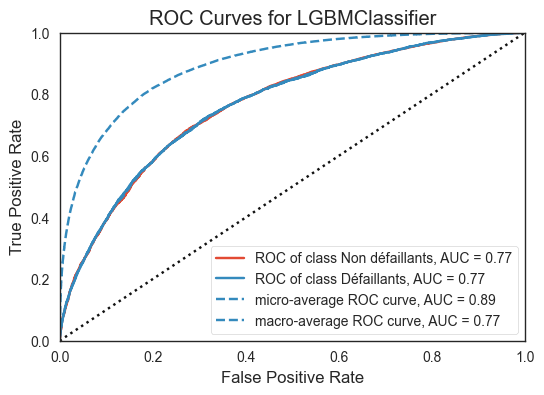

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [169]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_3_fit = lgbm_optuna_opt_3.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_3_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.4.3. Optimisation LGBM : Optuna intégrée à LightGBM - Score PR_AUC</span>

**Sans les hyperparamètres n_estimators et learning_rate**

In [170]:
# Modèle et hyperparamètres à étudier
def create_model_4(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'pr_auc',
        class_weight='balanced',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [171]:
# Objective fonction
def objective_4(trial):
    model = create_model_4(trial)
    model.fit(X_train, y_train)
    y_proba = model.predict_proba(X_valid)[:,1]
    score = average_precision_score(y_valid, y_proba)
    return score

In [172]:
# Recherche des paramètres
study_4 = optuna.create_study(direction='maximize')
study_4.optimize(objective_4, n_trials=100)

[I 2024-05-25 02:27:17,954] A new study created in memory with name: no-name-1cac06fa-bb40-4e15-a198-f67429ef958a
[I 2024-05-25 02:27:37,659] Trial 0 finished with value: 0.26577952881414546 and parameters: {'max_depth': 11, 'subsample': 0.8120688159926742, 'colsample_bytree': 0.17859694585927471, 'reg_alpha': 2.1400917760458052e-05, 'reg_lambda': 1.216215705130432e-07, 'num_leaves': 48, 'min_child_weight': 0.7385871315706783, 'subsample_freq': 2, 'min_child_samples': 41}. Best is trial 0 with value: 0.26577952881414546.
[I 2024-05-25 02:28:02,094] Trial 1 finished with value: 0.2598966113231763 and parameters: {'max_depth': 9, 'subsample': 0.7047446997145779, 'colsample_bytree': 0.37851494132397345, 'reg_alpha': 1.7076812046011662e-06, 'reg_lambda': 1.6107589365388192e-05, 'num_leaves': 175, 'min_child_weight': 0.6471560788862275, 'subsample_freq': 5, 'min_child_samples': 39}. Best is trial 0 with value: 0.26577952881414546.
[I 2024-05-25 02:28:26,512] Trial 2 finished with value: 0.2

In [173]:
print(f"\tBest value : {study_4.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_4.trials)}")
print(f"\tBest params:")

for key, value in study_4.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.27201
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 8
		subsample: 0.8690553660524307
		colsample_bytree: 0.8579235494420439
		reg_alpha: 8.946994900690928
		reg_lambda: 0.28024800176077547
		num_leaves: 68
		min_child_weight: 0.6771768844623803
		subsample_freq: 7
		min_child_samples: 97


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


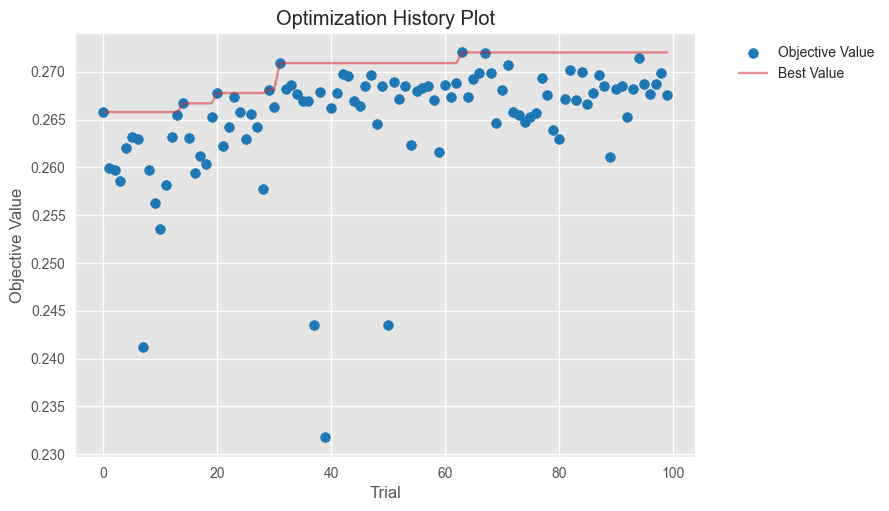

In [175]:
plot_optimization_history(study_4);

In [176]:
study_4.best_params

{'max_depth': 8,
 'subsample': 0.8690553660524307,
 'colsample_bytree': 0.8579235494420439,
 'reg_alpha': 8.946994900690928,
 'reg_lambda': 0.28024800176077547,
 'num_leaves': 68,
 'min_child_weight': 0.6771768844623803,
 'subsample_freq': 7,
 'min_child_samples': 97}

In [145]:
param_lgbm_optuna_opt_4 = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced        
                           'colsample_bytree': 0.8579235494420439,
                           'max_depth': 8,
                           'min_child_weight': 0.672166188785165,
                           'num_leaves': 68,
                           'reg_alpha': 8.946994900690928,
                           'reg_lambda': 0.28024800176077547,
                           'subsample': 0.8690553660524307,
                           'subsample_freq': 7,
                           'min_child_samples': 97,
                           'verbosity' : -1}

In [146]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_4 = LGBMClassifier(**param_lgbm_optuna_opt_4,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_4,0.659819,0.189518,0.294459,0.602329,0.643996,0.779917,0.269145,0.731279,9.985317,10.313527,0.859187,0.000357,0.779568,0.003559,0.792386,0.001336,0.662790,0.008510,0.226005,0.000633,0.189748,0.002198


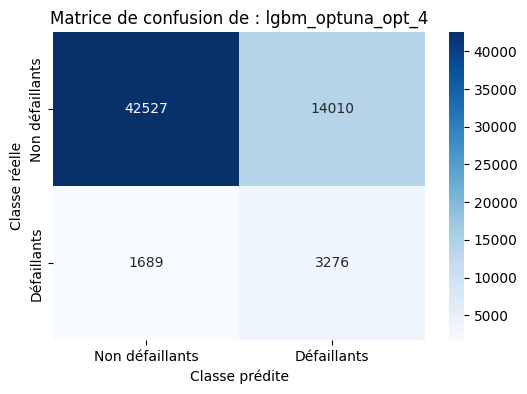

In [147]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_4,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_4')

In [148]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_4',
                                        1689, 14010, 3276, 42527, df_taux)

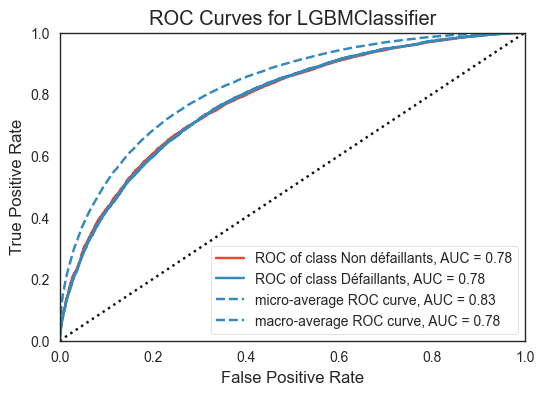

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [180]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_4_fit = lgbm_optuna_opt_4.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_4_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.4.4. Optimisation LGBM : Optuna intégrée à LightGBM -  Score F10</span>

**Sans les hyperparamètres n_estimators et learning_rate**

In [181]:
# Modèle et hyperparamètres à étudier
def create_model_5(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'f10_score',
        class_weight='balanced',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [184]:
# Objective fonction
def objective_5(trial):
    model = create_model_5(trial)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)
    score = fbeta_score(y_valid, y_pred, beta = 10)
    return score

In [185]:
# Recherche des paramètres
study_5 = optuna.create_study(direction='maximize')
study_5.optimize(objective_5, n_trials=100)

[I 2024-05-25 13:33:06,160] A new study created in memory with name: no-name-acfff5cb-515f-4527-b037-491cd00c3455
[I 2024-05-25 13:33:16,060] Trial 0 finished with value: 0.6651085361906811 and parameters: {'max_depth': 3, 'subsample': 0.17703884181148322, 'colsample_bytree': 0.8778096105199931, 'reg_alpha': 8.197897174728958, 'reg_lambda': 2.4572797452950058e-06, 'num_leaves': 256, 'min_child_weight': 0.4536214401038215, 'subsample_freq': 7, 'min_child_samples': 47}. Best is trial 0 with value: 0.6651085361906811.
[I 2024-05-25 13:33:36,310] Trial 1 finished with value: 0.5986962602330113 and parameters: {'max_depth': 8, 'subsample': 0.24117262936166697, 'colsample_bytree': 0.24776181382143175, 'reg_alpha': 3.137541578762539e-05, 'reg_lambda': 6.451345552727982e-05, 'num_leaves': 250, 'min_child_weight': 0.6847215722540022, 'subsample_freq': 5, 'min_child_samples': 35}. Best is trial 0 with value: 0.6651085361906811.
[I 2024-05-25 13:33:53,762] Trial 2 finished with value: 0.577850751

In [186]:
print(f"\tBest value : {study_5.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_5.trials)}")
print(f"\tBest params:")

for key, value in study_5.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.67925
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 9
		subsample: 0.8750407899513158
		colsample_bytree: 0.7612631499847201
		reg_alpha: 0.0007176968775833407
		reg_lambda: 5.522303441642108e-07
		num_leaves: 13
		min_child_weight: 0.4799435593962544
		subsample_freq: 4
		min_child_samples: 91


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


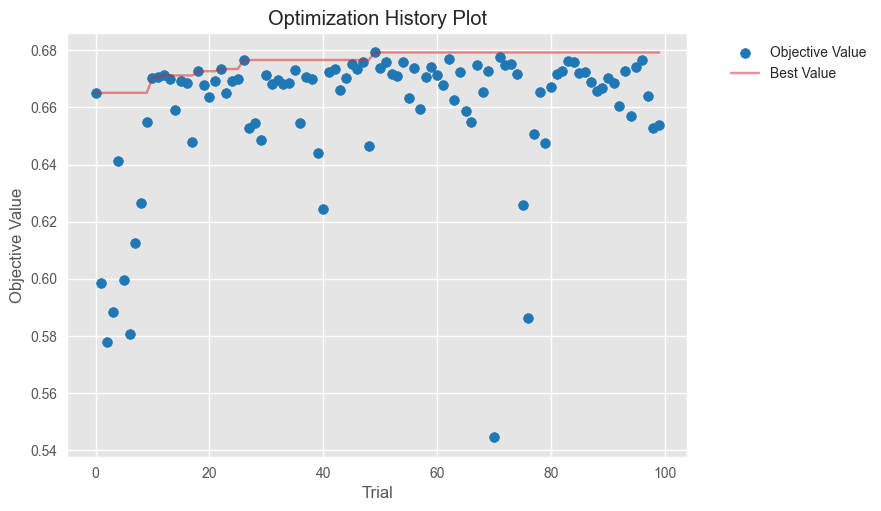

In [187]:
plot_optimization_history(study_5);

In [188]:
study_5.best_params

{'max_depth': 9,
 'subsample': 0.8750407899513158,
 'colsample_bytree': 0.7612631499847201,
 'reg_alpha': 0.0007176968775833407,
 'reg_lambda': 5.522303441642108e-07,
 'num_leaves': 13,
 'min_child_weight': 0.4799435593962544,
 'subsample_freq': 4,
 'min_child_samples': 91}

In [149]:
param_lgbm_optuna_opt_5 = {'objective' : 'binary',
                           'boosting_type' : 'gbdt',
                           'n_jobs' : -1,
                           'class_weight' : 'balanced', # Balanced        
                           'colsample_bytree': 0.7612631499847201,
                           'max_depth': 9,
                           'min_child_samples': 96,
                           'min_child_weight': 0.5685528790757488,
                           'num_leaves': 13,
                           'reg_alpha': 0.0007176968775833407,
                           'reg_lambda': 5.522303441642108e-07,
                           'subsample': 0.8750407899513158,
                           'subsample_freq': 4,
                           'verbosity' : -1}

In [150]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_5 = LGBMClassifier(**param_lgbm_optuna_opt_5,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F10,0.695065,0.178605,0.284185,0.625499,0.675720,0.776303,0.265826,0.713798,10.245858,10.590294,0.797493,0.000537,0.778553,0.004245,0.730793,0.001400,0.703172,0.008593,0.184869,0.000690,0.177755,0.001889


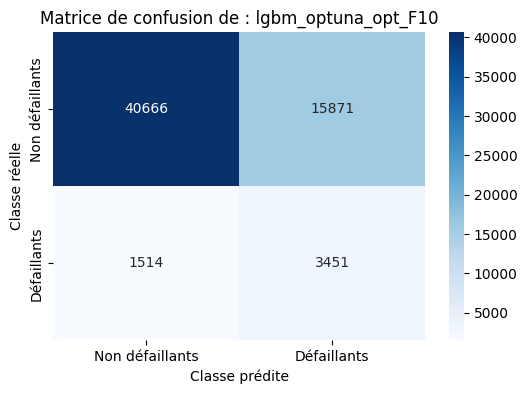

In [151]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_5,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_F10')

In [152]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_F10',
                                        1514, 15871, 3451, 40666, df_taux)

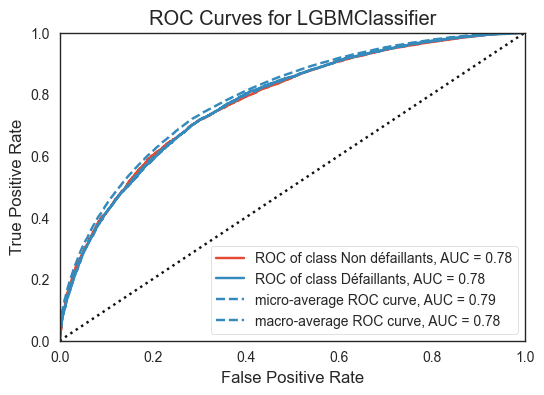

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [193]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_5_fit = lgbm_optuna_opt_5.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_5_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.4.5. Optimisation LGBM : Optuna intégrée à LightGBM -  Score F1</span>

**Sans les hyperparamètres n_estimators et learning_rate**

In [194]:
# Modèle et hyperparamètres à étudier
def create_model_6(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'f1_score',
        class_weight='balanced',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [197]:
# Objective fonction
def objective_6(trial):
    model = create_model_6(trial)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)
    score = fbeta_score(y_valid, y_pred, beta = 10)
    return score

In [198]:
# Recherche des paramètres
study_6 = optuna.create_study(direction='maximize')
study_6.optimize(objective_6, n_trials=100)

[I 2024-05-25 14:20:31,492] A new study created in memory with name: no-name-ff12956f-00fd-44d8-bbfe-8cbb4c8895b3
[I 2024-05-25 14:20:44,250] Trial 0 finished with value: 0.6648549320017988 and parameters: {'max_depth': 4, 'subsample': 0.20518465021989885, 'colsample_bytree': 0.4897022866945875, 'reg_alpha': 1.2723428869532366e-08, 'reg_lambda': 3.591184676651278e-06, 'num_leaves': 140, 'min_child_weight': 0.5525877600441839, 'subsample_freq': 4, 'min_child_samples': 57}. Best is trial 0 with value: 0.6648549320017988.
[I 2024-05-25 14:21:03,913] Trial 1 finished with value: 0.6208548627185085 and parameters: {'max_depth': 7, 'subsample': 0.47652160176122993, 'colsample_bytree': 0.31520407432646524, 'reg_alpha': 0.10558757740996351, 'reg_lambda': 0.2252093687062833, 'num_leaves': 84, 'min_child_weight': 0.7795564502835912, 'subsample_freq': 3, 'min_child_samples': 23}. Best is trial 0 with value: 0.6648549320017988.
[I 2024-05-25 14:21:24,537] Trial 2 finished with value: 0.63449771965

In [199]:
print(f"\tBest value : {study_6.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_6.trials)}")
print(f"\tBest params:")

for key, value in study_6.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.67699
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 3
		subsample: 0.9015383705148817
		colsample_bytree: 0.7489615452532481
		reg_alpha: 9.10858199889944e-05
		reg_lambda: 1.159337186163655e-05
		num_leaves: 81
		min_child_weight: 0.7897830476774932
		subsample_freq: 3
		min_child_samples: 84


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


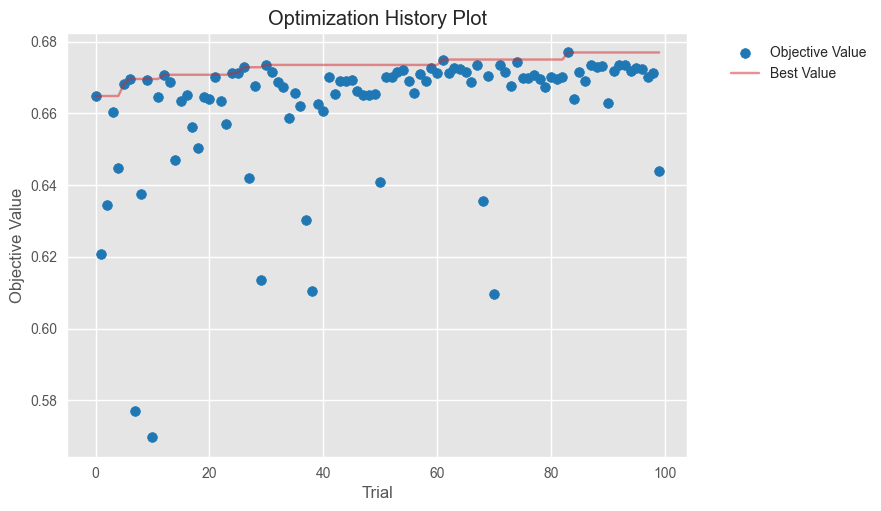

In [200]:
plot_optimization_history(study_6);

In [201]:
study_6.best_params

{'max_depth': 3,
 'subsample': 0.9015383705148817,
 'colsample_bytree': 0.7489615452532481,
 'reg_alpha': 9.10858199889944e-05,
 'reg_lambda': 1.159337186163655e-05,
 'num_leaves': 81,
 'min_child_weight': 0.7897830476774932,
 'subsample_freq': 3,
 'min_child_samples': 84}

In [155]:
param_lgbm_optuna_opt_6 = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.7489615452532481,
                            'max_depth': 3,
                            'min_child_samples': 84,
                            'min_child_weight': 0.7897830476774932,
                            'num_leaves': 81,
                            'reg_alpha': 9.10858199889944e-05,
                            'reg_lambda': 1.159337186163655e-05,
                            'subsample': 0.9015383705148817,
                            'subsample_freq': 3,
                            'verbosity' : -1}

In [157]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_6 = LGBMClassifier(**param_lgbm_optuna_opt_6,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F1,0.697885,0.174700,0.279447,0.625803,0.677788,0.770713,0.257705,0.707622,8.016642,8.631471,0.783939,0.000424,0.771943,0.005111,0.715777,0.001158,0.700101,0.007322,0.178399,0.000424,0.174455,0.001950


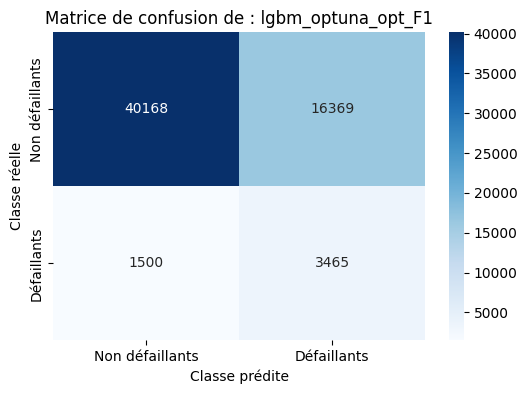

In [158]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_6,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_F1')

In [159]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_F1',
                                        1500, 16369, 3465, 40168, df_taux)

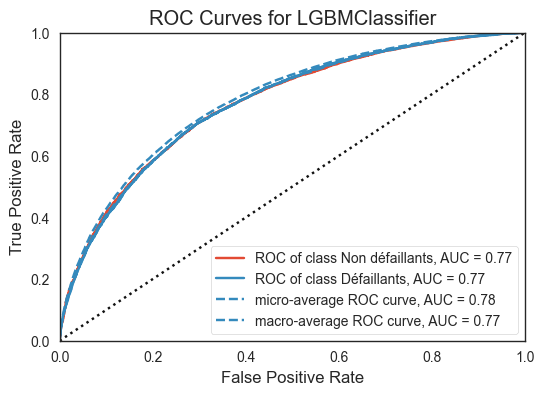

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [206]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_6_fit = lgbm_optuna_opt_6.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_6_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.4.6. Optimisation LGBM : Optuna intégrée à LightGBM -  Score F5</span>

In [207]:
# Modèle et hyperparamètres à étudier
def create_model_7(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'f5_score',
        class_weight='balanced',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [208]:
# Objective fonction
def objective_7(trial):
    model = create_model_7(trial)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)
    score = fbeta_score(y_valid, y_pred, beta = 10)
    return score

In [209]:
# Recherche des paramètres
study_7 = optuna.create_study(direction='maximize')
study_7.optimize(objective_7, n_trials=100)

[I 2024-05-25 14:59:05,827] A new study created in memory with name: no-name-65f9e479-d13d-4313-af8b-76e3b0345bef
[I 2024-05-25 14:59:29,654] Trial 0 finished with value: 0.621776772665276 and parameters: {'max_depth': 11, 'subsample': 0.8210722416185172, 'colsample_bytree': 0.6454634949618245, 'reg_alpha': 2.904219189369204e-05, 'reg_lambda': 2.7625803183685046e-07, 'num_leaves': 98, 'min_child_weight': 0.462643305056768, 'subsample_freq': 2, 'min_child_samples': 17}. Best is trial 0 with value: 0.621776772665276.
[I 2024-05-25 14:59:54,880] Trial 1 finished with value: 0.6148074466321445 and parameters: {'max_depth': 10, 'subsample': 0.7146880559259614, 'colsample_bytree': 0.8723350119137656, 'reg_alpha': 0.37632706195433235, 'reg_lambda': 3.3216933384221776e-05, 'num_leaves': 95, 'min_child_weight': 0.9230948210394159, 'subsample_freq': 2, 'min_child_samples': 62}. Best is trial 0 with value: 0.621776772665276.
[I 2024-05-25 15:00:14,231] Trial 2 finished with value: 0.6528443267873

In [210]:
print(f"\tBest value : {study_7.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_7.trials)}")
print(f"\tBest params:")

for key, value in study_7.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.67751
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 4
		subsample: 0.876335534267455
		colsample_bytree: 0.883696173865355
		reg_alpha: 0.0013343227256418153
		reg_lambda: 1.1168060057563535e-06
		num_leaves: 8
		min_child_weight: 0.9053832802852111
		subsample_freq: 4
		min_child_samples: 37


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


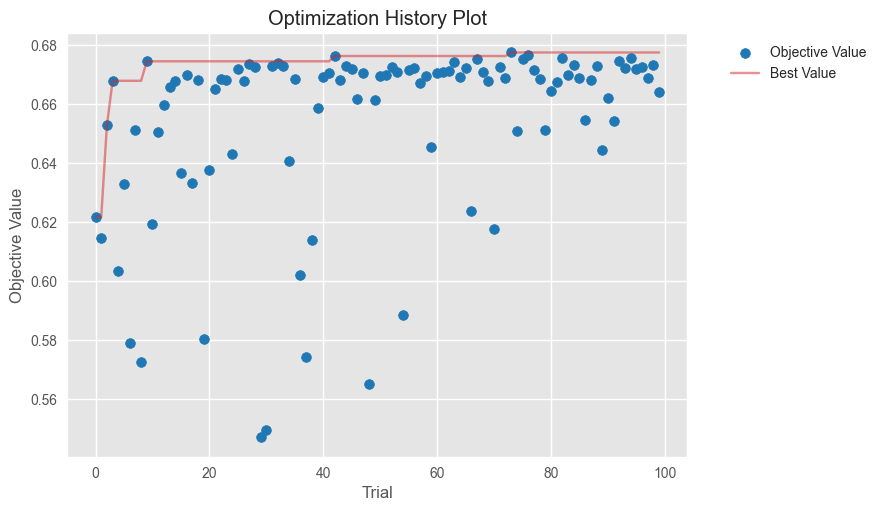

In [211]:
plot_optimization_history(study_7);

In [212]:
study_7.best_params

{'max_depth': 4,
 'subsample': 0.876335534267455,
 'colsample_bytree': 0.883696173865355,
 'reg_alpha': 0.0013343227256418153,
 'reg_lambda': 1.1168060057563535e-06,
 'num_leaves': 8,
 'min_child_weight': 0.9053832802852111,
 'subsample_freq': 4,
 'min_child_samples': 37}

In [160]:
param_lgbm_optuna_opt_7 = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.883696173865355,
                            'max_depth': 4,
                            'min_child_samples': 37,
                            'min_child_weight': 0.9053832802852111,
                            'num_leaves': 8,
                            'reg_alpha': 0.0013343227256418153,
                            'reg_lambda': 1.1168060057563535e-06,
                            'subsample': 0.876335534267455,
                            'subsample_freq': 4,
                            'verbosity' : -1}

In [161]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_7 = LGBMClassifier(**param_lgbm_optuna_opt_7,
                                      force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F5,0.696274,0.176027,0.281011,0.625205,0.676479,0.771812,0.258654,0.709816,8.725227,9.288913,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015
lgbm_optuna_opt_F5,0.696274,0.176027,0.281011,0.625205,0.676479,0.771812,0.258654,0.709816,14.879633,15.741028,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015


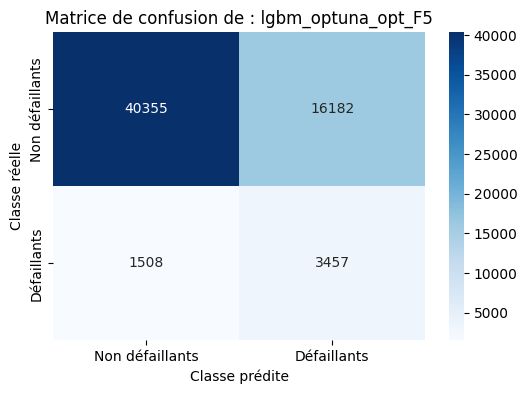

In [312]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_7,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_F5')

In [163]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_F5',
                                        1508, 16182, 3457, 40355, df_taux)

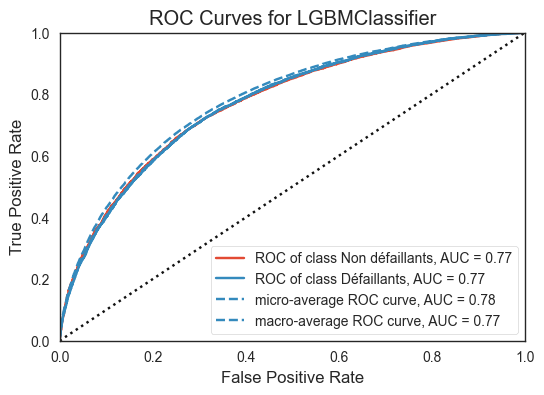

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [217]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_7_fit = lgbm_optuna_opt_7.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_7_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

### <span style='background:orange'>5.5. Prise en compte du déséquilibre des classes : Oversampling Methods</span>

# Resampling

Dans le cas de données très déséquilibrées comme ici, il existe des techniques de rééchantillonnage afin de rééquilibrer ces données.

Exemple : Un jeu de données de 1000 individus, avec 90% de target=0 et 10% de target=1. Imaginons que le modèle ne prédise que des 0. Il aura une accuracy de 90% au général, mais pour la classe 1 son accuracy sera de 0%. Le modèle ne sera donc pas si performant que ça.

Il existe deux techniques pour resampler les données :

- **L'under sampling** : On enlève des individus de la classe majoritaire.
- **L'over sampling** : On rajoute des individus dans la classe minoritaire.

<div style="text-align:center">
    <img src="images/logo_resampling.png" width="50%">
</div>

<div style="text-align:center">
    <img src="images/logo_undersampling.png" width="50%">
</div>
">
</div>


In [136]:
print("RAPPEL - DESEQUILIBRAGE DES DONNEES")

percent0 = (y_train.value_counts()[0] / y_train.shape) * 100
percent1 = (y_train.value_counts()[1] / y_train.shape) * 100

print("Nombre d'individus pour la classe 0 :", y_train.value_counts()[0], ". Soit", percent0, "% de la population.")
print("Nombre d'individus pour la classe 1 :", y_train.value_counts()[1], ". Soit", percent1, "% de la population.")

RAPPEL - DESEQUILIBRAGE DES DONNEES
Nombre d'individus pour la classe 0 : 226145 . Soit [91.92699335] % de la population.
Nombre d'individus pour la classe 1 : 19860 . Soit [8.07300665] % de la population.


Class 0: 226145
Class 1: 19860
Proportion: 11.39 : 1


([<matplotlib.patches.Wedge at 0x21093d9ef40>,
 [Text(-0.2760018676612081, -1.0648112363454498, 'Classe 0'),
  Text(0.30109300091849334, 1.1616122437362204, 'Classe 1')],
 [Text(-0.15054647326974988, -0.5808061289156998, '91.9%'),
  Text(0.1756375838691211, 0.6776071421794618, '8.1%')])

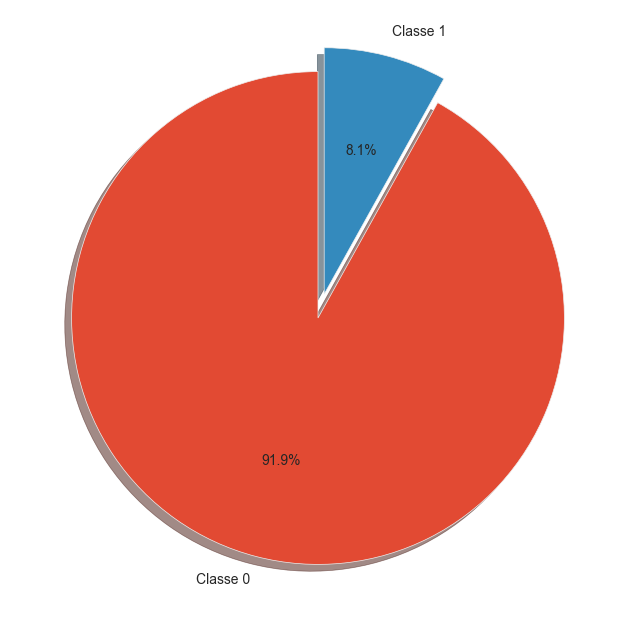

In [137]:
target_count = y_train.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

plt.figure(figsize=(8,8))

plt.pie(target_count, explode=[0, 0.1], labels=["Classe 0", "Classe 1"], autopct='%1.1f%%',
        shadow=True, startangle=90)

**Bilan** :
- La variable cible est fortement déséquilibrée 91.9% de non défaillants et 8.1% de défaillants ==> on tentera un rééquilibrage de la variable cible pour optimiser le modèle.

Plusieurs méthodes de réquilibrage sont à notre disposition :
- undersampling : consiste en un sous-échantillonnage de la classe majoritaire.
- oversampling : sur-échantillonnage de la classe minoritaire (ex : SMOTE, ADASYN).
- une combinaison d'oversampling suivi d'undersampling (possible avec SMOTE).
- hyperparamètre du modèle Ligthgbm : class_weight='balanced'.

#### <span style='background:Moccasin'>5.5.1. Réechantillonnage- oversampling : SMOTE</span>

**SMOTE - paramètres par défaut**

In [164]:
# Application de l'oversampling via SMOTE avec les paramètres par défaut
sm = SMOTE(random_state=2)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
X_valid_smote, y_valid_smote = sm.fit_resample(X_valid, y_valid)
print('Original dataset shape %s' % Counter(y_train))
print('Resampled dataset shape %s' % Counter(y_train_smote))

Original dataset shape Counter({0: 226145, 1: 19860})
Resampled dataset shape Counter({0: 226145, 1: 226145})


**Vérification graphique**

Class 0: 226145
Class 1: 226145
Proportion: 1.0 : 1


([<matplotlib.patches.Wedge at 0x2109340bbe0>,
 [Text(-1.1, 1.3471114790620887e-16, 'Classe 0'),
  Text(1.2000000000000002, -2.939152317953648e-16, 'Classe 1')],
 [Text(-0.6, 7.347880794884119e-17, '50.0%'),
  Text(0.7, -1.7145055188062944e-16, '50.0%')])

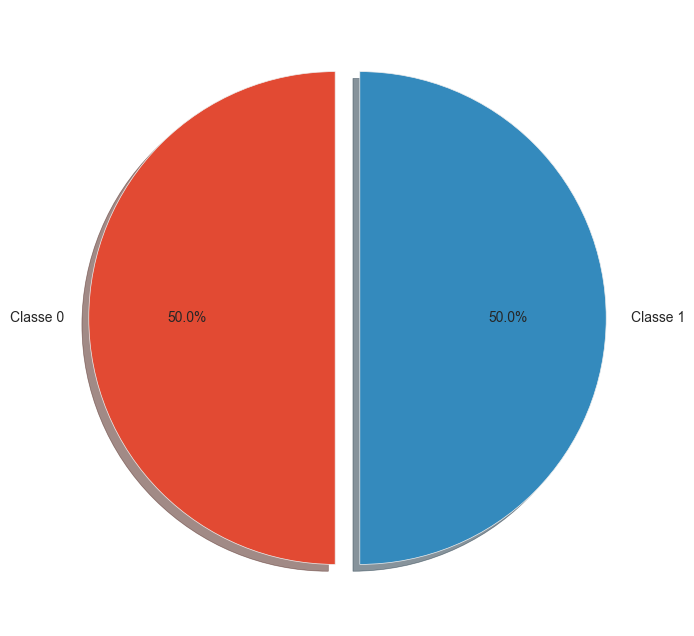

In [143]:
target_count = y_train_smote.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

plt.figure(figsize=(8,8))

plt.pie(target_count, explode=[0, 0.1], labels=["Classe 0", "Classe 1"], autopct='%1.1f%%',
        shadow=True, startangle=90)

#### <span style='background:mistyrose'>**Modèle LightGBM - hyperparamètres de base**</span>

In [165]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_smote_base = LGBMClassifier(random_state=seed, verbose=0,
                                 force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_hyperparam_base,0.913119,0.998472,0.953890,0.916131,0.913892,0.979702,0.985369,0.932846,48.025563,49.972545,0.982394,0.005868,0.970418,0.088400,0.914583,0.028314,0.911020,0.263050,0.998089,0.000647,0.997765,0.000800


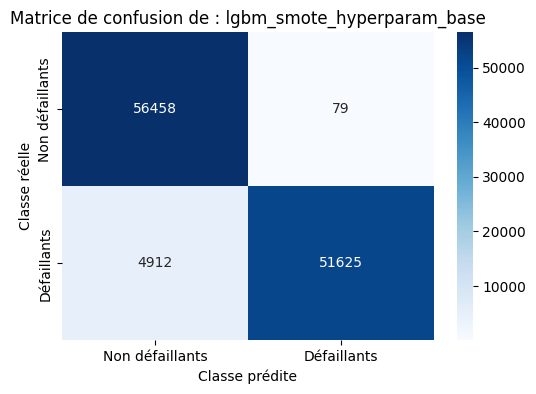

In [166]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base,
                                        X_train_smote, X_valid_smote,
                                        y_train_smote, y_valid_smote,
                                        df_resultats,
                                        'lgbm_smote_hyperparam_base')

In [167]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_hyperparam_base',
                                        4912, 79, 51625, 56458, df_taux)

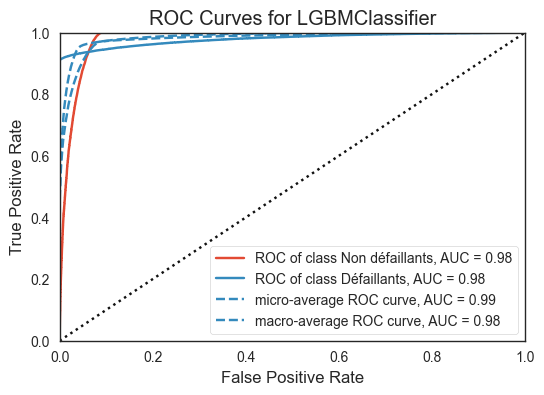

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [147]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_fit = lgbm_smote_base.fit(X_train_smote, y_train_smote)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote, y_train_smote)        
vis_rocauc.score(X_valid_smote, y_valid_smote)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_hyperparam_base_train,0.038268,0.552326,0.071577,0.039689,0.038624,0.777889,0.265661,0.780116,22.696625,23.773072,0.830767,0.000523,0.779387,0.003824,0.051281,0.001900,0.033837,0.004014,0.743325,0.007112,0.533626,0.036840


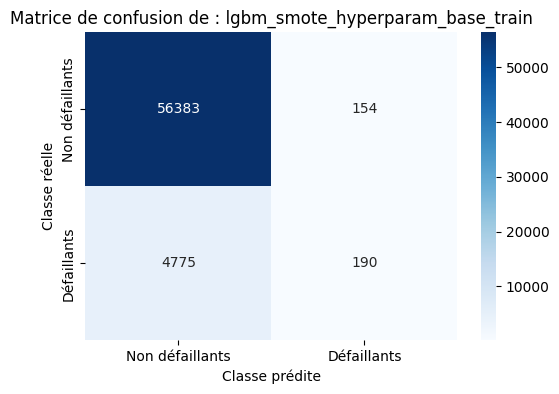

In [169]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base,
                                        X_train, X_valid,
                                        y_train, y_valid,
                                        df_resultats,
                                        'lgbm_smote_hyperparam_base_train')

In [170]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_hyperparam_base_train',
                                        4775, 154, 190, 56383, df_taux)

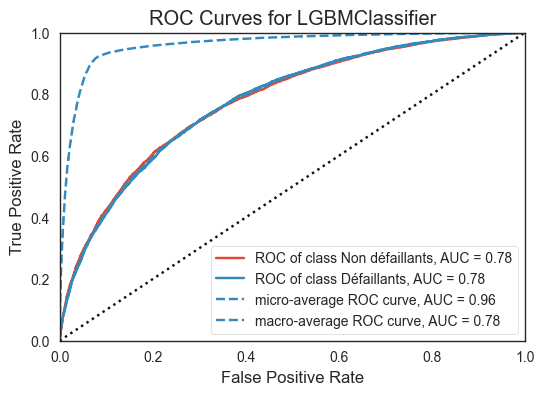

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [148]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_fit = lgbm_smote_base.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:mistyrose'>**Modèle LightGBM - hyperparamètres de base + class_weight='balanced'**</span>

In [171]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_smote_base_bal = LGBMClassifier(class_weight='balanced',
                                     random_state=seed, verbose=0,
                                     force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_base_bal,0.913119,0.998472,0.953890,0.916131,0.913892,0.979702,0.985369,0.932846,42.488014,44.686910,0.982394,0.005868,0.970418,0.088400,0.914583,0.028314,0.911020,0.263050,0.998089,0.000647,0.997765,0.000800


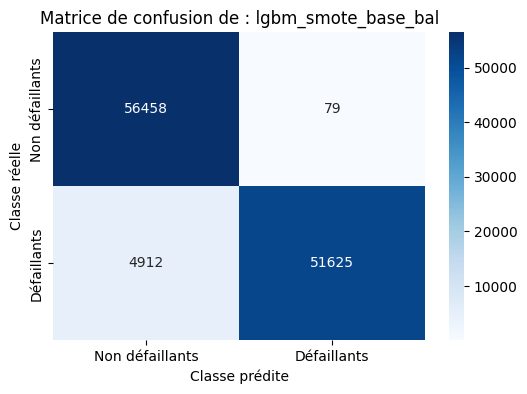

In [172]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base_bal,
                                        X_train_smote, X_valid_smote,
                                        y_train_smote, y_valid_smote,
                                        df_resultats,
                                        'lgbm_smote_base_bal')

In [174]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_base_bal',
                                        4912, 79, 51625, 56458, df_taux)

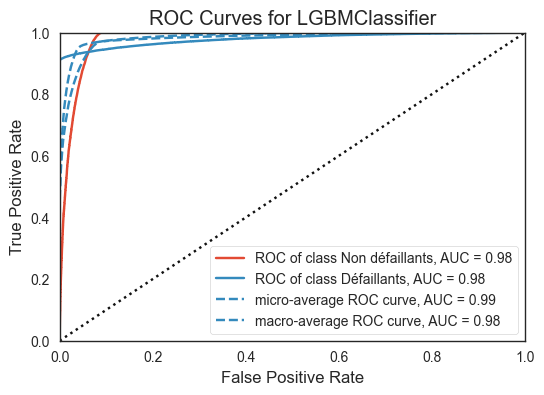

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [222]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_bal_fit = lgbm_smote_base_bal.fit(X_train_smote, y_train_smote)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_bal_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote, y_train_smote)        
vis_rocauc.score(X_valid_smote, y_valid_smote)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_base_bal_train,0.683585,0.182748,0.288397,0.618401,0.665526,0.778772,0.267466,0.720680,21.771897,22.764394,0.828682,0.000487,0.780507,0.004490,0.760731,0.001381,0.689023,0.007811,0.201630,0.000542,0.182999,0.001905


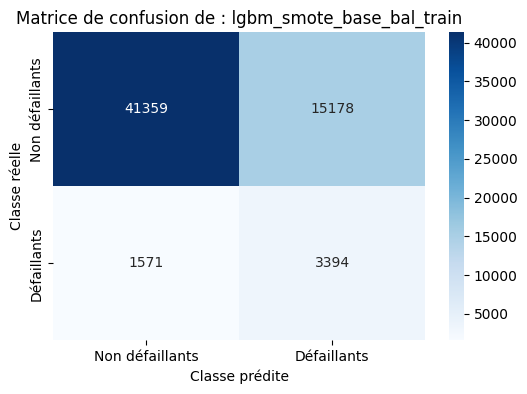

In [175]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base_bal,
                                        X_train, X_valid,
                                        y_train, y_valid,
                                        df_resultats,
                                        'lgbm_smote_base_bal_train')

In [176]:
## Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_base_bal_train',
                                        1571, 15178, 3394, 41359, df_taux)

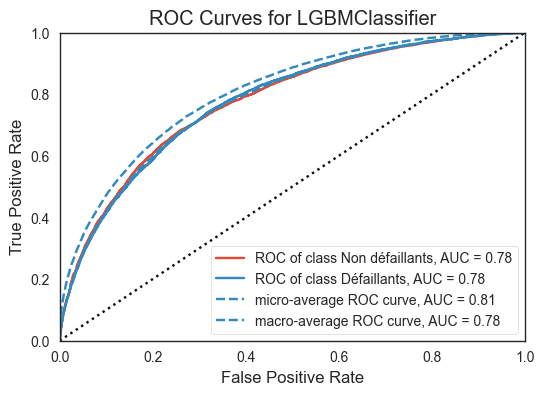

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [225]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_bal_fit = lgbm_smote_base_bal.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_bal_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:mistyrose'>**Optimisation des hyperparamètres - optuna - score ROC_AUC**</span>

In [226]:
# Modèle et hyperparamètres à étudier
def create_model_8(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'auc',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [227]:
# Objective fonction
def objective_8(trial):
    model = create_model_8(trial)
    model.fit(X_train_smote, y_train_smote)
    y_proba_smote = model.predict_proba(X_valid_smote)[:,1]
    score = roc_auc_score(y_valid_smote, y_proba_smote)
    return score

In [228]:
# Recherche des paramètres
study_8 = optuna.create_study(direction='maximize')
study_8.optimize(objective_8, n_trials=100)

[I 2024-05-25 16:11:05,896] A new study created in memory with name: no-name-72506d64-cf68-4134-a8f8-7e41d71a6a0b
[I 2024-05-25 16:11:39,495] Trial 0 finished with value: 0.9776648000776145 and parameters: {'max_depth': 4, 'subsample': 0.3465191622178331, 'colsample_bytree': 0.3917462748386703, 'reg_alpha': 0.6433490285453047, 'reg_lambda': 0.0102130504199828, 'num_leaves': 107, 'min_child_weight': 0.6402211531100397, 'subsample_freq': 6, 'min_child_samples': 63}. Best is trial 0 with value: 0.9776648000776145.
[I 2024-05-25 16:12:07,797] Trial 1 finished with value: 0.9784158214423337 and parameters: {'max_depth': 5, 'subsample': 0.8008919284624361, 'colsample_bytree': 0.6936362181791336, 'reg_alpha': 0.06949317908587731, 'reg_lambda': 2.0510501333905604e-05, 'num_leaves': 21, 'min_child_weight': 0.6631839800625908, 'subsample_freq': 1, 'min_child_samples': 81}. Best is trial 1 with value: 0.9784158214423337.
[I 2024-05-25 16:12:39,018] Trial 2 finished with value: 0.9762634543011662 

In [229]:
print(f"\tBest value : {study_8.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_8.trials)}")
print(f"\tBest params:")

for key, value in study_8.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.98002
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 11
		subsample: 0.9695256414207398
		colsample_bytree: 0.6093261669394381
		reg_alpha: 6.305910591362569e-08
		reg_lambda: 0.0008214980395821019
		num_leaves: 118
		min_child_weight: 0.7448225058677599
		subsample_freq: 5
		min_child_samples: 85


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


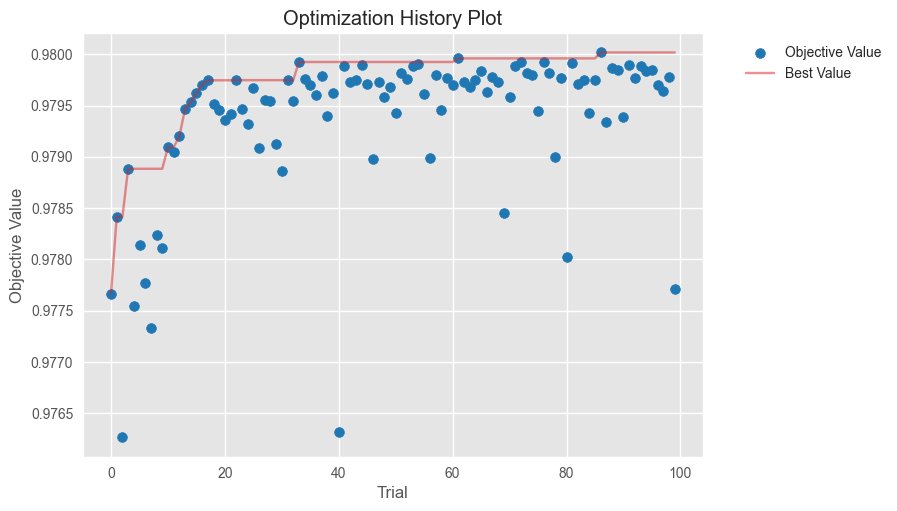

In [230]:
plot_optimization_history(study_8);

In [231]:
study_8.best_params

{'max_depth': 11,
 'subsample': 0.9695256414207398,
 'colsample_bytree': 0.6093261669394381,
 'reg_alpha': 6.305910591362569e-08,
 'reg_lambda': 0.0008214980395821019,
 'num_leaves': 118,
 'min_child_weight': 0.7448225058677599,
 'subsample_freq': 5,
 'min_child_samples': 85}

In [177]:
param_lgbm_optuna_opt_8 = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.6093261669394381,
                            'max_depth': 11,
                            'min_child_samples': 85,
                            'min_child_weight': 0.7448225058677599,
                            'num_leaves': 118,
                            'reg_alpha': 6.305910591362569e-08,
                            'reg_lambda': 0.0008214980395821019,
                            'subsample': 0.9695256414207398,
                            'subsample_freq': 5,
                            'verbosity' : -1}

In [178]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_8 = LGBMClassifier(**param_lgbm_optuna_opt_8,
                                         force_col_wise=True)

In [2]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_8,
                                        X_train_smote, X_valid_smote,
                                        y_train_smote, y_valid_smote, df_resultats,
                                        'lgbm_optuna_opt_8')

In [180]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_8',
                                        4829, 163, 51708, 56374, df_taux)

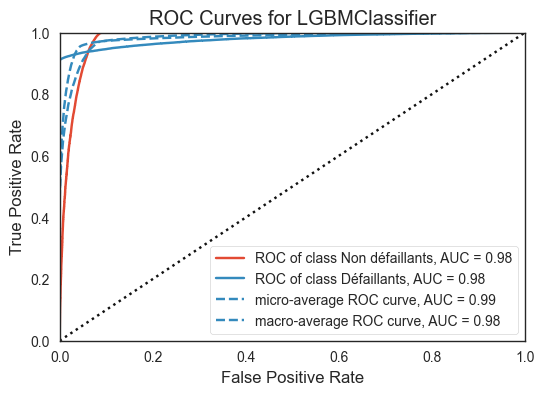

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [236]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_8_fit = lgbm_optuna_opt_8.fit(X_train_smote, y_train_smote)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_8_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote, y_train_smote)        
vis_rocauc.score(X_valid_smote, y_valid_smote)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_8_train,0.620544,0.200455,0.303024,0.574257,0.607930,0.778239,0.266817,0.745933,18.528952,19.451274,0.910519,0.000461,0.777167,0.004327,0.866527,0.001667,0.620544,0.010910,0.277118,0.000948,0.201226,0.002583


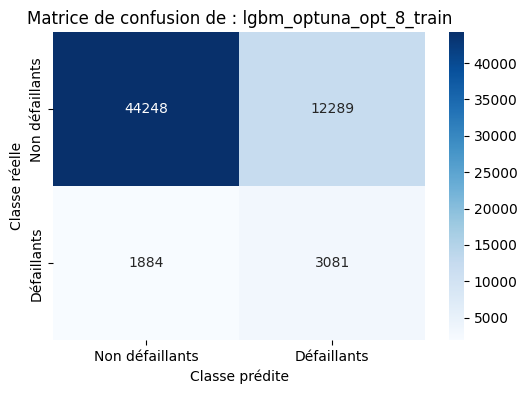

In [181]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_8,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_8_train')

In [182]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_8_train',
                                        1884, 12289, 3081, 44248, df_taux)

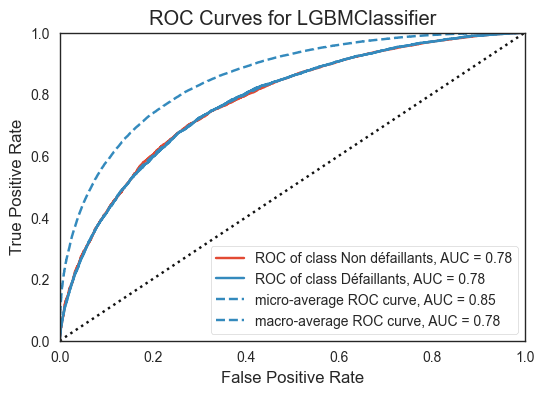

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [239]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_8_fit = lgbm_optuna_opt_8.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_8_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:mistyrose'>**Optimisation des hyperparamètres - optuna - score F10**</span>

In [240]:
# Modèle et hyperparamètres à étudier
def create_model_9(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'f10_score',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [241]:
# Objective fonction
def objective_9(trial):
    model = create_model_9(trial)
    model.fit(X_train_smote, y_train_smote)
    y_pred_smote = model.predict(X_valid_smote)
    score = fbeta_score(y_valid_smote, y_pred_smote, beta = 10)
    return score

In [242]:
# Recherche des paramètres
study_9 = optuna.create_study(direction='maximize')
study_9.optimize(objective_9, n_trials=100)

[I 2024-05-25 18:06:17,766] A new study created in memory with name: no-name-adc663ae-b86b-4873-b23c-ce928fa9c439
[I 2024-05-25 18:06:45,798] Trial 0 finished with value: 0.9142745820705785 and parameters: {'max_depth': 8, 'subsample': 0.8013029700271274, 'colsample_bytree': 0.7119987533997002, 'reg_alpha': 0.029604675027762564, 'reg_lambda': 0.00020027343779212053, 'num_leaves': 53, 'min_child_weight': 0.89756976628686, 'subsample_freq': 5, 'min_child_samples': 53}. Best is trial 0 with value: 0.9142745820705785.
[I 2024-05-25 18:07:11,068] Trial 1 finished with value: 0.9132088223689966 and parameters: {'max_depth': 6, 'subsample': 0.9542305276297479, 'colsample_bytree': 0.9575135770131421, 'reg_alpha': 0.0004864837618441542, 'reg_lambda': 0.041116425570281084, 'num_leaves': 231, 'min_child_weight': 0.5831882339516228, 'subsample_freq': 3, 'min_child_samples': 80}. Best is trial 0 with value: 0.9142745820705785.
[I 2024-05-25 18:07:28,019] Trial 2 finished with value: 0.9097799251722

In [243]:
print(f"\tBest value : {study_9.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_9.trials)}")
print(f"\tBest params:")

for key, value in study_9.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.91750
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 10
		subsample: 0.1486366675270286
		colsample_bytree: 0.5850767866404238
		reg_alpha: 6.18931415045569e-08
		reg_lambda: 5.13100229101003e-08
		num_leaves: 202
		min_child_weight: 0.6889871731341567
		subsample_freq: 1
		min_child_samples: 15


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


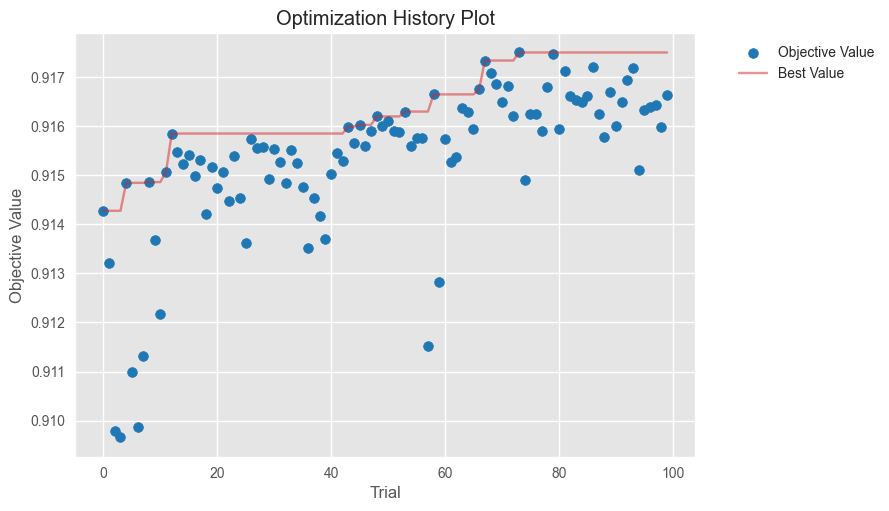

In [244]:
plot_optimization_history(study_9);

In [245]:
study_9.best_params

{'max_depth': 10,
 'subsample': 0.1486366675270286,
 'colsample_bytree': 0.5850767866404238,
 'reg_alpha': 6.18931415045569e-08,
 'reg_lambda': 5.13100229101003e-08,
 'num_leaves': 202,
 'min_child_weight': 0.6889871731341567,
 'subsample_freq': 1,
 'min_child_samples': 15}

In [183]:
param_lgbm_optuna_opt_9 = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.6298436780635843,
                            'max_depth': 10,
                            'min_child_samples': 15,
                            'min_child_weight': 0.6889871731341567,
                            'num_leaves': 202,
                            'reg_alpha': 6.18931415045569e-08,
                            'reg_lambda': 5.13100229101003e-08,
                            'subsample': 0.1486366675270286,
                            'subsample_freq': 1,
                            'verbosity' : -1}

In [184]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_9 = LGBMClassifier(**param_lgbm_optuna_opt_9,
                                         force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_9,0.916444,0.990821,0.952182,0.919098,0.917126,0.977599,0.984116,0.933767,25.706380,27.350033,0.987993,0.004006,0.973434,0.079505,0.924048,0.025177,0.911435,0.263188,0.994387,0.001888,0.990654,0.003205


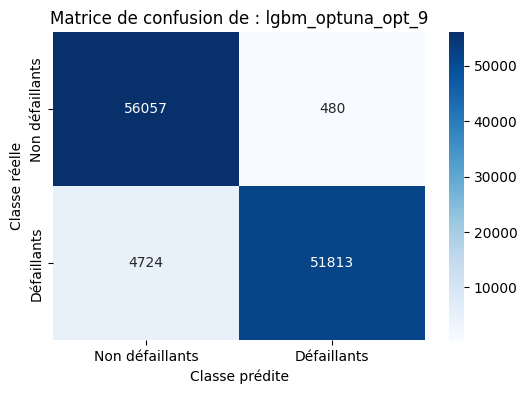

In [185]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_9,
                                        X_train_smote, X_valid_smote,
                                        y_train_smote, y_valid_smote, df_resultats,
                                        'lgbm_optuna_opt_9')

In [186]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_9',
                                        4724, 480, 51813, 56057, df_taux)

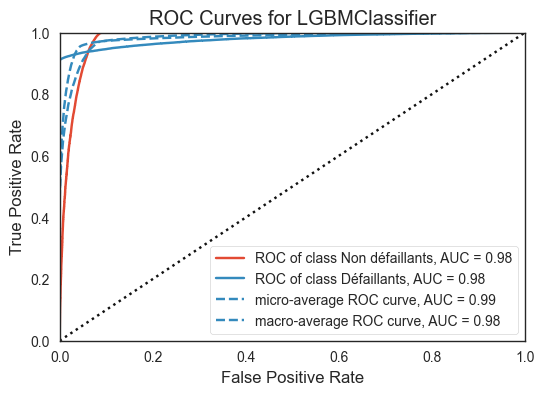

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [250]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_8_fit = lgbm_optuna_opt_8.fit(X_train_smote, y_train_smote)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_8_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote, y_train_smote)        
vis_rocauc.score(X_valid_smote, y_valid_smote)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_9_train,0.509567,0.187867,0.274523,0.478080,0.501072,0.729516,0.214063,0.739302,15.045297,15.873869,0.876641,0.001065,0.726959,0.005287,0.744456,0.004450,0.506747,0.010618,0.272136,0.002692,0.186850,0.002694


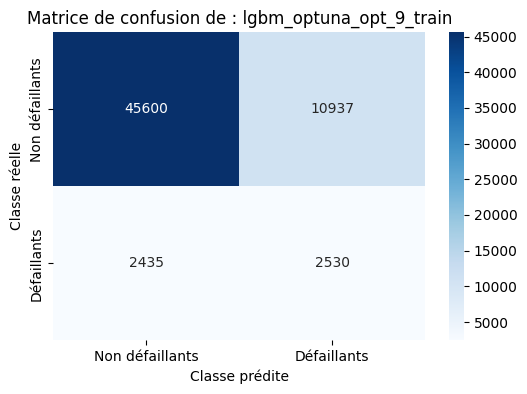

In [187]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_9,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_9_train')

In [188]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_9_train',
                                        2435, 10397, 2530, 45600, df_taux)

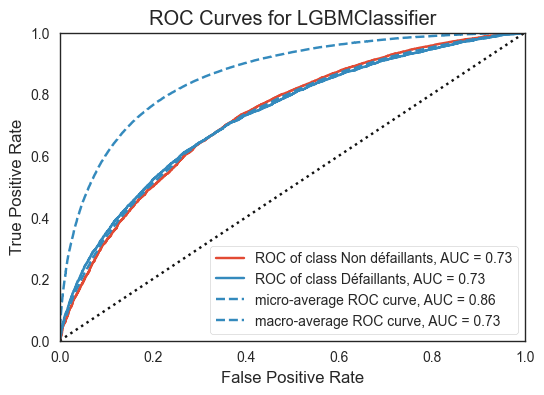

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [253]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_9_fit = lgbm_optuna_opt_9.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_9_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.5.2. Réechantillonnage - combinaison oversampling/undersampling : SMOTE</span>

In [189]:
# Application de l'oversampling via SMOTE avec les paramètres par défaut
sm_over = SMOTE(sampling_strategy=0.1, random_state=seed)
rnds_under = RandomUnderSampler(sampling_strategy=0.5, random_state=seed)

# Pipeline des 2 méthodes de réechantillonnage
pipeline = Pipeline(steps= [('o', sm_over), ('u', rnds_under)])

# Phase de réechantillonnage du dataset
X_train_smote_comb, y_train_smote_comb = pipeline.fit_resample(X_train, y_train)
X_valid_smote_comb, y_valid_smote_comb = pipeline.fit_resample(X_valid, y_valid)
print('Original dataset shape %s' % Counter(y_train))
print('Resampled dataset shape %s' % Counter(y_train_smote_comb))

Original dataset shape Counter({0: 226145, 1: 19860})
Resampled dataset shape Counter({0: 45228, 1: 22614})


**Vérification graphique**

Class 0: 45228
Class 1: 22614
Proportion: 2.0 : 1


([<matplotlib.patches.Wedge at 0x2109417cca0>,
 [Text(-0.95262790983307, -0.5500000594609754, 'Classe 0'),
  Text(1.0392303909145566, 0.6000001621662928, 'Classe 1')],
 [Text(-0.5196152235453109, -0.3000000324332593, '66.7%'),
  Text(0.6062177280334914, 0.35000009459700415, '33.3%')])

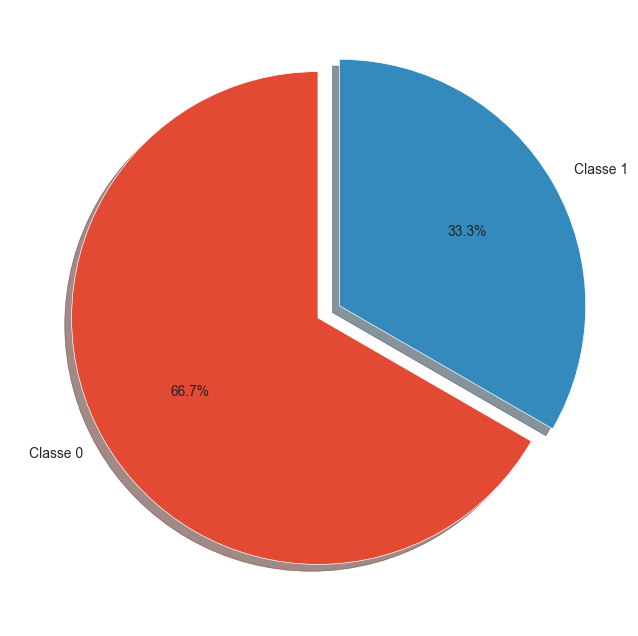

In [259]:
target_count = y_train_smote_comb.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

plt.figure(figsize=(8,8))

plt.pie(target_count, explode=[0, 0.1], labels=["Classe 0", "Classe 1"], autopct='%1.1f%%',
        shadow=True, startangle=90)

#### <span style='background:mistyrose'>**Modèle LightGBM - hyperparamètres de base**</span>

In [190]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_smote_base_2 = LGBMClassifier(random_state=seed, verbose=0,
                                   force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_combi_base,0.485583,0.715403,0.578504,0.491658,0.487132,0.803608,0.708258,0.642270,8.746294,9.123389,0.856025,0.005816,0.804730,0.062575,0.547748,0.005817,0.486584,0.164397,0.776250,0.012266,0.693791,0.039292


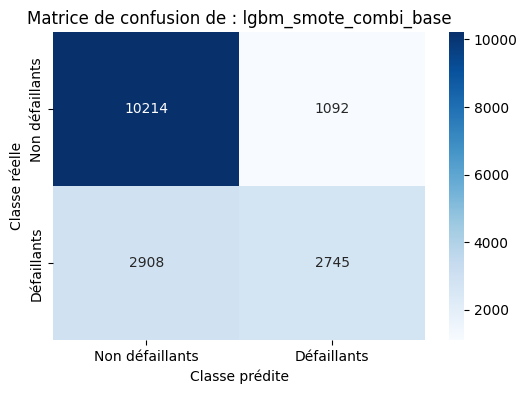

In [191]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base_2,
                                        X_train_smote_comb,
                                        X_valid_smote_comb,
                                        y_train_smote_comb,
                                        y_valid_smote_comb,
                                        df_resultats,
                                        'lgbm_smote_combi_base')

In [192]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_combi_base',
                                        2908, 1092, 2745, 10214, df_taux)

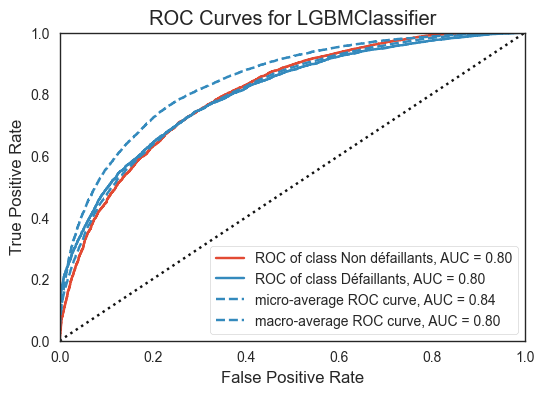

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [263]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_2_fit = lgbm_smote_base_2.fit(X_train_smote_comb, y_train_smote_comb)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_2_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote_comb, y_train_smote_comb)        
vis_rocauc.score(X_valid_smote_comb, y_valid_smote_comb)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_combi_base_train,0.038268,0.552326,0.071577,0.039689,0.038624,0.777889,0.265661,0.780116,19.972370,20.488969,0.830767,0.000523,0.779387,0.003824,0.051281,0.001900,0.033837,0.004014,0.743325,0.007112,0.533626,0.036840


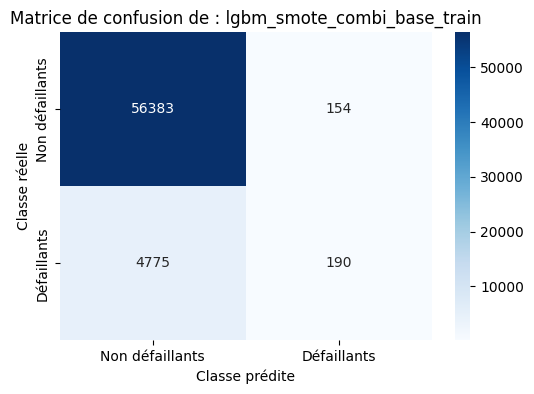

In [193]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_base_2,
                                        X_train, X_valid,
                                        y_train, y_valid,
                                        df_resultats,
                                        'lgbm_smote_combi_base_train')

In [194]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_combi_base_train',
                                        4775, 154, 190, 56383, df_taux)

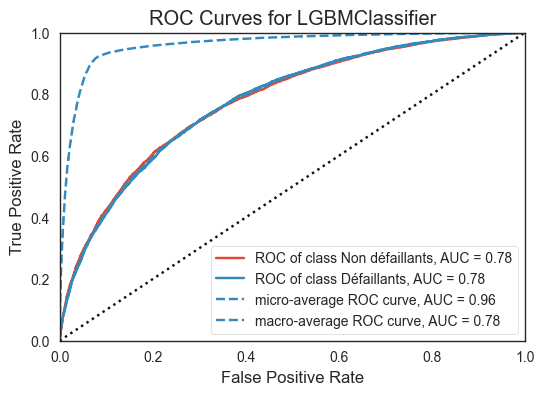

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [266]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_base_2_fit = lgbm_smote_base_2.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_base_2_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:mistyrose'>**Optimisation des hyperparamètres - optuna - score ROC_AUC**</span>

In [267]:
# Modèle et hyperparamètres à étudier
def create_model_10(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'auc',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [271]:
# Objective fonction
def objective_10(trial):
    model = create_model_10(trial)
    model.fit(X_train_smote_comb, y_train_smote_comb)
    y_proba_smote_comb = model.predict_proba(X_valid_smote_comb)[:,1]
    score = roc_auc_score(y_valid_smote_comb, y_proba_smote_comb)
    return score

In [272]:
# Recherche des paramètres
study_10 = optuna.create_study(direction='maximize')
study_10.optimize(objective_10, n_trials=100)

[I 2024-05-25 19:36:30,740] A new study created in memory with name: no-name-26970eea-36aa-4e14-95cc-20b1db2db98b
[I 2024-05-25 19:36:38,074] Trial 0 finished with value: 0.7992516462034267 and parameters: {'max_depth': 4, 'subsample': 0.9175907704275319, 'colsample_bytree': 0.48270223811393154, 'reg_alpha': 0.051244914810067904, 'reg_lambda': 2.2067474217456255, 'num_leaves': 49, 'min_child_weight': 0.8830366737369592, 'subsample_freq': 4, 'min_child_samples': 89}. Best is trial 0 with value: 0.7992516462034267.
[I 2024-05-25 19:36:45,748] Trial 1 finished with value: 0.7995665126203636 and parameters: {'max_depth': 7, 'subsample': 0.43800270318249, 'colsample_bytree': 0.33636715005220796, 'reg_alpha': 2.612243718681117e-05, 'reg_lambda': 1.010322584556199e-07, 'num_leaves': 127, 'min_child_weight': 0.4951978418068178, 'subsample_freq': 1, 'min_child_samples': 54}. Best is trial 1 with value: 0.7995665126203636.
[I 2024-05-25 19:36:51,072] Trial 2 finished with value: 0.79522772724557

In [273]:
print(f"\tBest value : {study_10.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_10.trials)}")
print(f"\tBest params:")

for key, value in study_10.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.80641
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 10
		subsample: 0.888438362320894
		colsample_bytree: 0.4694450691762273
		reg_alpha: 3.1656952468136224
		reg_lambda: 0.0021054634570407283
		num_leaves: 32
		min_child_weight: 0.5671841063040354
		subsample_freq: 3
		min_child_samples: 71


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


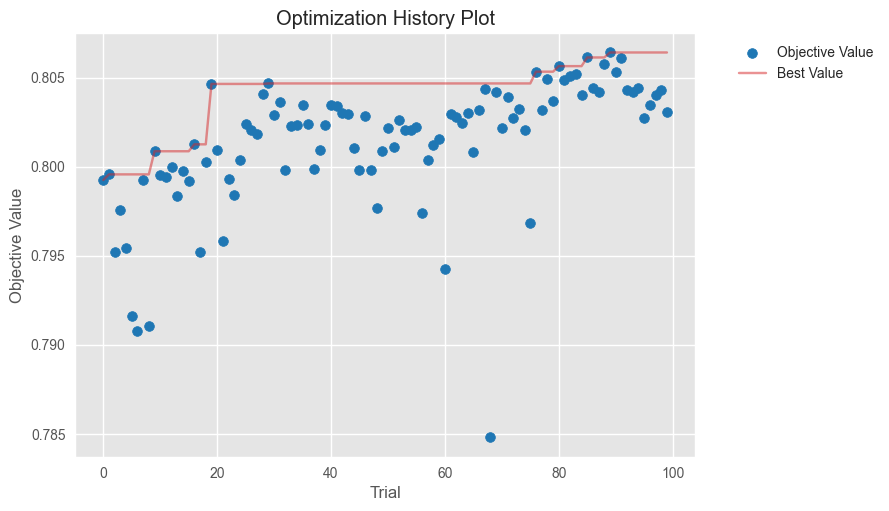

In [274]:
plot_optimization_history(study_10);

In [275]:
study_10.best_params

{'max_depth': 10,
 'subsample': 0.888438362320894,
 'colsample_bytree': 0.4694450691762273,
 'reg_alpha': 3.1656952468136224,
 'reg_lambda': 0.0021054634570407283,
 'num_leaves': 32,
 'min_child_weight': 0.5671841063040354,
 'subsample_freq': 3,
 'min_child_samples': 71}

In [195]:
param_lgbm_optuna_opt_10 = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.4694450691762273,
                            'max_depth': 10,
                            'min_child_samples': 71,
                            'min_child_weight': 0.5671841063040354,
                            'num_leaves': 32,
                            'reg_alpha': 3.1656952468136224,
                            'reg_lambda': 0.0021054634570407283,
                            'subsample':  0.888438362320894,
                            'subsample_freq': 3,
                            'verbosity' : -1}

In [196]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_opt_10 = LGBMClassifier(**param_lgbm_optuna_opt_10,
                                         force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_10,0.912942,0.998279,0.953705,0.915953,0.913715,0.979658,0.985339,0.932669,27.918423,29.628746,0.981830,0.006055,0.971228,0.085780,0.914018,0.028373,0.910772,0.263041,0.998016,0.000665,0.997765,0.000837


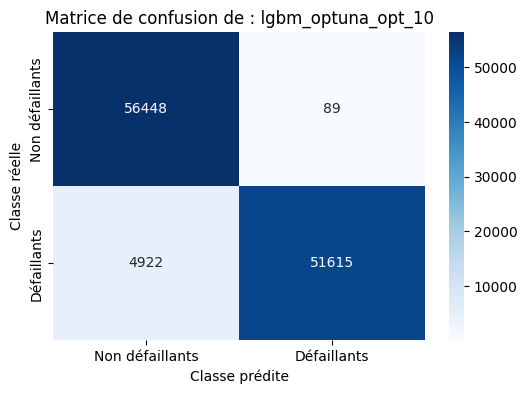

In [197]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_10,
                                        X_train_smote, X_valid_smote,
                                        y_train_smote, y_valid_smote, df_resultats,
                                        'lgbm_optuna_opt_10')

In [198]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_10',
                                        4922, 89, 51615, 56448, df_taux)

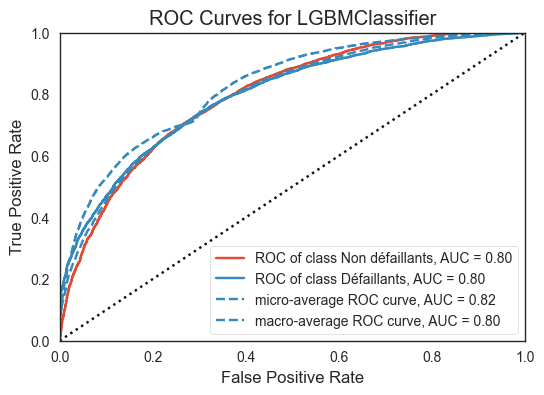

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [280]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_10_fit = lgbm_optuna_opt_10.fit(X_train_smote, y_train_smote)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_10_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_smote, y_train_smote)        
vis_rocauc.score(X_valid_smote, y_valid_smote)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_10_train,0.689023,0.184819,0.291459,0.623592,0.670902,0.780011,0.268447,0.723129,14.279655,15.250735,0.824294,0.000630,0.780704,0.004586,0.756831,0.001457,0.692195,0.009870,0.199675,0.000560,0.182874,0.002529


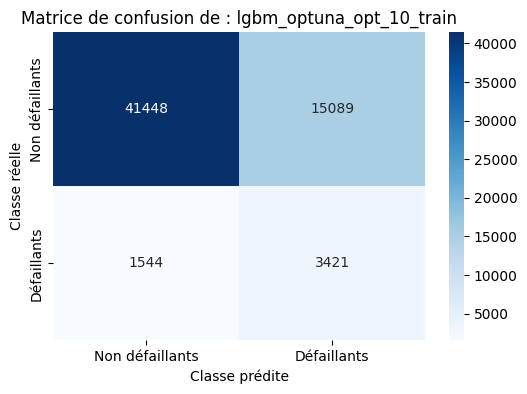

In [199]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_opt_10,
                                        X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_optuna_opt_10_train')

In [200]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_opt_10_train',
                                        1544, 15089, 3421, 41448, df_taux)

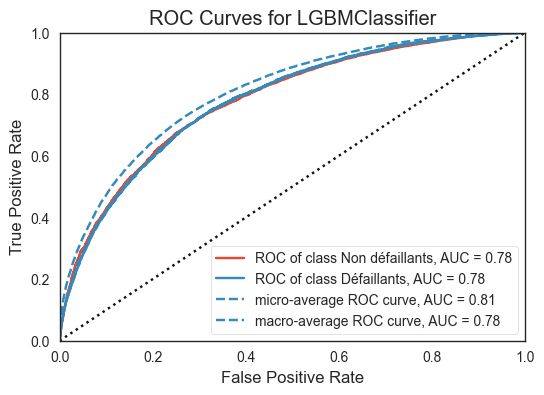

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [283]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_optuna_opt_10_fit = lgbm_optuna_opt_10.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_optuna_opt_10_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:Moccasin'>5.5.3. Réechantillonnage - LigthGbm - ADASYN</span>

In [201]:
# Application de l'oversampling via ADASYN avec les paramètres par défaut
over_adasyn = ADASYN(random_state=2)
X_train_adasyn, y_train_adasyn = over_adasyn.fit_resample(X_train, y_train)
X_valid_adasyn, y_valid_adasyn = over_adasyn.fit_resample(X_valid, y_valid)
print('Original dataset shape %s' % Counter(y_train))
print('Resampled dataset shape %s' % Counter(y_train_adasyn))

Original dataset shape Counter({0: 226145, 1: 19860})
Resampled dataset shape Counter({1: 231283, 0: 226145})


**Vérification graphique**

Class 0: 226145
Class 1: 231283
Proportion: 0.98 : 1


([<matplotlib.patches.Wedge at 0x210969ff7c0>,
 [Text(-1.0998287879014295, -0.019407145675565087, 'Classe 0'),
  Text(1.199813223165196, 0.021171431646071385, 'Classe 1')],
 [Text(-0.5999066115825978, -0.0105857158230355, '50.6%'),
  Text(0.6998910468463642, 0.012350001793541641, '49.4%')])

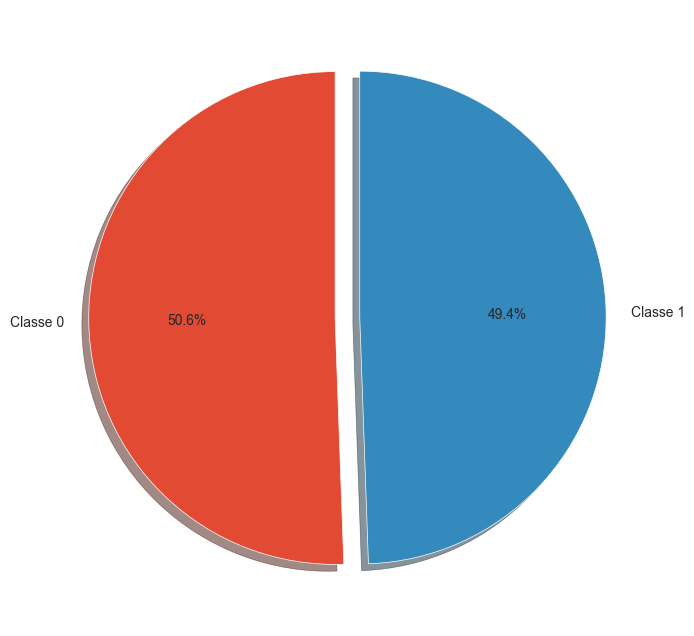

In [285]:
target_count = y_train_adasyn.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

plt.figure(figsize=(8,8))

plt.pie(target_count, explode=[0, 0.1], labels=["Classe 0", "Classe 1"], autopct='%1.1f%%',
        shadow=True, startangle=90)

#### <span style='background:mistyrose'>**Modèle LightGBM - hyperparamètres de base**</span>

In [202]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_smote_adasyn = LGBMClassifier(random_state=seed, verbose=0,
                                   force_col_wise=True) 

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_adasyn,0.914729,0.998477,0.954770,0.917690,0.915489,0.979945,0.985713,0.933873,42.376057,44.473628,0.982770,0.005743,0.970761,0.087345,0.916517,0.027711,0.912997,0.257333,0.998117,0.000635,0.997776,0.000804


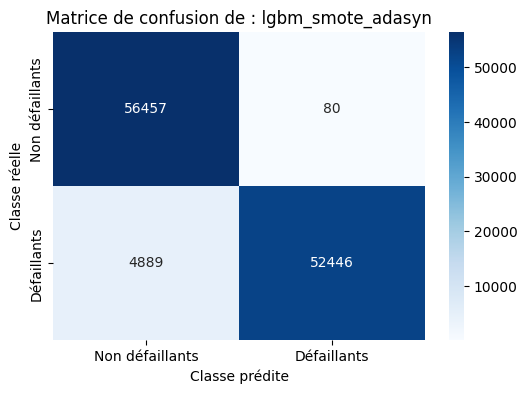

In [203]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_adasyn,
                                        X_train_adasyn, X_valid_adasyn,
                                        y_train_adasyn, y_valid_adasyn,
                                        df_resultats,
                                        'lgbm_smote_adasyn')

In [204]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_adasyn',
                                        4889, 80, 52446, 56457, df_taux)

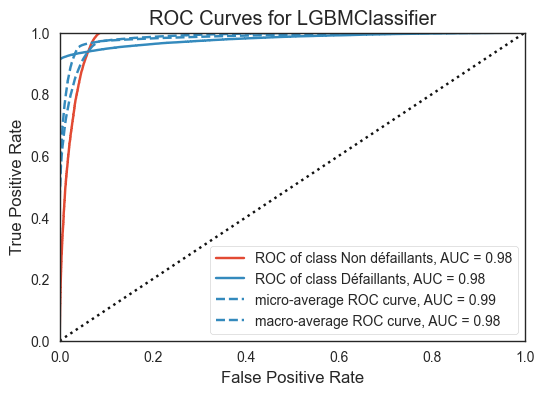

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [290]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_adasyn_fit = lgbm_smote_adasyn.fit(X_train_adasyn, y_train_adasyn)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_adasyn_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_adasyn, y_train_adasyn)        
vis_rocauc.score(X_valid_adasyn, y_valid_adasyn)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_smote_adasyn_train,0.038268,0.552326,0.071577,0.039689,0.038624,0.777889,0.265661,0.780116,21.169724,22.030200,0.830767,0.000523,0.779387,0.003824,0.051281,0.001900,0.033837,0.004014,0.743325,0.007112,0.533626,0.036840


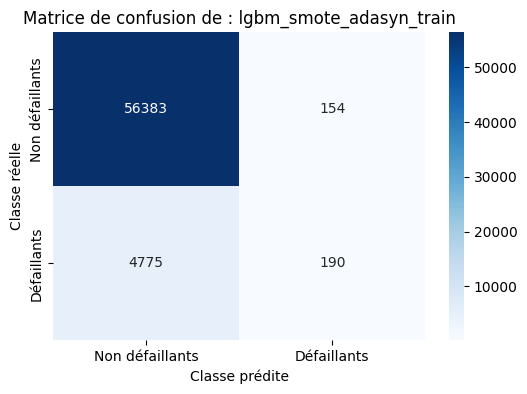

In [205]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_smote_adasyn,
                                        X_train, X_valid,
                                        y_train, y_valid,
                                        df_resultats,
                                        'lgbm_smote_adasyn_train')

In [214]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_smote_adasyn_train',
                                        4775, 154, 190, 56383, df_taux)

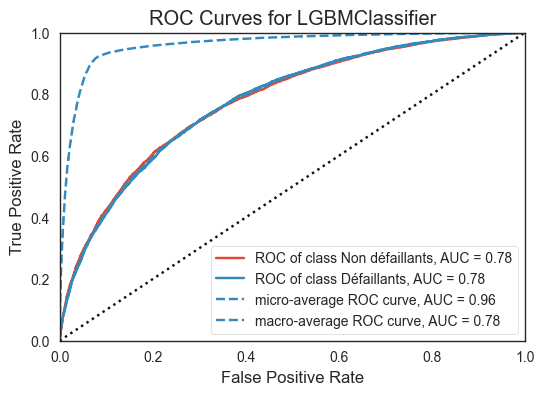

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [293]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_adasyn_fit = lgbm_smote_adasyn.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_adasyn_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

#### <span style='background:mistyrose'>**Optimisation des hyperparamètres - optuna - score ROC_AUC**</span>

In [294]:
# Modèle et hyperparamètres à étudier
def create_model_adasyn(trial):
    max_depth = trial.suggest_int('max_depth', 3, 11)
    subsample = trial.suggest_uniform('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.1, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
    num_leaves = trial.suggest_int('num_leaves', 2, 256),
    min_child_weight = trial.suggest_uniform('min_child_weight', 0.4, 1.0),
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7),
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100),
            
    model = LGBMClassifier(
        objective = 'binary',
        metric = 'auc',
        max_depth=max_depth, 
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        num_leaves=num_leaves,
        min_child_weight=min_child_weight,
        subsample=subsample,
        subsample_freq=subsample_freq,
        min_child_samples=min_child_samples,
        random_state=seed,
        verbose=-1)
        
    return model

In [301]:
# Objective fonction
def objective_adasyn(trial):
    model = create_model_adasyn(trial)
    model.fit(X_train_adasyn, y_train_adasyn)
    y_proba_adasyn = model.predict_proba(X_valid_adasyn)[:,1]
    score = roc_auc_score(y_valid_adasyn, y_proba_adasyn)
    return score

In [302]:
# Recherche des paramètres
study_adasyn = optuna.create_study(direction='maximize')
study_adasyn.optimize(objective_adasyn, n_trials=100)

[I 2024-05-25 21:16:35,924] A new study created in memory with name: no-name-6509ae69-d718-4e87-ba2a-e6da1d5fef66
[I 2024-05-25 21:16:59,408] Trial 0 finished with value: 0.9789749288973784 and parameters: {'max_depth': 6, 'subsample': 0.17482583373197663, 'colsample_bytree': 0.9275956768731791, 'reg_alpha': 2.7394588785603032e-05, 'reg_lambda': 7.292452739486151e-06, 'num_leaves': 178, 'min_child_weight': 0.9812372089016623, 'subsample_freq': 6, 'min_child_samples': 53}. Best is trial 0 with value: 0.9789749288973784.
[I 2024-05-25 21:17:27,883] Trial 1 finished with value: 0.9793642730167733 and parameters: {'max_depth': 7, 'subsample': 0.388944060019477, 'colsample_bytree': 0.38047868965222553, 'reg_alpha': 4.111847907752033, 'reg_lambda': 5.480469941436677e-07, 'num_leaves': 73, 'min_child_weight': 0.6866188469924236, 'subsample_freq': 4, 'min_child_samples': 63}. Best is trial 1 with value: 0.9793642730167733.
[I 2024-05-25 21:18:10,352] Trial 2 finished with value: 0.980120652784

In [303]:
print(f"\tBest value : {study_adasyn.best_value:.5f}")
print(f"\tNombre d\'essai terminés : {len(study_adasyn.trials)}")
print(f"\tBest params:")

for key, value in study_adasyn.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.98032
	Nombre d'essai terminés : 100
	Best params:
		max_depth: 11
		subsample: 0.8478831400051621
		colsample_bytree: 0.4885403893604945
		reg_alpha: 2.184139057113799
		reg_lambda: 0.007560720606924504
		num_leaves: 78
		min_child_weight: 0.9185136677965932
		subsample_freq: 3
		min_child_samples: 52


plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


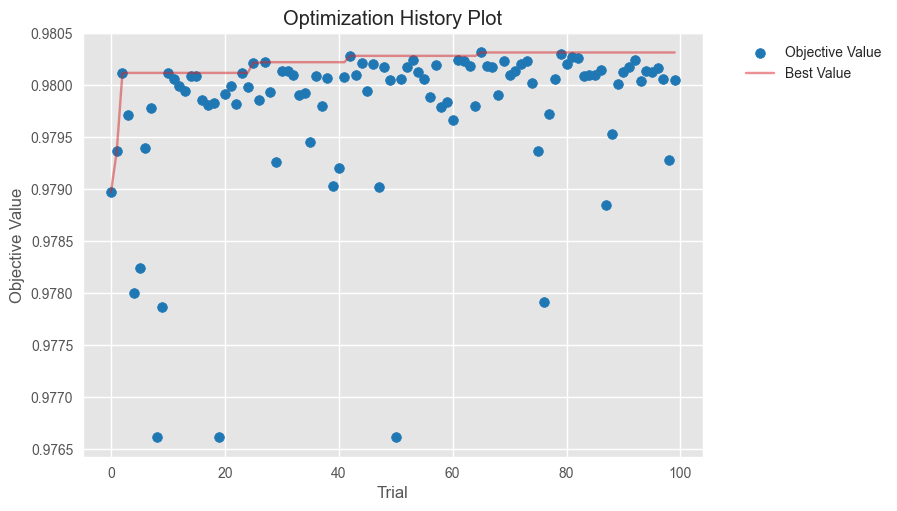

In [304]:
plot_optimization_history(study_adasyn);

In [305]:
study_adasyn.best_params

{'max_depth': 11,
 'subsample': 0.8478831400051621,
 'colsample_bytree': 0.4885403893604945,
 'reg_alpha': 2.184139057113799,
 'reg_lambda': 0.007560720606924504,
 'num_leaves': 78,
 'min_child_weight': 0.9185136677965932,
 'subsample_freq': 3,
 'min_child_samples': 52}

In [208]:
param_lgbm_optuna_opt_adasyn = {'objective' : 'binary',
                            'boosting_type' : 'gbdt',
                            'n_jobs' : -1,
                            'class_weight' : 'balanced', # Balanced        
                            'colsample_bytree': 0.4885403893604945,
                            'max_depth': 11,
                            'min_child_samples': 52,
                            'min_child_weight': 0.9185136677965932,
                            'num_leaves': 78,
                            'reg_alpha': 2.184139057113799,
                            'reg_lambda': 0.007560720606924504,
                            'subsample': 0.8478831400051621,
                            'subsample_freq': 3,
                            'verbosity' : -1}

In [209]:
# Initialisation du modèle avec les hyperparamètres précédemment trouvés
lgbm_optuna_adasyn = LGBMClassifier(**param_lgbm_optuna_opt_adasyn,
                                    force_col_wise=True)

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_adasyn,0.915322,0.997491,0.954642,0.918231,0.916069,0.980231,0.985876,0.934120,31.557039,33.226600,0.985671,0.004777,0.973117,0.080368,0.919117,0.026856,0.913244,0.257430,0.998093,0.000639,0.996934,0.001133


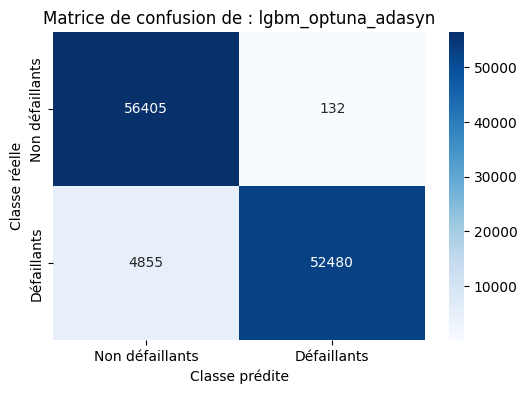

In [210]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_adasyn,
                                        X_train_adasyn, X_valid_adasyn,
                                        y_train_adasyn, y_valid_adasyn,
                                        df_resultats,
                                        'lgbm_optuna_adasyn')

In [217]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_adasyn',
                                        4855, 132, 52480, 56405, df_taux)

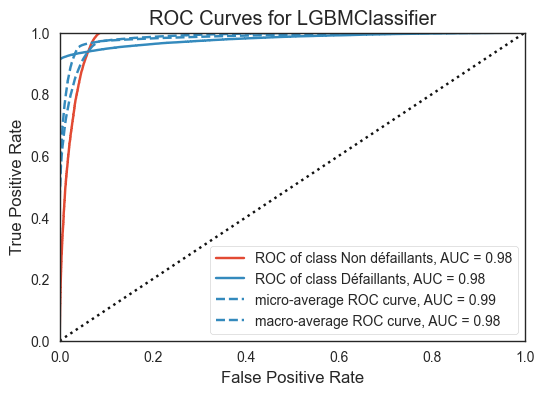

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [311]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_adasyn_fit = lgbm_smote_adasyn.fit(X_train_adasyn, y_train_adasyn)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_adasyn_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train_adasyn, y_train_adasyn)        
vis_rocauc.score(X_valid_adasyn, y_valid_adasyn)
vis_rocauc.show()                       

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_adasyn_train,0.652568,0.191795,0.296459,0.597371,0.637406,0.779953,0.267812,0.734522,19.773055,20.700946,0.875168,0.000443,0.779282,0.004038,0.814921,0.001434,0.655488,0.009630,0.238493,0.000770,0.193073,0.002581


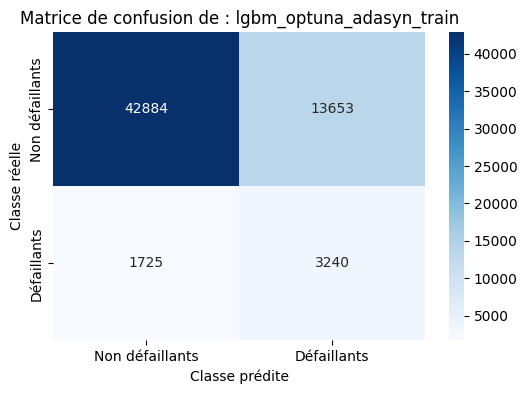

In [219]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = fonctions_data.process_classification(lgbm_optuna_adasyn,
                                        X_train, X_valid,
                                        y_train, y_valid,
                                        df_resultats,
                                        'lgbm_optuna_adasyn_train')

In [222]:
# Sauvegarde
df_taux = fonctions_data.sauvegarder_taux('lgbm_optuna_adasyn_train',
                                        1725, 13653, 3240, 42884, df_taux)

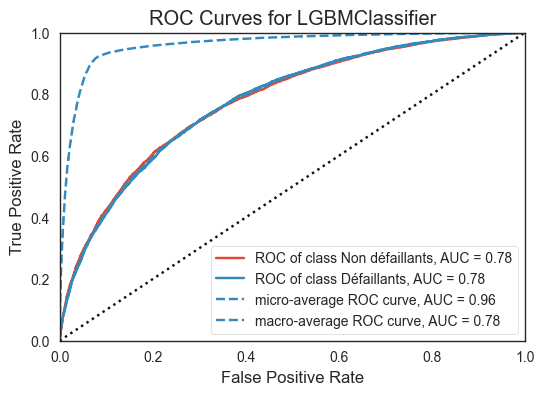

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [314]:
from yellowbrick.classifier import ROCAUC

#classes = ['Non défaillants', 'Défaillants']
lgbm_smote_adasyn_fit = lgbm_smote_adasyn.fit(X_train, y_train)

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

vis_rocauc = ROCAUC(lgbm_smote_adasyn_fit, classes=classes, random_state=101)

vis_rocauc.fit(X_train, y_train)        
vis_rocauc.score(X_valid, y_valid)
vis_rocauc.show()                       

### <span style='background:orange'>5.6. Conclusions: Modélisations</span>

In [230]:
df_taux_compbis = df_taux.sort_values(by='Modèle')

In [253]:
df_taux_compbis

,Modèle,FN,FP,TP,TN
6,lgbm_bayesian_opt_1,4732,156,233,56381
7,lgbm_bayesian_opt_1_bal,1562,15186,3403,41351
8,lgbm_bayesian_opt_2,4706,195,259,56342
9,lgbm_bayesian_opt_3,1841,12294,3124,44243
10,lgbm_bayesian_opt_4,1628,14616,3337,41921
12,lgbm_bayesian_opt_5,1633,14478,3332,42059
13,lgbm_bayesian_opt_6,1627,14570,3338,41967
14,lgbm_bayesian_opt_7,1639,14436,3326,42101
15,lgbm_bayesian_opt_8,1567,15419,3398,41118
11,lgbm_bayesian_opt_9,1591,14816,3374,41721


In [256]:
modeles = df_taux_compbis['Modèle'].to_list()
modeles

['lgbm_bayesian_opt_1',
 'lgbm_bayesian_opt_1_bal',
 'lgbm_bayesian_opt_2',
 'lgbm_bayesian_opt_3',
 'lgbm_bayesian_opt_4',
 'lgbm_bayesian_opt_5',
 'lgbm_bayesian_opt_6',
 'lgbm_bayesian_opt_7',
 'lgbm_bayesian_opt_8',
 'lgbm_bayesian_opt_9',
 'lgbm_baysearch_opt_1',
 'lgbm_baysearch_opt_2',
 'lgbm_baysearch_opt_3',
 'lgbm_baysearch_opt_4',
 'lgbm_hyperparam_base',
 'lgbm_hyperparam_base_bal',
 'lgbm_hyperparam_base_minmax',
 'lgbm_hyperparam_base_robust',
 'lgbm_hyperparam_base_std',
 'lgbm_hyperparam_base_std_bal',
 'lgbm_optuna_adasyn',
 'lgbm_optuna_adasyn_train',
 'lgbm_optuna_opt_1',
 'lgbm_optuna_opt_10',
 'lgbm_optuna_opt_10_train',
 'lgbm_optuna_opt_1_bis',
 'lgbm_optuna_opt_2',
 'lgbm_optuna_opt_3',
 'lgbm_optuna_opt_4',
 'lgbm_optuna_opt_8',
 'lgbm_optuna_opt_8_train',
 'lgbm_optuna_opt_9',
 'lgbm_optuna_opt_9_train',
 'lgbm_optuna_opt_F1',
 'lgbm_optuna_opt_F10',
 'lgbm_optuna_opt_F5',
 'lgbm_smote_adasyn',
 'lgbm_smote_adasyn_train',
 'lgbm_smote_base_bal',
 'lgbm_smote_b

In [257]:
len(modeles)

44

In [254]:
jeu_dataset = ['train', 'train', 'train', 'train', 'train', 'train',
               'train', 'train', 'train', 'train', 'train', 'train',
               'train', 'train', 'train', 'train', 'train', 'train',
               'train', 'train', 'augmente', 'train', 'train', 'train',
               'train', 'train', 'train', 'train', 'train', 'train',
               'train', 'train', 'train', 'train', 'train', 'train',
               'reduit', 'train', 'train', 'train', 'reduit', 'train',
               'augmente', 'train']

In [255]:
len(jeu_dataset)

44

In [258]:
df_taux_comp2 = pd.DataFrame({'Modèle' : modeles,
                              'Jeu_donnees' : jeu_dataset})

In [259]:
# Dataframe de sauvegarde des taux des différentes modélisations
df_taux_comp = df_taux_comp2.merge(df_taux_compbis, on='Modèle',
                                   how='right')

In [260]:
# Tri par Faux Négatifs décroissant (les clients prédits non défaillants
# qui sont défaillants ==> la banque perd le montant du prêt en totalité
# ou en partie) pour le train set
mask = df_taux_comp['Jeu_donnees'] == 'train'
df_taux_comp[mask].sort_values(by='FN').style \
    .highlight_min(subset=['FN', 'FP', 'TN', 'TP'], color='lightgreen',
                   axis=0)

,Modèle,Jeu_donnees,FN,FP,TP,TN
33,lgbm_optuna_opt_F1,train,1500,16369,3465,40168
35,lgbm_optuna_opt_F5,train,1508,16182,3457,40355
34,lgbm_optuna_opt_F10,train,1514,15871,3451,40666
24,lgbm_optuna_opt_10_train,train,1544,15089,3421,41448
19,lgbm_hyperparam_base_std_bal,train,1552,15242,3413,41295
1,lgbm_bayesian_opt_1_bal,train,1562,15186,3403,41351
8,lgbm_bayesian_opt_8,train,1567,15419,3398,41118
15,lgbm_hyperparam_base_bal,train,1571,15178,3394,41359
39,lgbm_smote_base_bal_train,train,1571,15178,3394,41359
9,lgbm_bayesian_opt_9,train,1591,14816,3374,41721


**Constitution des dataframes de comparaison pour les résultats**

In [313]:
df_resultats_comp1 = df_resultats.sort_values(by='Modèle')

In [288]:
df_resultats_comp1['Modèle'].to_list()

['lgbm_bayesian_opt_1',
 'lgbm_bayesian_opt_1_bal',
 'lgbm_bayesian_opt_2',
 'lgbm_bayesian_opt_3',
 'lgbm_bayesian_opt_4',
 'lgbm_bayesian_opt_5',
 'lgbm_bayesian_opt_6',
 'lgbm_bayesian_opt_7',
 'lgbm_bayesian_opt_8',
 'lgbm_bayesian_opt_9',
 'lgbm_baysearch_opt_1',
 'lgbm_baysearch_opt_2',
 'lgbm_baysearch_opt_3',
 'lgbm_baysearch_opt_4',
 'lgbm_hyperparam_base',
 'lgbm_hyperparam_base_bal',
 'lgbm_hyperparam_base_minmax',
 'lgbm_hyperparam_base_robust',
 'lgbm_hyperparam_base_std',
 'lgbm_hyperparam_base_std_bal',
 'lgbm_optuna_adasyn',
 'lgbm_optuna_adasyn_train',
 'lgbm_optuna_opt_1',
 'lgbm_optuna_opt_10',
 'lgbm_optuna_opt_10_train',
 'lgbm_optuna_opt_1_bis',
 'lgbm_optuna_opt_2',
 'lgbm_optuna_opt_3',
 'lgbm_optuna_opt_4',
 'lgbm_optuna_opt_8',
 'lgbm_optuna_opt_8_train',
 'lgbm_optuna_opt_9',
 'lgbm_optuna_opt_9_train',
 'lgbm_optuna_opt_F1',
 'lgbm_optuna_opt_F10',
 'lgbm_optuna_opt_F5',
 'lgbm_smote_adasyn',
 'lgbm_smote_adasyn_train',
 'lgbm_smote_base_bal',
 'lgbm_smote_b

In [277]:
metrique = ['roc_auc', 'roc_auc', 'roc_auc', 'roc_auc', 'roc_auc', 'custom',
            'custom', 'pr_auc', 'F10', 'roc_auc', 'roc_auc', 'custom', 
            'pr_auc', 'F10', 'logloss', 'logloss', 'logloss', 'logloss',
            'logloss', 'logloss', 'logloss', 'logloss', 'roc_auc', 'F10',
            'F10', 'roc_auc', 'roc_auc', 'custom', 'pr_auc', 'roc_auc',
            'roc_auc', 'roc_auc', 'roc_auc', 'F1', 'F10', 'F5',
            'logloss', 'logloss', 'logloss', 'logloss', 'logloss', 'logloss',
            'logloss', 'logloss']

In [290]:
optimisation = ['bayes_opt', 'bayes_opt', 'bayes_opt', 'bayes_opt', 'bayes_opt', 'bayes_opt',
                'bayes_opt', 'bayes_opt', 'bayes_opt', 'bayes_opt', 'skopt', 'skopt', 'skopt',
                'skopt', 'aucune', 'aucune', 'minmax', 'robust', 'std',
                'std', 'optuna', 'optuna', 'optuna', 'optuna', 'optuna', 
                'optuna', 'optuna', 'optuna', 'optuna', 'optuna', 'optuna',
                'optuna', 'optuna', 'optuna', 'optuna', 'optuna', 'smoteover',
                'smoteover', 'smoteover', 'smoteover', 'smoteoverunder', 'smoteoverunder', 'smoteover',
                'smoteover']

In [300]:
class_weight = ['non', 'oui', 'non', 'oui', 'oui', 'oui',
                'oui', 'oui', 'oui,' 'oui', 'oui', 'oui', 
                'oui', 'oui', 'non', 'oui', 'non', 'non', 
                'non', 'oui', 'non', 'non', 'oui', 'non', 
                'non', 'oui', 'oui', 'oui', 'oui', 'non', 
                'non', 'non', 'non', 'non', 'oui', 'non', 
                'non', 'non', 'non', 'non', 'non', 'non', 
                'non', 'non', 'non']

In [302]:
df_resultats_comp2 = pd.DataFrame({'Modèle' : modeles,
                                   'Metrique' : metrique,
                                   'Optimisation' : optimisation,
                                   'Class_weight' : class_weight})

In [303]:
# Dataframe de sauvegarde des résultats de la modélisation
df_resultats_comp = \
    df_resultats_comp2.merge(df_resultats_comp1, on='Modèle', how='left')

In [304]:
# Dataframe de recueil de tous les résultats
df_comparaison = \
    df_taux_comp.merge(df_resultats_comp, on='Modèle', how='left')

In [305]:
# Les vraies répartition de la TARGET dans le jeu de validation
Counter(y_valid)

Counter({0: 56537, 1: 4965})

In [306]:
df_comp = df_comparaison.sort_values(by='FN')
df_comp.style.highlight_min(subset=['FN', 'FP', 'TN', 'TP'],
                            color='lightgreen', axis=0).hide_index()

Modèle,Jeu_donnees,FN,FP,TP,TN,Metrique,Optimisation,Class_weight,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F1,train,1500,16369,3465,40168,F1,optuna,oui,0.697885,0.174700,0.279447,0.625803,0.677788,0.770713,0.257705,0.707622,8.016642,8.631471,0.783939,0.000424,0.771943,0.005111,0.715777,0.001158,0.700101,0.007322,0.178399,0.000424,0.174455,0.001950
lgbm_optuna_opt_F5,train,1508,16182,3457,40355,F5,optuna,non,0.696274,0.176027,0.281011,0.625205,0.676479,0.771812,0.258654,0.709816,8.725227,9.288913,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015
lgbm_optuna_opt_F10,train,1514,15871,3451,40666,F10,optuna,non,0.695065,0.178605,0.284185,0.625499,0.675720,0.776303,0.265826,0.713798,10.245858,10.590294,0.797493,0.000537,0.778553,0.004245,0.730793,0.001400,0.703172,0.008593,0.184869,0.000690,0.177755,0.001889
lgbm_optuna_opt_10_train,train,1544,15089,3421,41448,F10,optuna,oui,0.689023,0.184819,0.291459,0.623592,0.670902,0.780011,0.268447,0.723129,14.279655,15.250735,0.824294,0.000630,0.780704,0.004586,0.756831,0.001457,0.692195,0.009870,0.199675,0.000560,0.182874,0.002529
lgbm_hyperparam_base_std_bal,train,1552,15242,3413,41295,logloss,std,non,0.687412,0.182954,0.288992,0.621502,0.669144,0.780085,0.269016,0.720671,13.528310,14.013359,0.828329,0.000416,0.780107,0.003918,0.760736,0.001454,0.690030,0.008182,0.201417,0.000472,0.182751,0.001798
lgbm_bayesian_opt_1_bal,train,1562,15186,3403,41351,roc_auc,bayes_opt,oui,0.685398,0.183065,0.288953,0.619967,0.667269,0.779175,0.269307,0.720981,9.894611,10.309177,0.825058,0.000592,0.780164,0.003786,0.757228,0.001497,0.691440,0.013118,0.200636,0.000577,0.183154,0.003292
lgbm_bayesian_opt_8,train,1567,15419,3398,41118,F10,bayes_opt,"oui,oui",0.684391,0.180581,0.285762,0.618069,0.665994,0.777609,0.268485,0.717565,7.419198,7.670209,0.815593,0.000431,0.780535,0.004578,0.748087,0.001577,0.695619,0.008737,0.194944,0.000575,0.181594,0.002162
lgbm_hyperparam_base_bal,train,1571,15178,3394,41359,logloss,aucune,non,0.683585,0.182748,0.288397,0.618401,0.665526,0.778772,0.267466,0.720680,11.742327,12.196174,0.828682,0.000487,0.780507,0.004490,0.760731,0.001381,0.689023,0.007811,0.201630,0.000542,0.182999,0.001905
lgbm_smote_base_bal_train,train,1571,15178,3394,41359,logloss,smoteover,non,0.683585,0.182748,0.288397,0.618401,0.665526,0.778772,0.267466,0.720680,21.771897,22.764394,0.828682,0.000487,0.780507,0.004490,0.760731,0.001381,0.689023,0.007811,0.201630,0.000542,0.182999,0.001905
lgbm_bayesian_opt_9,train,1591,14816,3374,41721,roc_auc,bayes_opt,oui,0.679557,0.185487,0.291427,0.616407,0.662096,0.778997,0.270765,0.724721,8.638694,8.874303,0.836726,0.000426,0.780550,0.003803,0.770521,0.001444,0.683132,0.009355,0.208380,0.000549,0.184857,0.002514


In [307]:
df_comp.head(4).style.highlight_min(subset=['FN', 'FP', 'TN', 'TP'],
                            color='lightgreen', axis=0).hide_index()

Modèle,Jeu_donnees,FN,FP,TP,TN,Metrique,Optimisation,Class_weight,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F1,train,1500,16369,3465,40168,F1,optuna,oui,0.697885,0.174700,0.279447,0.625803,0.677788,0.770713,0.257705,0.707622,8.016642,8.631471,0.783939,0.000424,0.771943,0.005111,0.715777,0.001158,0.700101,0.007322,0.178399,0.000424,0.174455,0.001950
lgbm_optuna_opt_F5,train,1508,16182,3457,40355,F5,optuna,non,0.696274,0.176027,0.281011,0.625205,0.676479,0.771812,0.258654,0.709816,8.725227,9.288913,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015
lgbm_optuna_opt_F10,train,1514,15871,3451,40666,F10,optuna,non,0.695065,0.178605,0.284185,0.625499,0.675720,0.776303,0.265826,0.713798,10.245858,10.590294,0.797493,0.000537,0.778553,0.004245,0.730793,0.001400,0.703172,0.008593,0.184869,0.000690,0.177755,0.001889
lgbm_optuna_opt_10_train,train,1544,15089,3421,41448,F10,optuna,oui,0.689023,0.184819,0.291459,0.623592,0.670902,0.780011,0.268447,0.723129,14.279655,15.250735,0.824294,0.000630,0.780704,0.004586,0.756831,0.001457,0.692195,0.009870,0.199675,0.000560,0.182874,0.002529


Modèle,Metrique,Optimisation,Class_weight
lgbm_optuna_opt_F5,F5,optuna,non
lgbm_bayesian_opt_8,F10,bayes_opt,"oui,oui"
lgbm_bayesian_opt_4,roc_auc,bayes_opt,oui


The palette list has more values (4) than needed (2), which may not be intended.


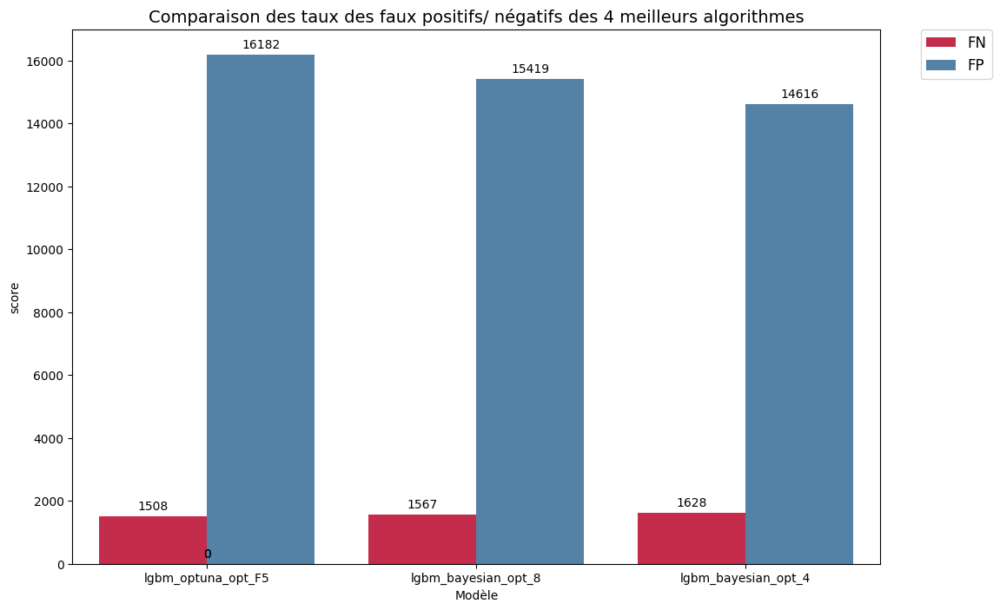

The palette list has more values (4) than needed (2), which may not be intended.


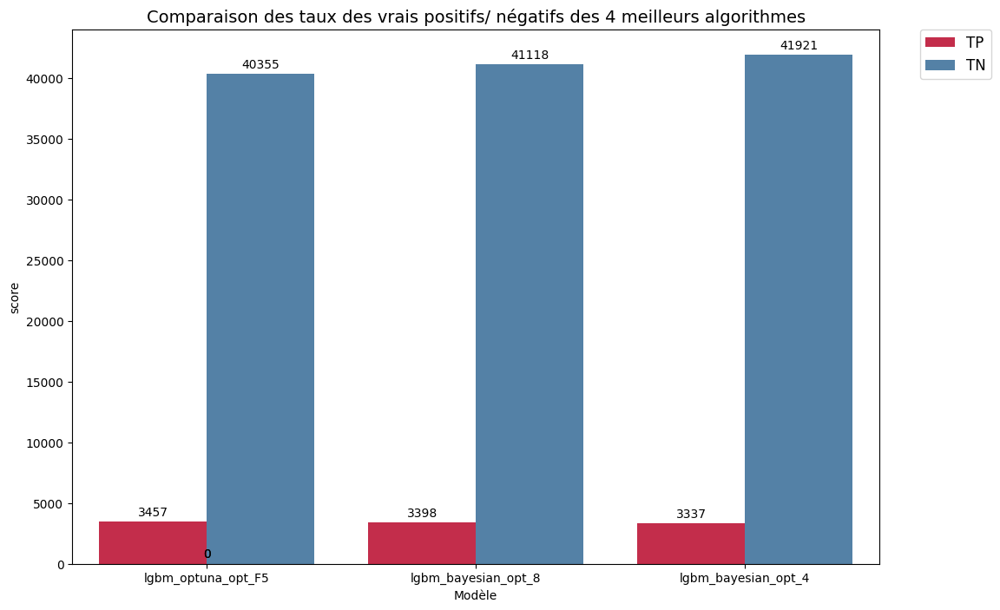

In [308]:
# Comparaison visuelle des 4 algorithmes les plus performants
df_comp_best = df_comp[df_comp['Modèle'].isin(
    ['lgbm_optuna_opt_5', 'lgbm_bayesian_opt_8',
     'lgbm_optuna_opt_F5', 'lgbm_bayesian_opt_4'])]

# Renseignements sur les modèles
df_comp_display = df_comp_best[['Modèle', 'Metrique', 'Optimisation',
                               'Class_weight']].style.hide_index()
display(df_comp_display)

# Faux négatifs/Faux positifs
comparaison_taux_melt_false = \
    pd.melt(df_comp_best, id_vars=['Modèle'], value_name='score',
            value_vars=['FN', 'FP'])
# Visualisation
plt.figure(figsize=(12, 8))
ax= sns.barplot(x=comparaison_taux_melt_false['Modèle'],
                y=comparaison_taux_melt_false['score'],
            hue=comparaison_taux_melt_false['variable'],
            palette=['Crimson', 'SteelBlue', 'Crimson', 'SteelBlue'])
plt.title('Comparaison des taux des faux positifs/ négatifs des 4 meilleurs algorithmes', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width()/2.,
            height + 200,
            int(height),
            ha="center") 
plt.show()

# Vrais négatifs/Vrais positifs
comparaison_taux_melt_true = \
    pd.melt(df_comp_best, id_vars=['Modèle'], value_name='score',
            value_vars=['TP', 'TN'])
# Visualisation
plt.figure(figsize=(12, 8))
total = float(len(comparaison_taux_melt_true))
ax = sns.barplot(x=comparaison_taux_melt_true['Modèle'],
                 y=comparaison_taux_melt_true['score'],
                 hue=comparaison_taux_melt_true['variable'],
                 palette=['Crimson', 'SteelBlue', 'Crimson', 'SteelBlue'])
plt.title('Comparaison des taux des vrais positifs/ négatifs des 4 meilleurs algorithmes', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width()/2.,
            height + 500,
            int(height),
            ha="center") 
plt.show()

**Bilan** :
***
- Le modèle **lgbm_otuna_opt_F5** (LightGBM class_weight='balanced' avec une optimisation bayésienne, la métrique F10-score) détecte :
    - le moins de faux négatifs (des clients détectés non défaillants mais qui ne remboursent pas le prêt) 
    - et le plus de vrais positifs (des clients détéctés défaillants qui sont défaillants),
- Ce modèle détecte un peu plus de faux positifs (des clients qui sont détectés défaillants mais qui ne sont pas défaillants et rembourseraient leur prêt) que le modèle **lgbm_bayesian_opt_4** (LightGBM class_weight='balanced' sans optimisation bayésienne ou optuna avec la métrique par défaut logloss). Mais nous n'avons aucune consigne de notre client sur le niveau de détection des faux positifs.

On peut désormais tenter d'optimiser ce modèle **lgbm_otuna_opt_F5** en recherchant le seuil de probabilité optimal ayant un impact sur la décision de classer en classe 0 (non-défaillant) ou 1 (défaillant).

**Bilan des métriques**

Modèle,Metrique,Optimisation,Class_weight
lgbm_optuna_opt_F5,F5,optuna,non
lgbm_bayesian_opt_8,F10,bayes_opt,"oui,oui"
lgbm_bayesian_opt_4,roc_auc,bayes_opt,oui


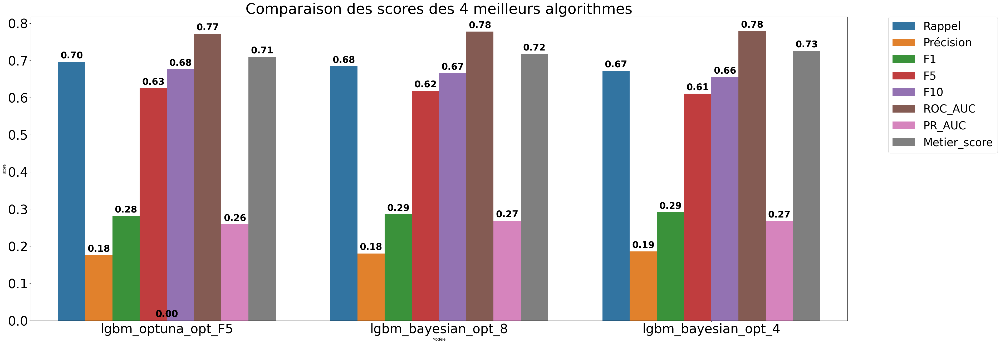

Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score
0.696274,0.176027,0.281011,0.625205,0.676479,0.771812,0.258654,0.709816
0.684391,0.180581,0.285762,0.618069,0.665994,0.777609,0.268485,0.717565
0.672105,0.185874,0.291212,0.610665,0.655137,0.778641,0.268063,0.725770


In [309]:
# Comparaison visuelle des 4 algorithmes les plus performants
df_comp_score = df_comp[df_comp['Modèle'].isin(
    ['lgbm_optuna_opt_5', 'lgbm_optuna_opt_F5', 'lgbm_bayesian_opt_4',
     'lgbm_bayesian_opt_8'])]

# Renseignements sur les modèles
df_comp_display = df_comp_score[['Modèle', 'Metrique', 'Optimisation',
                               'Class_weight']].style.hide_index()
display(df_comp_display)

# Scores
comparaison_score_melt = \
    pd.melt(df_comp_score, id_vars=['Modèle'], value_name='score',
            value_vars=['Rappel', 'Précision', 'F1', 'F5', 'F10',
                        'ROC_AUC', 'PR_AUC', 'Metier_score'])
# Visualisation
plt.figure(figsize=(40, 15))
ax= sns.barplot(x=comparaison_score_melt['Modèle'],
                y=comparaison_score_melt['score'],
            hue=comparaison_score_melt['variable'])
plt.title('Comparaison des scores des 4 meilleurs algorithmes',
          fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=30)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width()/2.,
            height + 0.01,
            '{:1.2f}'.format(height),
            ha="center",
            fontsize=25,
            fontweight='bold') 
plt.show()

df_comp_score[['Rappel', 'Précision', 'F1', 'F5', 'F10', 'ROC_AUC',
               'PR_AUC', 'Metier_score']].style.hide_index()

**Bilan** :
***
- Les différentes métriques sont proches pour tous les modèles avec un léger avantage pour le rappel pour le modèle **lgbm_otuna_opt_F5** qui s'explique pour le nombre beta=10 qui favorise la détection des classes positives.

### <span style='background:orange'>5.7. Seuil de probabilité optimal</span>

In [310]:
df_res_seuil = pd.DataFrame({})

**Seuil de probabilité optimal du modèle lgbm_optuna_opt_F5**

In [327]:
# Chargement du meilleur modèle
fic_lgbm_optuna_opt_F5 = \
    'pickle_files/modele_lgbm_optuna_opt_F5.pickle'
with open(fic_lgbm_optuna_opt_F5, 'rb') as df_mod2:
    lgbm_optuna_opt_F5 = pickle.load(df_mod2)
lgbm_optuna_opt_F5

LGBMClassifier(class_weight='balanced', colsample_bytree=0.883696173865355,
               force_col_wise=True, max_depth=4, min_child_samples=37,
               min_child_weight=0.9053832802852111, n_jobs=-1, num_leaves=8,
               objective='binary', reg_alpha=0.0013343227256418153,
               reg_lambda=1.1168060057563535e-06, subsample=0.876335534267455,
               subsample_freq=4, verbosity=-1)

**Recherche du seuil optimal**

Score métrique métier maximal : 0.7958642895909441
Seuil maximal : 0.75


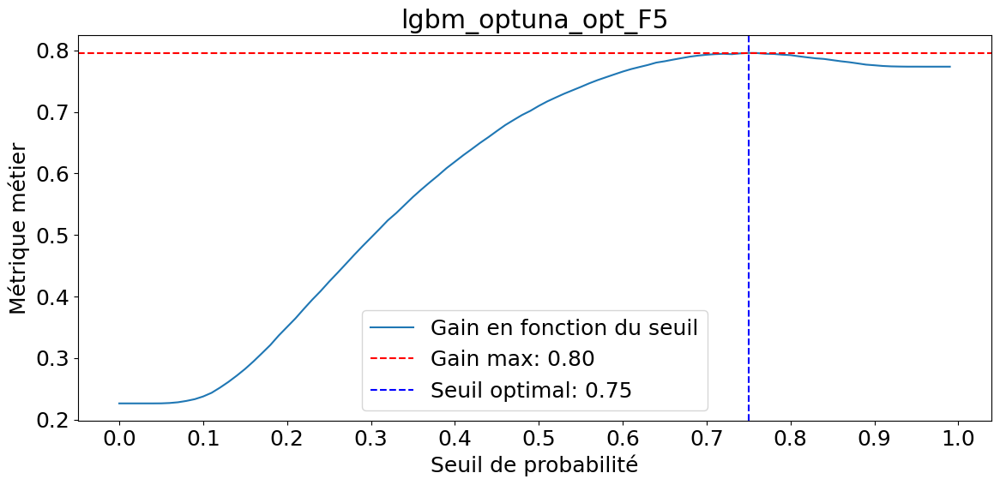

In [387]:
# taux_tn=1, taux_fp=0, taux_fn=-10, taux_tp=0
fonctions_data.determiner_seuil_probabilite(lgbm_optuna_opt_F5,
                                          X_valid, y_valid,
                                          'lgbm_optuna_opt_F5')

**Prise en compte du seuil: scores de performance**

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F5_seuil,0.248540,0.331988,0.284266,0.250966,0.249160,0.771812,0.258654,0.795864,19.677426,20.414447,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015


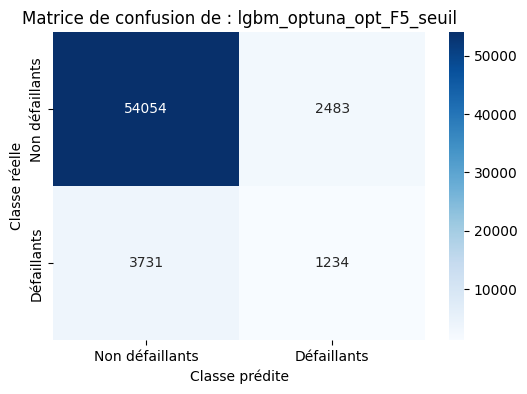

In [323]:
df_res_seuil = fonctions_data.process_classification_seuil(lgbm_optuna_opt_F5, 0.75,
                                             X_train, X_valid, y_train,
                                             y_valid, df_res_seuil,
                                            'lgbm_optuna_opt_F5_seuil')

- La métrique en question n'est pas bonne: en effet celui-ci a fait augmenter les FP (faux positifs)

**Recherche du seuil avec la métrque F10**

Score F10 maximal : 0.8996377575950999
Seuil maximal : 0.14


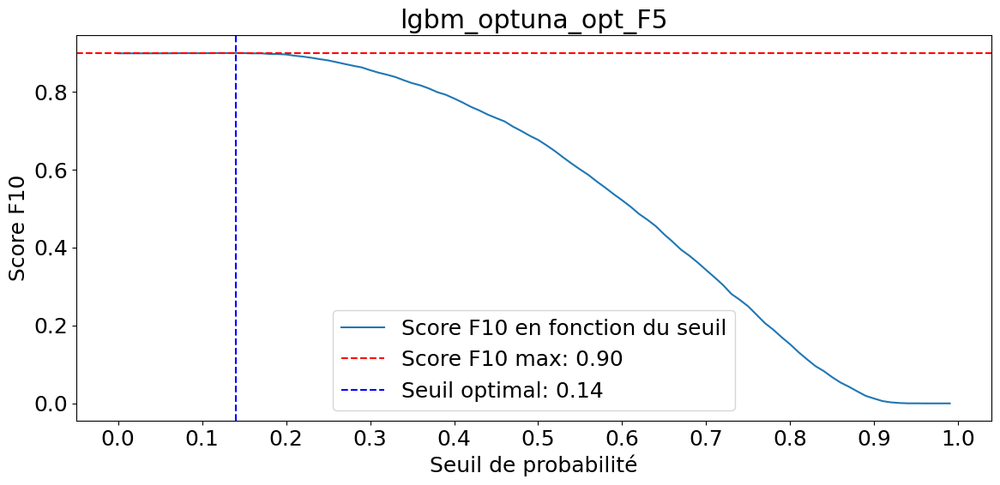

In [395]:
# Score F10 en fonction du seuil
fonctions_data.determiner_seuil_probabilite_F10(lgbm_optuna_opt_F5,
                                              X_valid, y_valid,
                                             'lgbm_optuna_opt_F5')

Modèle,Rappel,Précision,F1,F5,F10,ROC_AUC,PR_AUC,Metier_score,Durée_train,Durée_tot,Train_roc_auc_CV,Train_roc_auc_CV +/-,Test_roc_auc_CV,Test_roc_auc_CV +/-,Train_recall_CV,Train_recall_CV +/-,Test_recall_CV,Test_recall_CV +/-,Train_precision_CV,Train_precision_CV +/-,Test_precision_CV,Test_precision_CV +/-
lgbm_optuna_opt_F5_seuil,0.248540,0.331988,0.284266,0.250966,0.249160,0.771812,0.258654,0.795864,19.677426,20.414447,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015
lgbm_optuna_opt_F5_seuil,0.994965,0.085024,0.156661,0.704839,0.899638,0.771812,0.258654,0.271494,15.053935,15.976051,0.786330,0.000499,0.774407,0.004723,0.718295,0.001584,0.702316,0.007077,0.179713,0.000499,0.175681,0.002015


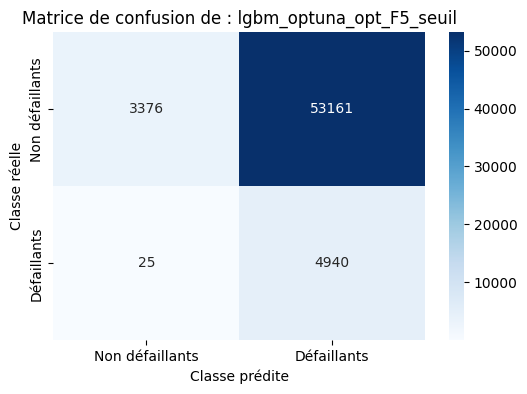

In [331]:
df_res_seuil = fonctions_data.process_classification_seuil(lgbm_optuna_opt_F5, 0.14,
                                             X_train, X_valid, y_train,
                                             y_valid, df_res_seuil,
                                            'lgbm_optuna_opt_F5_seuil')

- Le taux de FN est très faible mais cela signifie que le prêt n'est plus accordé à personne ! Ce n'est pas le but de la banque qui doit gagner de l'argent avec les intérêts des prêts accordés.

- Le seuil par défaut à 0.5 sera conservé et le modèle final sera **lgbm_optuna_opt_F5**.

In [332]:
# Sauvegarde du meilleur modèle dans best_model
fic_best_model = \
    'pickle_files/best_model.pickle'
with open(fic_best_model, 'wb') as f:
    pickle.dump(lgbm_optuna_opt_F5, f, pickle.HIGHEST_PROTOCOL)

In [333]:
# Chargement du meilleur modèle
fic_best_model = 'pickle_files/best_model.pickle'
with open(fic_best_model, 'rb') as df_best_model:
    best_model = pickle.load(df_best_model)
best_model

LGBMClassifier(class_weight='balanced', colsample_bytree=0.883696173865355,
               force_col_wise=True, max_depth=4, min_child_samples=37,
               min_child_weight=0.9053832802852111, n_jobs=-1, num_leaves=8,
               objective='binary', reg_alpha=0.0013343227256418153,
               reg_lambda=1.1168060057563535e-06, subsample=0.876335534267455,
               subsample_freq=4, verbosity=-1)

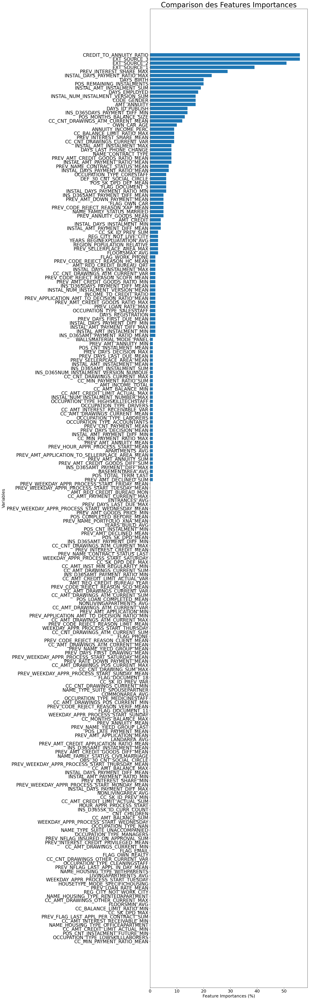

In [350]:
# Affichage des variables les plus importantes normalisées sur le meilleur modèle
#df_lightgbm_norm = plot_feature_importances(df_lightgbm)

feature_importance_values = best_model.feature_importances_
feature_names = list(X_train.columns)
fonctions_data.plot_features_importance(feature_importance_values,
                                      feature_names, (12, 75))

**Features les plus impactants**

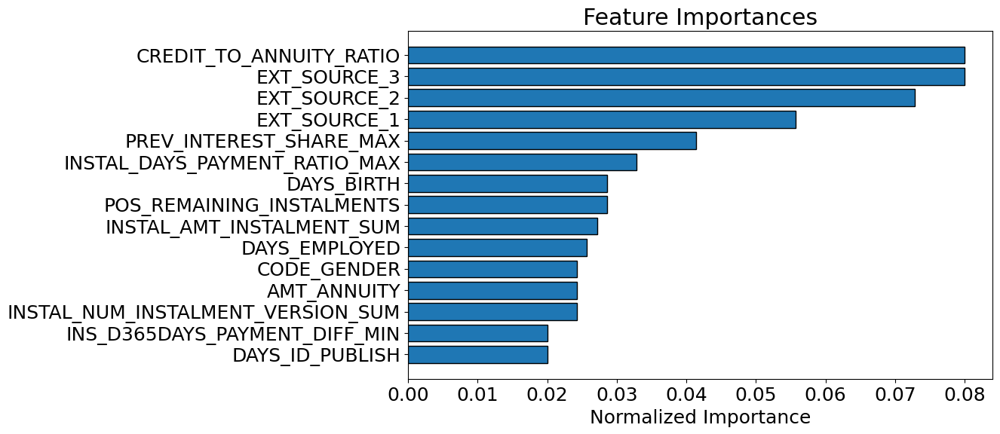

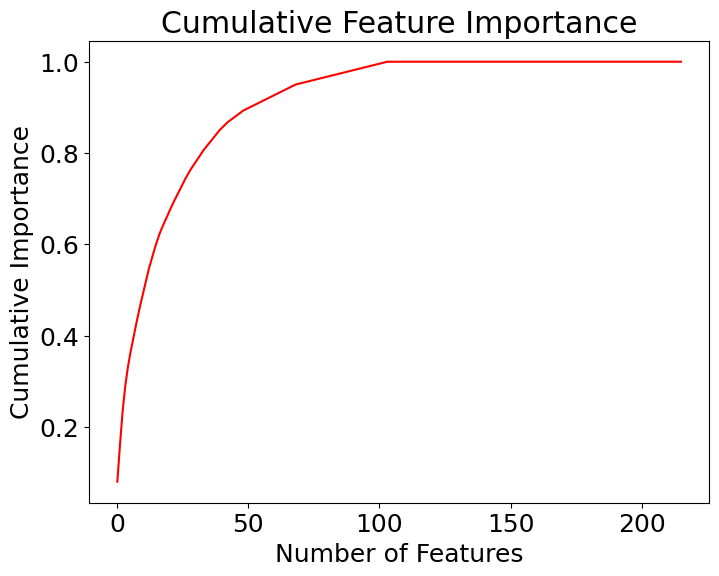

52 features required for 0.90 of cumulative importance


In [352]:
# Impact des features importance cumulées
feature_importance_values = best_model.feature_importances_
feature_names = list(X_train.columns)
feature_importances = pd.DataFrame({'feature': feature_names,
                                    'importance': feature_importance_values})
# Show the feature importances for the new features
df_featimp = fonctions_data.plot_feature_importances(feature_importances)

### <span style='background:orange'>4.8. SHAP</span>

Le diagramme de valeurs SHAP ci-dessous indique également comment chaque caractéristique impacte la variable dépendante.

**Les valeurs de SHAP sont représentées pour chaque variable dans leur ordre d’importance. Chaque point représente une valeur de SHAP (pour un client) : les points rouges représentent des valeurs élevées de la variable et les points bleus des valeurs basses de la variable.**
*
e.

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


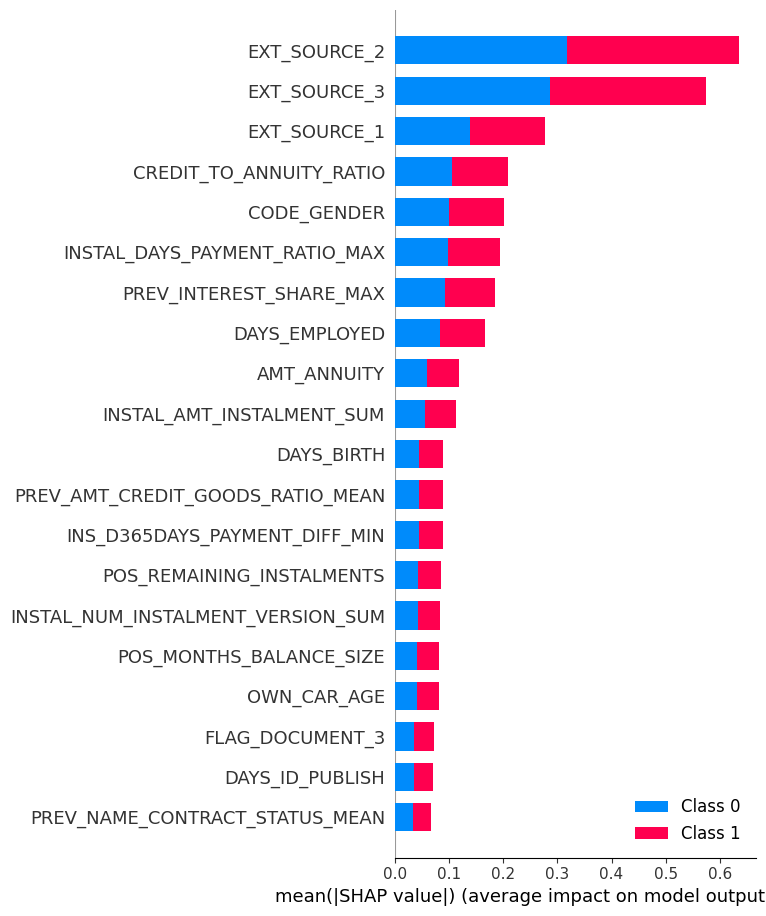

In [396]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_valid)
# Summary plot
shap.summary_plot(shap_values, X_valid)

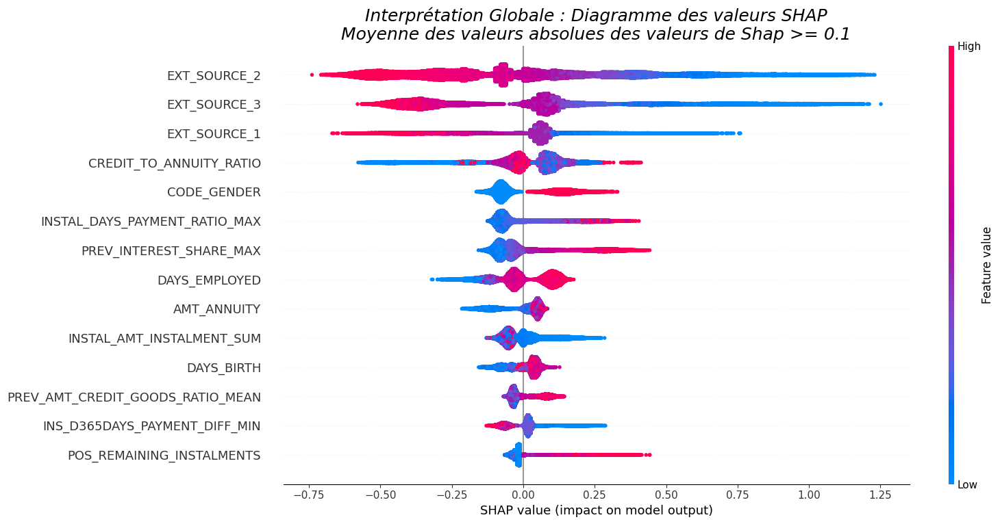

In [400]:
# print the JS visualization code to the notebook
shap.initjs()

shap.summary_plot(shap_values[1], 
                  features=X_valid,
                  feature_names=X_valid.columns,
                  plot_size=(16, 8),
                  plot_type="dot",
                  max_display=14,
                  show = False)
plt.title("Interprétation Globale : Diagramme des valeurs SHAP\nMoyenne des valeurs absolues des valeurs de Shap >= 0.1", 
          fontsize=18, fontstyle='italic')
plt.tight_layout()
plt.show()

### Interprétation
14 variables ont un impact significatif sur la prédiction (Moyenne des valeurs absolues des valeurs de Shap >= 0.1). La première est sans contexte le score normalisé à partir d'une source de données externes.

### Score normalisé à partir d'une source de données externe

Plus la valeur du "Score normalisé à partir d'une source de données externe" est faible (points de couleur bleue), et plus la valeur Shap est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

Nous pouvons obtenir un aperçu plus approfondi de l'ef.fet

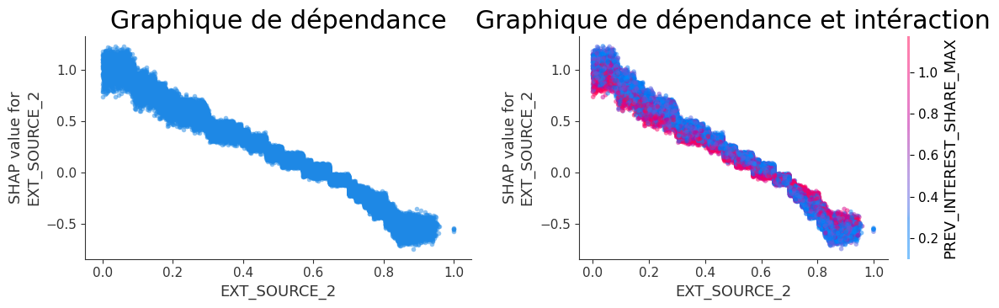

In [405]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("EXT_SOURCE_2", shap_values[1], X_valid, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance")

ax2 = fig.add_subplot(122)
shap.dependence_plot("EXT_SOURCE_2", shap_values[1], X_valid, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et intéraction")

plt.tight_layout()
plt.show()

## Interprétation locale du modèle

Pour comprendre et interpréter visuellement les résutats du modèle localement, c'est-à-dire pour une instance (ici un client) il existe trois alternatives: force plot, decision plot et waterfall plot.

Pour une instance, ces trois représentations sont redondantes, elles représentent l’information de manière très similaire. En même temps, certains éléments de ces graphiques sont complémentaires. En mettant côte à côte les trois, on comprend d’une manière plus intuitive le résultat. Le force plot est bon pour voir où se place le “output value” par rapport à la “base value”. Nous observons également quelles variables ont un impact positif (rouge) ou négatif (bleu) sur la prédiction et l’amplitude de cet impact. Le water plot permet aussi de voir l’amplitude et la nature d’impact d’une variable avec sa quantification. Il permet de voir également l’ordre d’importance des variables et les valeurs prises par chacune des variables pour l’instance étudiée. Le Decision plot permet d’observer l’amplitude de chaque changement, “une trajectoire” prise par une instance pour les valeurs des variables affichées.

On peut aussi représenter plusieurs instances en même temps avec le force plot et le decision plot.

In [427]:
# Make predictions
y_pred_lgbm = best_model.predict(X_valid)
y_prob_lgbm = best_model.predict_proba(X_valid)

In [408]:
explainer_shap = shap.TreeExplainer(best_model) 
shap_values = explainer_shap.shap_values(X_valid)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [442]:
y_prob_lgbm_df = pd.DataFrame(y_prob_lgbm, columns=['proba_classe_0', 'proba_classe_1'])

In [443]:
y_prob_lgbm_df[y_prob_lgbm_df['proba_classe_1'] > 0.9].sort_values(by='proba_classe_1', ascending=False)

,proba_classe_0,proba_classe_1
8493,0.042145,0.957855
29942,0.059543,0.940457
50994,0.063597,0.936403
53738,0.067908,0.932092
11550,0.067934,0.932066
...,...,...
25646,0.099085,0.900915
37303,0.099291,0.900709
17248,0.099610,0.900390
15435,0.099928,0.900072


In [441]:
# load JS visualization code to notebook
shap.initjs()

idx = 5555
print("Client numero : ", X_test_orig.iloc[idx, 0])
print("Model Prediction : Classe", y_pred_lgbm[idx])
print(f"Il y a {y_prob_lgbm[idx][1]:.1%} de risques que le client ait des difficultés de paiement")
print("__"*75)
shap.force_plot(explainer_shap.expected_value[1], 
                shap_values[1][idx,:], 
                X_valid.iloc[idx,:], 
                link='logit',
                figsize=(20, 8),
                ordering_keys=True,
                text_rotation=0,
                contribution_threshold=0.05)

Client numero :  140569
Model Prediction : Classe 1
Il y a 51.0% de risques que le client ait des difficultés de paiement
______________________________________________________________________________________________________________________________________________________


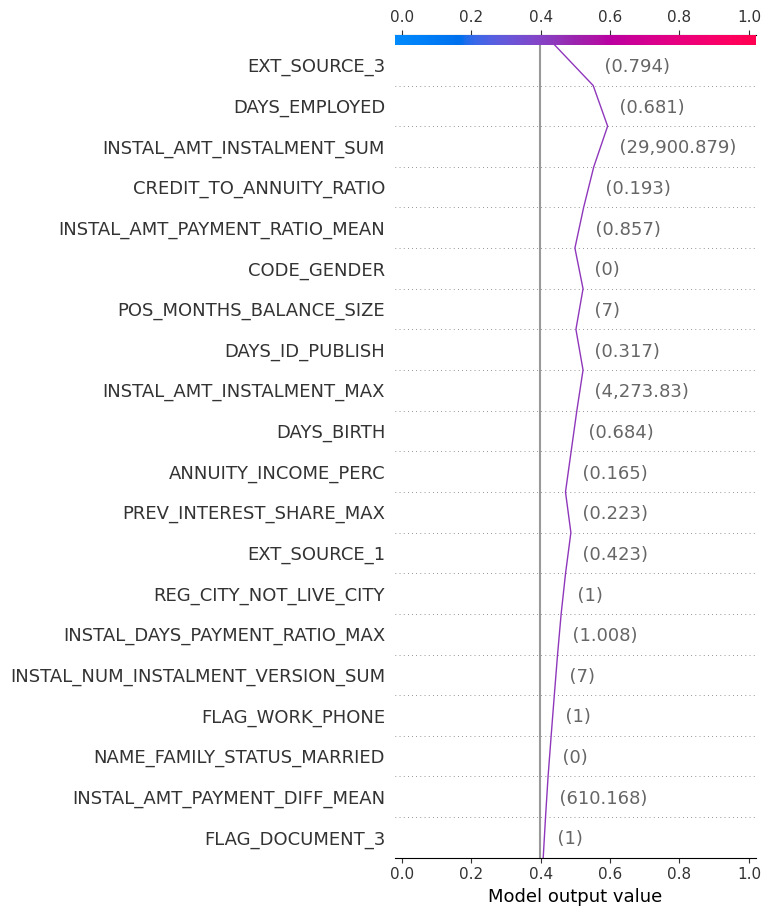

In [434]:
shap.decision_plot(explainer_shap.expected_value[1], 
                   shap_values[1][idx,:], 
                   X_valid.iloc[idx,:], 
                   feature_names=X_valid.columns.to_list(),
                   feature_order='importance',
                   #feature_display_range=slice(None, -15, -1),
                   link='logit')

## Constitution de groupes de clients selon leur probabilité de défaut de paiement

In [446]:
shap_values_df = pd.DataFrame(data=shap_values[1], columns=X_valid.columns)
shap_values_df.shape

(61502, 216)

In [447]:
df_groupes = pd.concat([y_prob_lgbm_df['proba_classe_1'], shap_values_df], axis=1)
df_groupes.shape

(61502, 217)

In [448]:
df_groupes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61502 entries, 0 to 61501
Columns: 217 entries, proba_classe_1 to EXT_SOURCE_2
dtypes: float64(217)
memory usage: 101.8 MB


In [472]:
df_groupes.columns

Index(['proba_classe_1', 'CREDIT_TO_ANNUITY_RATIO',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'INSTAL_AMT_PAYMENT_DIFF_MIN', 'POS_CNT_INSTALMENT_MIN',
       'PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN',
       'PREV_DAYS_FIRST_DRAWING_MEAN', 'CC_AMT_DRAWINGS_ATM_CURRENT_MEAN',
       'PREV_APPLICATION_AMT_TO_DECISION_RATIO_MIN',
       ...
       'CC_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'POS_LOAN_COMPLETED_MEAN',
       'PREV_AMT_DECLINED_SUM', 'INSTAL_AMT_INSTALMENT_MIN',
       'INSTAL_AMT_PAYMENT_RATIO_MEAN', 'CC_CNT_DRAWINGS_CURRENT_VAR',
       'PREV_LOAN_RATE_MEAN', 'PREV_DAYS_DECISION_MEAN', 'EXT_SOURCE_2',
       'typologie_clients'],
      dtype='object', length=218)

In [449]:
df_groupes['proba_classe_1'].describe()

count    61502.000000
mean         0.409348
std          0.195587
min          0.040816
25%          0.249259
50%          0.382179
75%          0.553043
max          0.957855
Name: proba_classe_1, dtype: float64

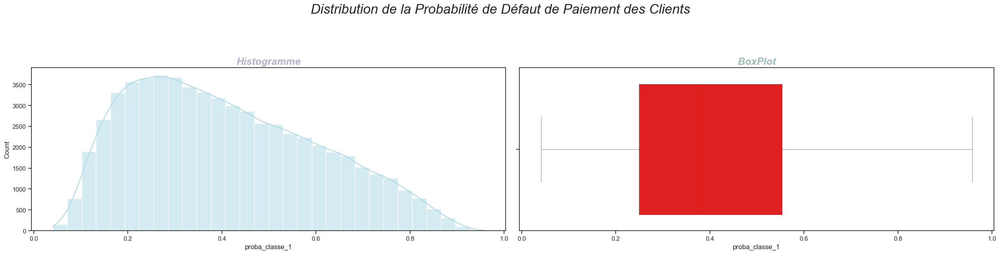

In [454]:
sns.set(style="ticks", rc={'figure.figsize': (25, 6)}, palette="rocket")

plt.subplot(1, 2, 1)
ax1 = sns.histplot(data=df_groupes, x='proba_classe_1',
                   color="lightblue", kde=True, bins=30)
plt.title("Histogramme", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold", color="#b5b1d0")

plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data=df_groupes, x='proba_classe_1',
                  color="red", linewidth=0.5)
plt.title("BoxPlot", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold", color="#9ebeb8")

plt.suptitle("Distribution de la Probabilité de Défaut de Paiement des Clients\n",
             y=1.05, fontsize=24, fontstyle='italic')

plt.show()

In [451]:
pd.qcut(df_groupes.proba_classe_1, precision=1, q=5).head(7)

0                      (0.2, 0.3]
1                      (0.2, 0.3]
2                      (0.3, 0.4]
3                      (0.4, 0.6]
4                      (0.4, 0.6]
5    (-0.060000000000000005, 0.2]
6                      (0.4, 0.6]
Name: proba_classe_1, dtype: category
Categories (5, interval[float64, right]): [(-0.060000000000000005, 0.2] < (0.2, 0.3] < (0.3, 0.4] < (0.4, 0.6] < (0.6, 1.0]]

In [455]:
df_groupes['typologie_clients'] = pd.qcut(df_groupes.proba_classe_1,
                                          q=5,
                                          precision=1,
                                          labels=['20%_et_moins',
                                                  '21%_30%',
                                                  '31%_40%',
                                                  '41%_60%',
                                                  '61%_et_plus']
                                          )
df_groupes['typologie_clients'].value_counts()

20%_et_moins    12301
61%_et_plus     12301
21%_30%         12300
31%_40%         12300
41%_60%         12300
Name: typologie_clients, dtype: int64

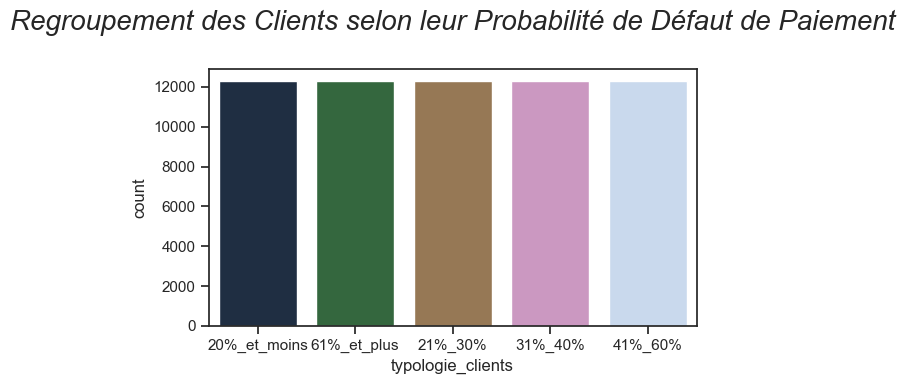

In [458]:
# Créer une figure et un axe
fig, ax = plt.subplots(figsize=(6, 4))

# Créer le countplot
sns.countplot(data=df_groupes, 
              x='typologie_clients', 
              palette='cubehelix', 
              ax=ax, 
              order=df_groupes['typologie_clients'].value_counts().index)

# Ajouter le titre
plt.title("Regroupement des Clients selon leur Probabilité de Défaut de Paiement\n",
          loc="center", fontsize=20, fontstyle='italic')

# Afficher le graphique
plt.show()

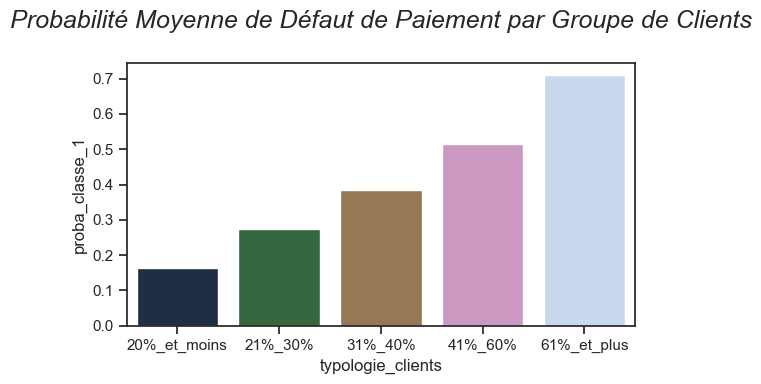

In [462]:
def plot_aggregation(df, group_col, value_col, aggreg, palette, ax, orient, size_labels):
    # Agréger les données
    aggregated_data = df.groupby(group_col)[value_col].agg(aggreg).reset_index()
    
    # Tracer le graphique
    sns.barplot(x=group_col if orient == 'v' else value_col, 
                y=value_col if orient == 'v' else group_col, 
                data=aggregated_data, 
                palette=palette, 
                ax=ax)
    
    # Ajuster les étiquettes
    ax.set_xlabel(group_col if orient == 'v' else value_col, fontsize=size_labels)
    ax.set_ylabel(value_col if orient == 'v' else group_col, fontsize=size_labels)

# Exemple d'utilisation
fig, ax = plt.subplots(figsize=(6, 4))

plot_aggregation(df=df_groupes,
                 group_col='typologie_clients',
                 value_col='proba_classe_1',
                 aggreg='mean',
                 palette="cubehelix", ax=ax, orient='v', size_labels=12)

plt.title("Probabilité Moyenne de Défaut de Paiement par Groupe de Clients\n",
          loc="center", fontsize=18, fontstyle='italic')

plt.show()

In [463]:
# Moyenne des variables par classe
df_groupes_mean = df_groupes.groupby(['typologie_clients']).mean()

In [464]:
df_groupes_mean = df_groupes_mean.rename_axis('typologie_clients').reset_index()
df_groupes_mean

,typologie_clients,proba_classe_1,CREDIT_TO_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,INSTAL_AMT_PAYMENT_DIFF_MIN,POS_CNT_INSTALMENT_MIN,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN,PREV_DAYS_FIRST_DRAWING_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,...,PREV_NAME_YIELD_GROUP_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,POS_LOAN_COMPLETED_MEAN,PREV_AMT_DECLINED_SUM,INSTAL_AMT_INSTALMENT_MIN,INSTAL_AMT_PAYMENT_RATIO_MEAN,CC_CNT_DRAWINGS_CURRENT_VAR,PREV_LOAN_RATE_MEAN,PREV_DAYS_DECISION_MEAN,EXT_SOURCE_2
0,20%_et_moins,0.164467,-0.076970,0.0,-0.000572,-0.001156,0.0,0.0,0.0,0.0,...,0.0,-0.010921,0.0,-0.000783,-0.000810,-0.014399,-0.009084,0.0,-0.000724,-0.288962
1,21%_30%,0.274741,-0.015153,0.0,0.000070,-0.000297,0.0,0.0,0.0,0.0,...,0.0,-0.007937,0.0,-0.000182,0.000038,-0.005064,-0.005838,0.0,-0.000562,-0.153403
2,31%_40%,0.383216,0.003999,0.0,0.000366,0.000008,0.0,0.0,0.0,0.0,...,0.0,-0.003802,0.0,0.000121,0.000308,0.001408,-0.002617,0.0,-0.000410,-0.024027
3,41%_60%,0.515626,0.026081,0.0,0.000664,0.000155,0.0,0.0,0.0,0.0,...,0.0,0.002446,0.0,0.000459,0.001077,0.006003,0.001805,0.0,-0.000165,0.109789
4,61%_et_plus,0.708688,0.065874,0.0,0.000626,0.000450,0.0,0.0,0.0,0.0,...,0.0,0.014858,0.0,0.000850,0.002491,0.012112,0.011545,0.0,0.000371,0.340332


In [465]:
idx = 5555
shap_client = df_groupes[df_groupes.index == idx]
shap_client

,proba_classe_1,CREDIT_TO_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,INSTAL_AMT_PAYMENT_DIFF_MIN,POS_CNT_INSTALMENT_MIN,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN,PREV_DAYS_FIRST_DRAWING_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,PREV_APPLICATION_AMT_TO_DECISION_RATIO_MIN,...,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,POS_LOAN_COMPLETED_MEAN,PREV_AMT_DECLINED_SUM,INSTAL_AMT_INSTALMENT_MIN,INSTAL_AMT_PAYMENT_RATIO_MEAN,CC_CNT_DRAWINGS_CURRENT_VAR,PREV_LOAN_RATE_MEAN,PREV_DAYS_DECISION_MEAN,EXT_SOURCE_2,typologie_clients
5555,0.510115,-0.016151,0.0,0.0047,0.001215,0.0,0.0,0.0,0.0,0.0,...,0.148338,0.0,0.000805,0.007942,-0.018785,-0.001725,0.0,-0.001083,-0.158527,41%_60%


In [466]:
groupe_client = shap_client['typologie_clients'].values
groupe_client[0]

'41%_60%'

In [467]:
df_groupes_mean[df_groupes_mean['typologie_clients'] == groupe_client[0]]

,typologie_clients,proba_classe_1,CREDIT_TO_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,INSTAL_AMT_PAYMENT_DIFF_MIN,POS_CNT_INSTALMENT_MIN,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN,PREV_DAYS_FIRST_DRAWING_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,...,PREV_NAME_YIELD_GROUP_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,POS_LOAN_COMPLETED_MEAN,PREV_AMT_DECLINED_SUM,INSTAL_AMT_INSTALMENT_MIN,INSTAL_AMT_PAYMENT_RATIO_MEAN,CC_CNT_DRAWINGS_CURRENT_VAR,PREV_LOAN_RATE_MEAN,PREV_DAYS_DECISION_MEAN,EXT_SOURCE_2
3,41%_60%,0.515626,0.026081,0.0,0.000664,0.000155,0.0,0.0,0.0,0.0,...,0.0,0.002446,0.0,0.000459,0.001077,0.006003,0.001805,0.0,-0.000165,0.109789


In [468]:
comparaison_client_groupe = pd.concat([df_groupes[df_groupes.index == idx], 
                                      df_groupes_mean],
                                      axis = 0)
comparaison_client_groupe['typologie_clients'] = np.where(comparaison_client_groupe.index == idx, 
                                                          X_valid.iloc[idx, 0],
                                                          comparaison_client_groupe['typologie_clients'])

In [469]:
comparaison_client_groupe

,proba_classe_1,CREDIT_TO_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,INSTAL_AMT_PAYMENT_DIFF_MIN,POS_CNT_INSTALMENT_MIN,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN,PREV_DAYS_FIRST_DRAWING_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,PREV_APPLICATION_AMT_TO_DECISION_RATIO_MIN,...,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,POS_LOAN_COMPLETED_MEAN,PREV_AMT_DECLINED_SUM,INSTAL_AMT_INSTALMENT_MIN,INSTAL_AMT_PAYMENT_RATIO_MEAN,CC_CNT_DRAWINGS_CURRENT_VAR,PREV_LOAN_RATE_MEAN,PREV_DAYS_DECISION_MEAN,EXT_SOURCE_2,typologie_clients
5555,0.510115,-0.016151,0.0,0.004700,0.001215,0.0,0.0,0.0,0.0,0.0,...,0.148338,0.0,0.000805,0.007942,-0.018785,-0.001725,0.0,-0.001083,-0.158527,0.4915
0,0.164467,-0.076970,0.0,-0.000572,-0.001156,0.0,0.0,0.0,0.0,0.0,...,-0.010921,0.0,-0.000783,-0.000810,-0.014399,-0.009084,0.0,-0.000724,-0.288962,20%_et_moins
1,0.274741,-0.015153,0.0,0.000070,-0.000297,0.0,0.0,0.0,0.0,0.0,...,-0.007937,0.0,-0.000182,0.000038,-0.005064,-0.005838,0.0,-0.000562,-0.153403,21%_30%
2,0.383216,0.003999,0.0,0.000366,0.000008,0.0,0.0,0.0,0.0,0.0,...,-0.003802,0.0,0.000121,0.000308,0.001408,-0.002617,0.0,-0.000410,-0.024027,31%_40%
3,0.515626,0.026081,0.0,0.000664,0.000155,0.0,0.0,0.0,0.0,0.0,...,0.002446,0.0,0.000459,0.001077,0.006003,0.001805,0.0,-0.000165,0.109789,41%_60%
4,0.708688,0.065874,0.0,0.000626,0.000450,0.0,0.0,0.0,0.0,0.0,...,0.014858,0.0,0.000850,0.002491,0.012112,0.011545,0.0,0.000371,0.340332,61%_et_plus


In [470]:
nmp = comparaison_client_groupe.drop(
    labels=['typologie_clients', "proba_classe_1"], axis=1).to_numpy()

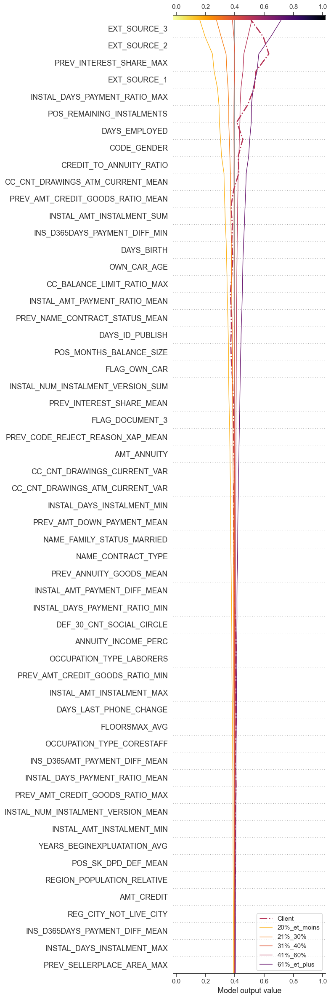

In [471]:
shap.decision_plot(explainer_shap.expected_value[1], 
                   nmp, 
                   feature_names=comparaison_client_groupe.drop(labels=['typologie_clients', "proba_classe_1"], axis=1).columns.to_list(),
                   feature_order='importance',
                   highlight=0,
                   legend_labels=['Client', '20%_et_moins', '21%_30%', '31%_40%', '41%_60%', '61%_et_plus'],
                   plot_color='inferno_r',
                   legend_location='lower right',
                   feature_display_range=slice(None, -57, -1),
                   link='logit')